# Project: Analyze Youtube Trending Videos

In this report we will try to find out about treding videos in USA. This dataset is taken from <a href="https://www.kaggle.com/datasnaek/youtube-new">Kaggle</a>.

## Table of Contents

<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#wrangling">Data Wrangling</a></li>
<li><a href="#eda">Exploratory Data Analysis</a></li>
<li><a href="#conclusions">Conclusions and Limitations</a></li>
</ul>


<a id='intro'></a>
## Introduction

YouTube (the world-famous video sharing website) maintains a list of the top trending videos on the platform. According to Variety magazine, “To determine the year’s top-trending videos, YouTube uses a combination of factors including measuring users interactions (number of views, shares, comments, and likes). Note that they’re not the most-viewed videos overall for the calendar year”. Top performers on the YouTube trending list are music videos (such as the famously virile “Gangam Style”), celebrity and/or reality TV performances, and the random dude-with-a-camera viral videos that YouTube is well-known for. 

The given data set has data for 5 different regions. This report is a work on USA dataset which has a daily record of the top trending YouTube videos from November 2017 to June 2018.

Here we will mainly focus on what categories make most top trending videos and how are they received by the users(based on likes, dislikes, and comments) and if its associated to any big channels.


In [1]:
#lets import all the packages we need.
import pandas as pd
import numpy as np
import json
#from datetime import datetime
#from PIL import Image
#from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

%matplotlib inline
warnings.filterwarnings('ignore')

<a id='wrangling'></a>
## Data Wrangling


**Get Data**

In [2]:
#load the csv file
us_videos = pd.read_csv('USvideos.csv')

In [3]:
#get the data from json file

#create a empty dictionary to store the data from json file
category_dict = {}

#open the file
with open("US_category_id.json") as file:
    categories = json.load(file)["items"] #items kep has id and category name

for category in categories:#loop for getting the id and title and storing it in dictionary
    category_dict[int(category["id"])] = category["snippet"]["title"]

#saving the extracted category name to the original dataframe 
us_videos['category_name'] = us_videos['category_id'].map(category_dict)

In [4]:
#view the files
us_videos.info() #dtypes and number of records
us_videos.head() #glimpse of data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40949 entries, 0 to 40948
Data columns (total 17 columns):
video_id                  40949 non-null object
trending_date             40949 non-null object
title                     40949 non-null object
channel_title             40949 non-null object
category_id               40949 non-null int64
publish_time              40949 non-null object
tags                      40949 non-null object
views                     40949 non-null int64
likes                     40949 non-null int64
dislikes                  40949 non-null int64
comment_count             40949 non-null int64
thumbnail_link            40949 non-null object
comments_disabled         40949 non-null bool
ratings_disabled          40949 non-null bool
video_error_or_removed    40949 non-null bool
description               40379 non-null object
category_name             40949 non-null object
dtypes: bool(3), int64(5), object(9)
memory usage: 4.5+ MB


,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment


**Lets check for quality and tidiness issues with the dataset.**

In [5]:
#lets check how many unique values we have in the dataset
us_videos.nunique()

video_id                   6351
trending_date               205
title                      6455
channel_title              2207
category_id                  16
publish_time               6269
tags                       6055
views                     40478
likes                     29850
dislikes                   8516
comment_count             13773
thumbnail_link             6352
comments_disabled             2
ratings_disabled              2
video_error_or_removed        2
description                6901
category_name                16
dtype: int64

In [6]:
#lets see if we have duplicates in dataset and also duplicates based on video_id
sum(us_videos.duplicated()), sum(us_videos.video_id.duplicated())

(48, 34598)

In [7]:
#lets view the duplicates in complete dataset
us_videos[us_videos.duplicated(keep = False)]

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name
34750,QBL8IRJ5yHU,18.15.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",1469627,188652,3124,33032,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
34751,t4pRQ0jn23Q,18.15.05,YoungBoy Never Broke Again Goes Sneaker Shoppi...,Complex,24,2018-05-14T14:00:03.000Z,"sneakerhead|""complex""|""complex originals""|""sne...",1199587,49709,2380,7261,https://i.ytimg.com/vi/t4pRQ0jn23Q/default.jpg,False,False,False,YoungBoy Never Broke Again goes Sneaker Shoppi...,Entertainment
34752,j4KvrAUjn6c,18.15.05,WE MADE OUR MOM CRY...HER DREAM CAME TRUE!,Lucas and Marcus,24,2018-05-13T18:03:56.000Z,"Lucas and Marcus|""Marcus and Lucas""|""Dobre""|""D...",3906727,77378,12160,15874,https://i.ytimg.com/vi/j4KvrAUjn6c/default.jpg,False,False,False,BEST MOM EVER! WANT TO SEE US IN NYC & NJ?!BUY...,Entertainment
34753,MAjY8mCTXWk,18.15.05,"周杰倫 Jay Chou【不愛我就拉倒 If You Don't Love Me, It's...",杰威爾音樂 JVR Music,10,2018-05-14T15:59:47.000Z,"周杰倫|""Jay""|""Chou""|""周董""|""周杰伦""|""周傑倫""|""杰威尔""|""周周""|""...",916128,40485,1042,4746,https://i.ytimg.com/vi/MAjY8mCTXWk/default.jpg,False,False,False,詞：周杰倫、宋健彰（彈頭） 曲：周杰倫憂鬱型男的走心旋律 用英式搖滾宣洩情傷不愛我就拉倒...,Music
34754,xhs8tf1v__w,18.15.05,Terry Crews Answers the Web's Most Searched Qu...,WIRED,24,2018-05-14T16:00:29.000Z,"autocomplete|""deadpool 2""|""google autocomplete...",343967,16988,132,1308,https://i.ytimg.com/vi/xhs8tf1v__w/default.jpg,False,False,False,Terry Crews takes the WIRED Autocomplete Inter...,Entertainment
34755,E21NATEP9QI,18.15.05,Why Stradivarius violins are worth millions,Vox,25,2018-05-14T12:00:03.000Z,"vox.com|""vox""|""explain""|""stradivarius""|""violin...",433833,12356,307,1129,https://i.ytimg.com/vi/E21NATEP9QI/default.jpg,False,False,False,Many musicians prefer these 300-year-old instr...,News & Politics
34756,jzLlsbdrwQk,18.15.05,"$17 Pet vs. $100,000 Pet",BuzzFeedBlue,22,2018-05-13T15:00:57.000Z,"buzzfeed|""worth it""|""cheap vs. expensive""|""ste...",3081033,60379,6857,7796,https://i.ytimg.com/vi/jzLlsbdrwQk/default.jpg,False,False,False,“Who is Lennox and why is he so special?”Credi...,People & Blogs
34757,1RZYOeQeIXE,18.15.05,Sarah Paulson Gets Scared During '5 Second Rule',TheEllenShow,24,2018-05-14T13:00:00.000Z,"ellen|""ellen degeneres""|""the ellen show""|""seas...",704786,19880,248,669,https://i.ytimg.com/vi/1RZYOeQeIXE/default.jpg,False,False,False,Sarah Paulson agreed to play a friendly game o...,Entertainment
34758,WF82ABLw8s4,18.15.05,Gabby Barrett Sings I Have Nothing by Whitney ...,American Idol,24,2018-05-14T02:23:01.000Z,"ABC|""americanidol""|""idol""|""american idol""|""rya...",735031,11734,1468,1870,https://i.ytimg.com/vi/WF82ABLw8s4/default.jpg,False,False,False,Gabby Barrett sings I Have Nothing by Whitney ...,Entertainment
34759,r-3iathMo7o,18.15.05,"The ULTIMATE $30,000 Gaming PC Setup",Unbox Therapy,28,2018-05-13T19:00:25.000Z,"gaming setup|""gaming""|""setup""|""fortnite""|""fort...",4700460,103430,8028,13293,https://i.ytimg.com/vi/r-3iathMo7o/default.jpg,False,False,False,"Fortnite, PUBG, Far Cry 5? Which game would yo...",Science & Technology


In [8]:
#lets check one id
us_videos[us_videos.video_id == 'QBL8IRJ5yHU']

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name
34750,QBL8IRJ5yHU,18.15.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",1469627,188652,3124,33032,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
34899,QBL8IRJ5yHU,18.15.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",1469627,188652,3124,33032,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
34952,QBL8IRJ5yHU,18.16.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",2806454,264364,9214,45967,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
35168,QBL8IRJ5yHU,18.17.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3169706,280422,11291,48789,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
35385,QBL8IRJ5yHU,18.18.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3305195,286754,11974,49938,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
35589,QBL8IRJ5yHU,18.19.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3388949,290270,12379,50410,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
35792,QBL8IRJ5yHU,18.20.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3457778,293022,12717,50904,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
36028,QBL8IRJ5yHU,18.21.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3519164,295306,12900,51215,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
36237,QBL8IRJ5yHU,18.22.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3575061,297520,13066,51547,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style
36445,QBL8IRJ5yHU,18.23.05,Why I'm So Scared (being myself and crying too...,grav3yardgirl,26,2018-05-14T19:00:01.000Z,"beauty|""how to""|""makeup""|""howto""|""style""|""fash...",3613618,298978,13205,51753,https://i.ytimg.com/vi/QBL8IRJ5yHU/default.jpg,False,False,False,I will never be able to say Thank You enough.....,Howto & Style


In [9]:
#lets check if the data has any null values
us_videos.isnull().sum()

video_id                    0
trending_date               0
title                       0
channel_title               0
category_id                 0
publish_time                0
tags                        0
views                       0
likes                       0
dislikes                    0
comment_count               0
thumbnail_link              0
comments_disabled           0
ratings_disabled            0
video_error_or_removed      0
description               570
category_name               0
dtype: int64

In [10]:
us_videos[us_videos.comments_disabled == True]

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name
31,CBVGjS_EJok,17.14.11,Amazon Christmas Advert 2017 - Toys & Games,Amazon.co.uk,24,2017-11-06T17:52:50.000Z,"Amazon|""Amazon Christmas""|""Amazon Xmas""|""Chris...",26000,119,69,0,https://i.ytimg.com/vi/CBVGjS_EJok/default.jpg,True,False,False,Shhhh. See how Amazon helps Dad create a magic...,Entertainment
103,9oFP-pOMNwE,17.14.11,H&M Holiday 2017 starring Nicki Minaj – offici...,H&M,24,2017-11-09T08:01:40.000Z,"H&M Holiday|""H&M Holiday Collection""|""H&M""|""Fa...",264793,3283,853,0,https://i.ytimg.com/vi/9oFP-pOMNwE/default.jpg,True,False,False,H&M is pleased to announce that the 2017 Holid...,Entertainment
290,CBVGjS_EJok,17.15.11,Amazon Christmas Advert 2017 - Toys & Games,Amazon.co.uk,24,2017-11-06T17:52:50.000Z,"Amazon|""Amazon Christmas""|""Amazon Xmas""|""Chris...",94229,217,177,0,https://i.ytimg.com/vi/CBVGjS_EJok/default.jpg,True,False,False,Shhhh. See how Amazon helps Dad create a magic...,Entertainment
372,9oFP-pOMNwE,17.15.11,H&M Holiday 2017 starring Nicki Minaj – offici...,H&M,24,2017-11-09T08:01:40.000Z,"H&M Holiday|""H&M Holiday Collection""|""H&M""|""Fa...",271685,3330,854,0,https://i.ytimg.com/vi/9oFP-pOMNwE/default.jpg,True,False,False,H&M is pleased to announce that the 2017 Holid...,Entertainment
483,Hq89wYzOjfs,17.16.11,Amazon CEO Jeff Bezos and brother Mark give a ...,Summit,27,2017-11-14T17:37:20.000Z,"summit|""conference""|""ideas""|""talks""|""performan...",11769,127,13,0,https://i.ytimg.com/vi/Hq89wYzOjfs/default.jpg,True,False,False,"In this first-of-its-kind conversation, the Be...",Education
529,CBVGjS_EJok,17.16.11,Amazon Christmas Advert 2017 - Toys & Games,Amazon.co.uk,24,2017-11-06T17:52:50.000Z,"Amazon|""Amazon Christmas""|""Amazon Xmas""|""Chris...",102878,225,182,0,https://i.ytimg.com/vi/CBVGjS_EJok/default.jpg,True,False,False,Shhhh. See how Amazon helps Dad create a magic...,Entertainment
536,KLZl_sxSN_g,17.16.11,WWSB Channel 7: Sarasota Police stepping up ...,Sarasota Police Department,25,2017-11-08T19:23:52.000Z,"sarasota|""sarasota police""|""city of sarasota""|...",1338,4,0,0,https://i.ytimg.com/vi/KLZl_sxSN_g/default.jpg,True,False,False,"SARASOTA, FL (WWSB) - The Florida Department o...",News & Politics
712,Hq89wYzOjfs,17.17.11,Amazon CEO Jeff Bezos and brother Mark give a ...,Summit,27,2017-11-14T17:37:20.000Z,"summit|""conference""|""ideas""|""talks""|""performan...",16017,206,16,0,https://i.ytimg.com/vi/Hq89wYzOjfs/default.jpg,True,False,False,"In this first-of-its-kind conversation, the Be...",Education
761,CBVGjS_EJok,17.17.11,Amazon Christmas Advert 2017 - Toys & Games,Amazon.co.uk,24,2017-11-06T17:52:50.000Z,"Amazon|""Amazon Christmas""|""Amazon Xmas""|""Chris...",106641,230,183,0,https://i.ytimg.com/vi/CBVGjS_EJok/default.jpg,True,False,False,Shhhh. See how Amazon helps Dad create a magic...,Entertainment
767,KLZl_sxSN_g,17.17.11,WWSB Channel 7: Sarasota Police stepping up ...,Sarasota Police Department,25,2017-11-08T19:23:52.000Z,"sarasota|""sarasota police""|""city of sarasota""|...",1431,4,0,0,https://i.ytimg.com/vi/KLZl_sxSN_g/default.jpg,True,False,False,"SARASOTA, FL (WWSB) - The Florida Department o...",News & Politics


### Quality and Tidiness Issues

- 48 duplicate records in dataset 

- 34598 duplictaes based on video_id

- null values in description (can ignore)

- drop unwanted columns

- trending_date and publish_time should be divided into 3 columns as day, month, year


### Cleaning Quality and Tidiness issues

In [11]:
#before we start cleaning the dataset lets take a copy of it
df_videos = us_videos.copy()
df_videos.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category_name
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,22,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,24,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,24,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment


**48 duplicate records in dataset**

Define:

We need to drop the duplicates in the dataset which can be done using drop_duplicates in pandas.




**Code**

In [12]:
#dropping the duplicates
df_videos.drop_duplicates(inplace = True)

**Test**

In [13]:
#check if the duplictaes are dropped
df_videos.duplicated().sum()

0

**34598 duplictaes based on video_id**

Define:

The multiple records based on video_id are based on same video to be as a treding video for multiple days. So we can not drop the duplicates based on video_id, rather we will keep single last records which will have all the updated data of previous days such as likes, dislikes, and comments.



**Code**


In [14]:
# lets drop the records by keeping video_id as reference
 # also making sure we keep the last record in the duplicates
df_videos.drop_duplicates(subset = 'video_id', keep = 'last', inplace = True)

**Test**

In [15]:
#lets check if the duplictaes are gone
df_videos.video_id.duplicated().sum()

0

In [16]:
#Also lets check how many records we have now in the dataset
df_videos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6351 entries, 10 to 40948
Data columns (total 17 columns):
video_id                  6351 non-null object
trending_date             6351 non-null object
title                     6351 non-null object
channel_title             6351 non-null object
category_id               6351 non-null int64
publish_time              6351 non-null object
tags                      6351 non-null object
views                     6351 non-null int64
likes                     6351 non-null int64
dislikes                  6351 non-null int64
comment_count             6351 non-null int64
thumbnail_link            6351 non-null object
comments_disabled         6351 non-null bool
ratings_disabled          6351 non-null bool
video_error_or_removed    6351 non-null bool
description               6252 non-null object
category_name             6351 non-null object
dtypes: bool(3), int64(5), object(9)
memory usage: 762.9+ KB


**null values in description**

Define:

The description only tells us about what the video is about. So we can ignore the null values.

**drop unwanted columns**

Define:

There are few unwanted columns in the dataset which we will not be using in this report for further analysis. We will drop the following columns category_id, publish time, tags, thumbnail_link, comments disabled, ratings_disables,  video_error_or_removed




**Code**

In [17]:
#lets now drop the unwantedcolumns

df_videos.drop(['category_id', 'trending_date','tags', 'thumbnail_link', 'comments_disabled', 
                'ratings_disabled', 'video_error_or_removed','description'], axis = 1, inplace = True)

**Test**

In [18]:
#lets check the records we have now
df_videos.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6351 entries, 10 to 40948
Data columns (total 9 columns):
video_id         6351 non-null object
title            6351 non-null object
channel_title    6351 non-null object
publish_time     6351 non-null object
views            6351 non-null int64
likes            6351 non-null int64
dislikes         6351 non-null int64
comment_count    6351 non-null int64
category_name    6351 non-null object
dtypes: int64(4), object(5)
memory usage: 496.2+ KB


**trending_date and publish_time should be divided into 3 columns as day, month, year**

Define:

As we are already dropping the publish_date we only need to change the trending_date datatype to datetime and extract the year and month using dt in pandas


**Code**

In [19]:
#lets fist change the trending_date to datetime datatype
df_videos.publish_time = pd.to_datetime(df_videos.publish_time)

# lets get year and month from the publish_time
df_videos['year'] = df_videos['publish_time'].dt.year
df_videos['month'] = df_videos['publish_time'].dt.month_name()
df_videos['month_num'] = df_videos['publish_time'].dt.month

#Let us also get weekday name and hour from the publish_time
df_videos['day'] = df_videos['publish_time'].dt.weekday_name
df_videos['hour'] = df_videos['publish_time'].dt.hour
#df_videos.hour = pd.to_datetime(df_videos.publish_time, format= '%I %p')
#df_videos.hour = df_videos.publish_time.strftime('%I %p')


In [20]:
# Now lets drop the publish_time column
df_videos.drop(['publish_time'], axis = 1, inplace = True)

**Test**

In [21]:
#Lets check our dataset
df_videos.info()
df_videos.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6351 entries, 10 to 40948
Data columns (total 13 columns):
video_id         6351 non-null object
title            6351 non-null object
channel_title    6351 non-null object
views            6351 non-null int64
likes            6351 non-null int64
dislikes         6351 non-null int64
comment_count    6351 non-null int64
category_name    6351 non-null object
year             6351 non-null int64
month            6351 non-null object
month_num        6351 non-null int64
day              6351 non-null object
hour             6351 non-null int64
dtypes: int64(7), object(6)
memory usage: 694.6+ KB


,video_id,title,channel_title,views,likes,dislikes,comment_count,category_name,year,month,month_num,day,hour
10,9wRQljFNDW8,Dion Lewis' 103-Yd Kick Return TD vs. Denver! ...,NFL,81377,655,25,177,Sports,2017,November,11,Monday,2
36,Om_zGhJLZ5U,TL;DW - Every DCEU Movie Before Justice League,Screen Junkies,288922,7515,792,2111,Film & Animation,2017,November,11,Sunday,18
41,goP4Z5wyOlM,Iraq-Iran earthquake: Deadly tremor hits borde...,BBC News,34785,308,26,413,News & Politics,2017,November,11,Sunday,21
55,8NHA23f7LvU,Jason Momoa Wows Hugh Grant With Some Dothraki...,The Graham Norton Show,1496225,16116,236,605,Entertainment,2017,November,11,Friday,19
76,IE-xepGLVt8,Mayo Clinic's first face transplant patient me...,Mayo Clinic,237307,1896,74,260,Science & Technology,2017,November,11,Friday,12


In [22]:
#hour is in int lets change it to object for better plotting experience
df_videos['hour'] = df_videos['hour'].astype('object')
df_videos['month_num'] = df_videos['month_num'].astype('object')

In [23]:
#check if data types
df_videos.dtypes

video_id         object
title            object
channel_title    object
views             int64
likes             int64
dislikes          int64
comment_count     int64
category_name    object
year              int64
month            object
month_num        object
day              object
hour             object
dtype: object


<a id='eda'></a>
## Exploratory Data Analysis


Lets go ahead and analyze our cleaned data and see what we can learn about the data. We will go ahead and see all the quantitative variables and qualitative variables functions and their spread. we will see the data by exploring it in Univariate, Bivariate and Multivariate exploration. We will also perform calculations on already present variables to explore and analyze data in a better way.

In [24]:
#lets check the statistics of quantitative variables in the data
df_videos.describe()

,views,likes,dislikes,comment_count,year
count,6.351000e+03,6.351000e+03,6.351000e+03,6.351000e+03,6351.000000
mean,1.962117e+06,5.557505e+04,3.067153e+03,6.450745e+03,2017.601165
std,7.060057e+06,1.938307e+05,3.198849e+04,3.382370e+04,0.754905
min,5.590000e+02,0.000000e+00,0.000000e+00,0.000000e+00,2006.000000
25%,1.591565e+05,2.772500e+03,1.270000e+02,3.720000e+02,2017.000000
50%,5.181070e+05,1.190600e+04,4.440000e+02,1.266000e+03,2018.000000
75%,1.473582e+06,3.842850e+04,1.507000e+03,4.061500e+03,2018.000000
max,2.252119e+08,5.613827e+06,1.674420e+06,1.361580e+06,2018.000000


**Univariate Exploration of Data**

Univariate Exploration of data helps us learn about individual variables be it quantitative and qualitative variables. We will try to analyse views, likes, dislikes, comments count, publish details, type of videos published(category) and what channels published the videos. we will analyze all the above mentioned variables individually.

In [25]:
# functions for count plots
def hist_plot(data, x, bin_edges, title, figsize, typee):
    if typee == 'normal':
        plt.figure(figsize = [figsize[0], figsize[1]])
        # configuring bins bin_edges is a list like object with min, max, and interval
        bin_edges = np.arange(bin_edges[0], bin_edges[1] + bin_edges[2], bin_edges[2]) 
        #Lets plot
        plt.hist(data=data, x=x, bins = bin_edges, rwidth = 0.8);
        #set axis labels and title
        plt.xlabel(x.upper()) # Change column name to uppercase
        plt.ylabel('COUNT')
        plt.title(title)
    elif typee == 'lim':
        plt.figure(figsize = [figsize[0], figsize[1]])
        #set limit
        plt.xlim(bin_edges[0], bin_edges[1])
        # configuring bins bin_edges is a list like object with min, max, and interval
        bin_edges = np.arange(bin_edges[0], bin_edges[1] + bin_edges[2], bin_edges[2])
        #Lets plot
        plt.hist(data=data, x=x, bins = bin_edges, rwidth = 0.8);
        #set axis labels and title
        plt.xlabel(x.upper()) # Change column name to uppercase
        plt.ylabel('COUNT')
        plt.title(title)
    elif typee == 'log':
        plt.figure(figsize = [figsize[0], figsize[1]])
        # configuring bins bin_edges is a list like object with min, max, and interval
        bin_edges = 10 ** np.arange(bin_edges[0], bin_edges[1] + bin_edges[2], bin_edges[2])
        #Lets plot
        plt.hist(data=data, x=x, bins = bin_edges);
        #set scale
        plt.xscale('log');
        #set axis labels and title
        plt.xlabel(x.upper()) # Change column name to uppercase
        plt.ylabel('COUNT')
        plt.title(title)
    else:
        print('Please check typee')



In [26]:
# Before plotting the data lets see what values we have in 'views'
df_videos.views.sort_values(ascending = False)

38547    225211923
6181     149376127
34708    148689896
34888    139334502
38273    123010920
34747    122544931
2587     102012605
40869     94254507
4997      91933007
25947     87264467
26339     71560694
36939     71017021
31343     69295519
39814     66529577
31347     60635812
37744     59877217
34679     59254638
11585     57951412
18150     56111957
34880     55054077
39948     54863912
5575      54155921
26709     52404970
34684     48654951
9974      45938392
12992     45141770
31949     44782227
574       43449654
38284     42799458
37743     42390420
           ...    
14972         1808
11182         1807
5397          1774
11579         1722
2793          1689
5972          1638
8196          1593
19741         1464
767           1431
16369         1426
6587          1402
3354          1381
4385          1375
5389          1370
14969         1252
4971          1233
11379         1216
774           1204
13595         1151
6772          1106
11357         1082
1583        

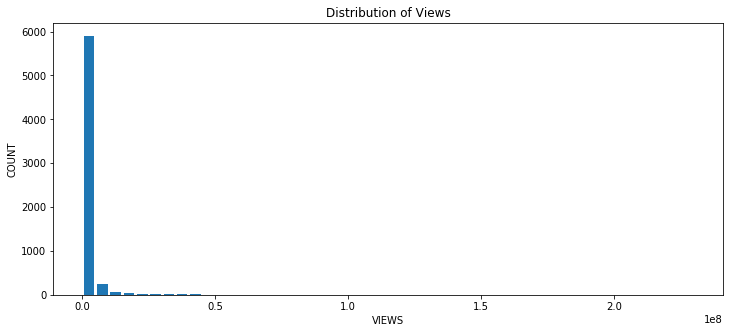

In [27]:
#lets plot the views data
# We can see the least value is 559 which will be the min limit for our bins and max value of the views as max limit

hist_plot(df_videos, 'views', [559, df_videos.views.max(), 5000000], 'Distribution of Views', [12,5], 'normal')


**Comment:**

The above plot doesn't show us much details of how the data of views is spread. Lets try and check the spread of data by setting limits. 

In [28]:
# lets check the statistics of views data
df_videos.views.describe()

count    6.351000e+03
mean     1.962117e+06
std      7.060057e+06
min      5.590000e+02
25%      1.591565e+05
50%      5.181070e+05
75%      1.473582e+06
max      2.252119e+08
Name: views, dtype: float64

As mentioned earlier we will now set axis limits and see if we can get a better view of the spread of data. we will plot 3 subplots showing us 3 different limits of the data.

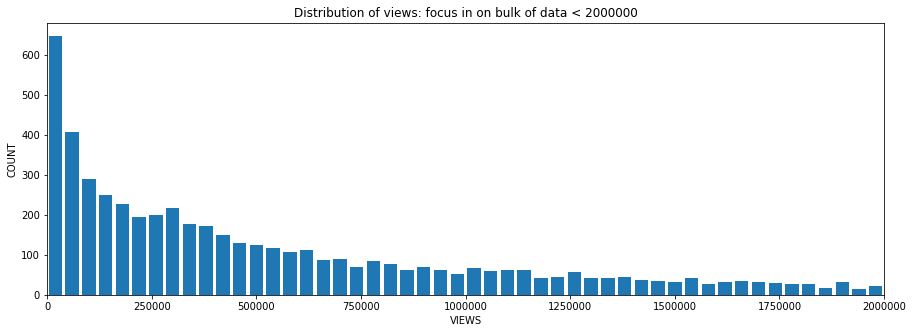

In [29]:

# first histogram: focus in on bulk of data < 2000000
hist_plot(df_videos, 'views', [0, 2000000, 40000], 
          'Distribution of views: focus in on bulk of data < 2000000', [15,5], 'lim')


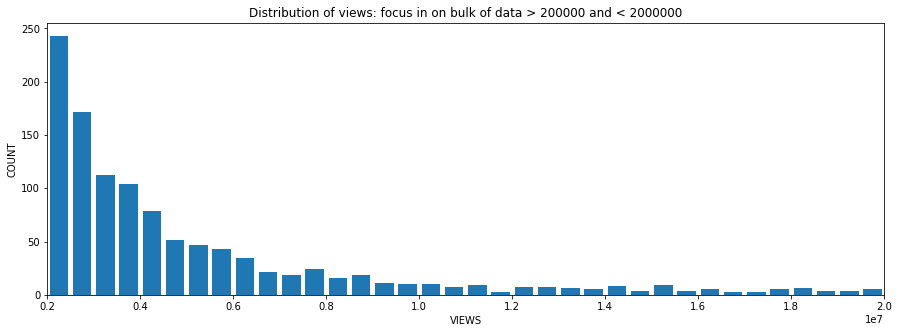

In [30]:
# second histogram: focus in on bulk of data > 2000000 and < 20000000
hist_plot(df_videos, 'views', [2000000, 20000000, 500000], 
          'Distribution of views: focus in on bulk of data > 200000 and < 2000000', [15,5], 'lim')


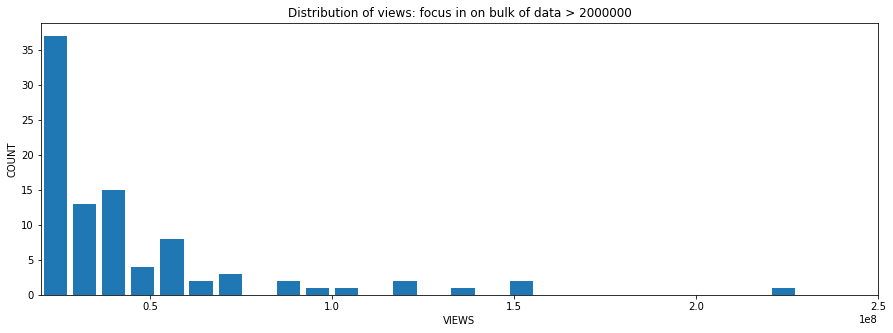

In [31]:
# third histogram: focus in on bulk of data > 20000000
hist_plot(df_videos, 'views', [20000000, 250000000, 8000000], 
          'Distribution of views: focus in on bulk of data > 2000000', [15,5], 'lim')


**Comment:**

As we broke our data into 3 parts we can now see a better spread of data but we still don't have a clear picture of the data spread of views. But now we also know that most videos have between 10K and 10M views. TO get a clear picture of the data sperad lets try and apply log calculations on the data and see if we can get a better distribution of data.

In [32]:
# Get the statistics of data by applying log
np.log10(df_videos.views.describe())

count    3.802842
mean     6.292725
std      6.848808
min      2.747412
25%      5.201824
50%      5.714419
75%      6.168374
max      8.352591
Name: views, dtype: float64

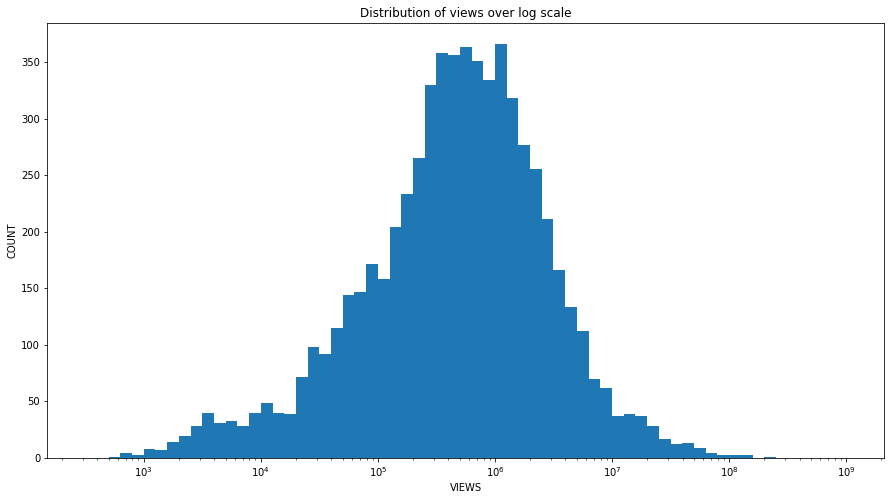

In [33]:
#log plot
hist_plot(df_videos, 'views', [2.5, 9, 0.1], 
          'Distribution of views over log scale', [15,8], 'log')

**Comment:**

From the above plot we get a better distribution of the 'views' data. The plot previously was right skewed but now we have normally distributed data.

In [34]:
# Before plotting the data lets see what values we have in 'likes'
df_videos.likes.sort_values(ascending = False)

38273    5613827
38547    5023450
34708    3094021
6181     3093544
3581     2729292
35080    2700800
22040    2672431
4997     2625661
39814    2488565
2587     2376636
30345    2162749
40824    2032463
15571    1988746
26339    1928392
11585    1919583
12992    1844959
40855    1817699
40869    1816753
574      1788960
24739    1784129
26709    1565579
35370    1431724
34747    1427436
34888    1425496
11323    1402578
34880    1378923
31343    1324609
40823    1323550
31949    1320316
34679    1295189
          ...   
14988          0
24114          0
23714          0
25551          0
28346          0
20314          0
28955          0
19168          0
16564          0
3995           0
15196          0
16762          0
4752           0
1741           0
7976           0
192            0
11567          0
16214          0
3195           0
2776           0
19762          0
6146           0
16973          0
11385          0
10374          0
15766          0
15575          0
5390          

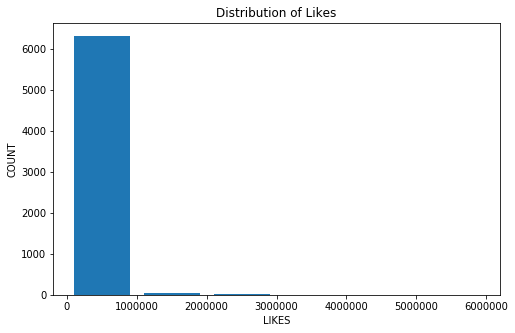

In [35]:
#set the bin limits according to the values of 'likes' in the data
hist_plot(df_videos, 'likes', [0, df_videos.likes.max(), 1000000], 
          'Distribution of Likes', [8,5], 'normal')


**Comment:**

The above plot doesn't show us much details of how the data of 'likes' is spread. Lets try and check the spread of data by setting limits.

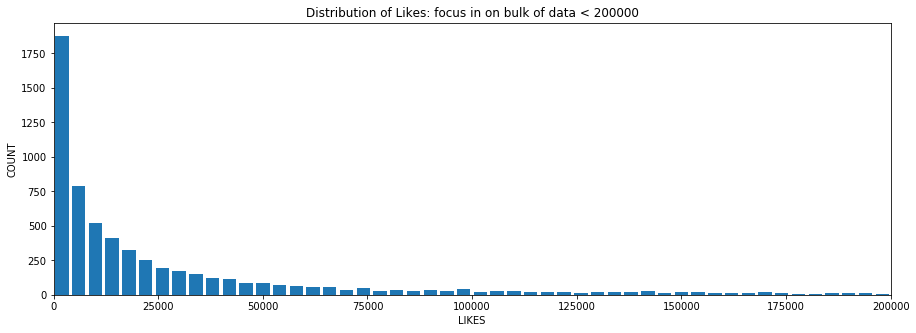

In [36]:
# first histogram: focus in on bulk of data < 200000
hist_plot(df_videos, 'likes', [0,200000, 4000], 
          'Distribution of Likes: focus in on bulk of data < 200000', [15,5], 'lim')


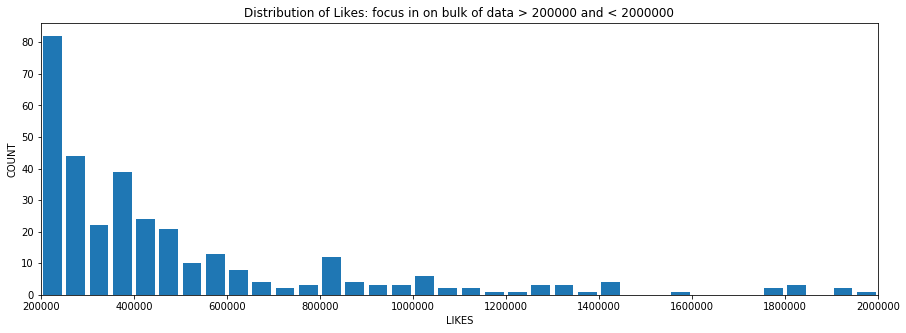

In [37]:
# second histogram: focus in on bulk of data > 200000 and < 2000000
hist_plot(df_videos, 'likes', [200000,2000000, 50000], 
          'Distribution of Likes: focus in on bulk of data > 200000 and < 2000000', [15,5], 'lim')


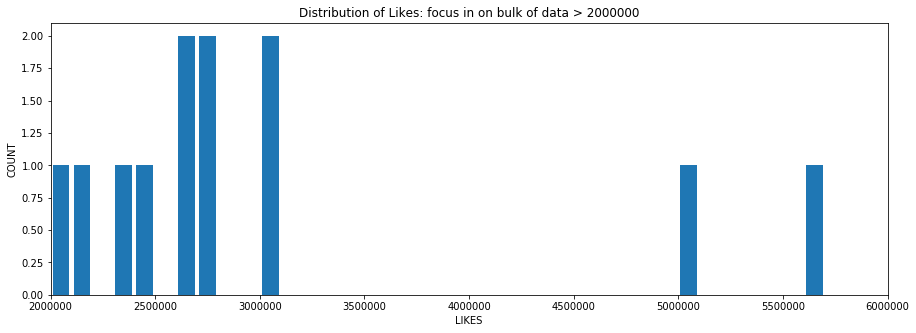

In [38]:
# third histogram: focus in on bulk of data > 2000000
hist_plot(df_videos, 'likes', [2000000, 6000000, 100000], 
          'Distribution of Likes: focus in on bulk of data > 2000000', [15,5], 'lim')


**Comment:**

As we broke our data into 3 parts we can now see a better spread of data but we still don't have a clear picture of the data spread of likes. But now we also know that most likes have between 0 and 1M likes. To get a clear picture of the data sperad lets try and apply log calculations on the data and see if we can get a better distribution of likes data.

In [39]:
# Get the statistics of data by applying log
np.log10(df_videos.likes.describe())

count    3.802842
mean     4.744880
std      5.287423
min          -inf
25%      3.442872
50%      4.075766
75%      4.584653
max      6.749259
Name: likes, dtype: float64

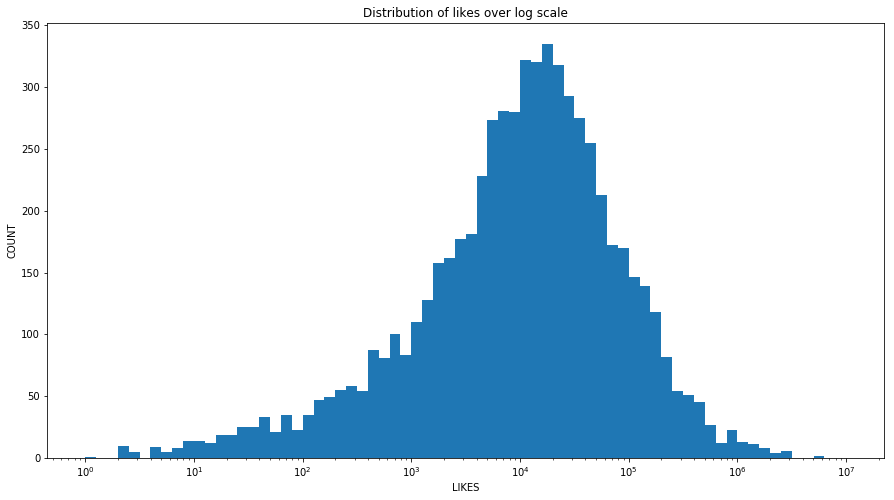

In [40]:
#plot data
hist_plot(df_videos, 'likes', [0, 7, 0.1], 
          'Distribution of likes over log scale', [15,8], 'log')

**Comment:**

From the above plot we get a better distribution of the 'likes' data. The plot previously was right skewed but now we have normally distributed data.

In [41]:
# Before plotting the data lets see what values we have in 'dislikes'
df_videos.dislikes.sort_values(ascending = False)

11323    1674420
6181     1643059
15571     497847
38547     343541
17063     291900
7594      228426
40948     212976
38273     206892
20939     176903
9967      165109
6978      140271
6856      132439
34708     129502
40809     126931
15773     124281
34888     119798
31343     118647
2587      117196
26339     113990
40876     104831
12992     102849
40869     102474
40824     101678
6985       91898
35907      89869
36950      83954
34662      78095
11585      73239
25947      71494
40902      66910
          ...   
7976           0
16359          0
11370          0
14781          0
16973          0
14782          0
17953          0
15575          0
192            0
17572          0
5198           0
14905          0
9983           0
9598           0
5390           0
12790          0
12910          0
8983           0
1578           0
14984          0
14988          0
5770           0
6146           0
16762          0
11395          0
9188           0
16564          0
12986         

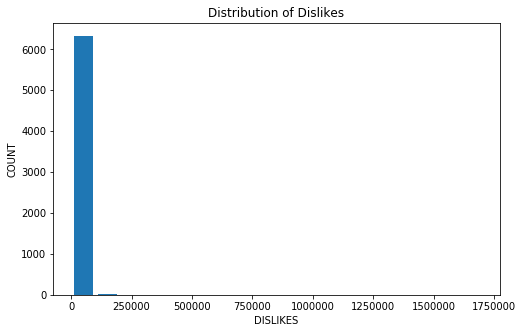

In [42]:
#plot data
hist_plot(df_videos, 'dislikes', [0, df_videos['dislikes'].max(), 100000], 
          'Distribution of Dislikes', [8,5], 'normal')


**Comment:**

The above plot doesn't show us much details of how the data of dislikes is spread. Lets try and check the spread of data by setting limits.


In [43]:
#Lets check the statistics of dislikes
df_videos.dislikes.describe()

count    6.351000e+03
mean     3.067153e+03
std      3.198849e+04
min      0.000000e+00
25%      1.270000e+02
50%      4.440000e+02
75%      1.507000e+03
max      1.674420e+06
Name: dislikes, dtype: float64

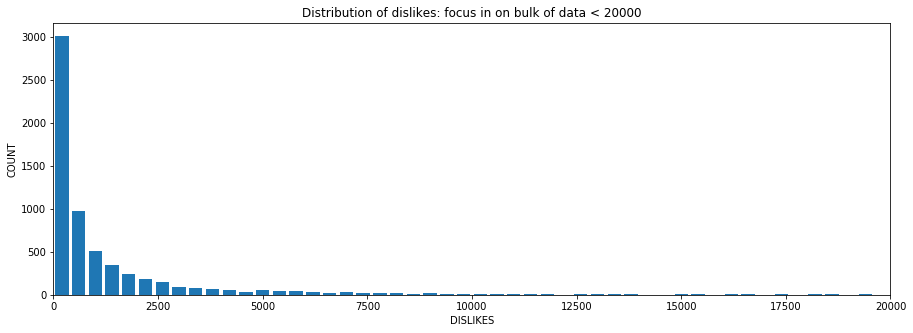

In [44]:
# first histogram: focus in on bulk of data < 20000
hist_plot(df_videos, 'dislikes', [0, 20000, 400], 
          'Distribution of dislikes: focus in on bulk of data < 20000', [15,5], 'lim')


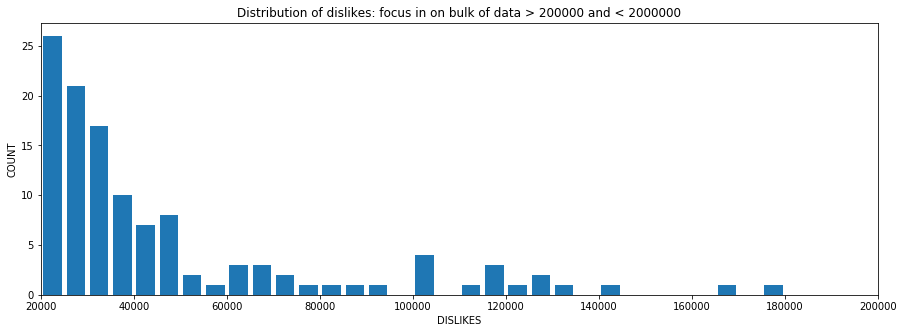

In [45]:
# second histogram: focus in on bulk of data > 20000 and < 200000
hist_plot(df_videos, 'dislikes', [20000, 200000, 5000], 
          'Distribution of dislikes: focus in on bulk of data > 200000 and < 2000000', [15,5], 'lim')


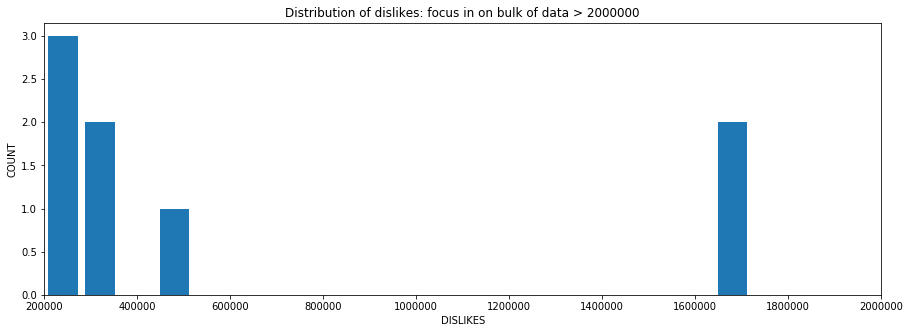

In [46]:
# third histogram: focus in on bulk of data > 200000
hist_plot(df_videos, 'dislikes', [200000, 2000000, 80000], 
          'Distribution of dislikes: focus in on bulk of data > 2000000', [15,5], 'lim')

**Comment:**

As we broke our data into 3 parts we can now see a better spread of data but we still don't have a clear picture of the data spread of dislikes. But now we also know that most videos have between 0 and 180k dislikes. TO get a clear picture of the data sperad lets try and apply log calculations on the data and see if we can get a better distribution of dislikes data.

In [47]:
# Get the statistics of data by applying log
np.log10(df_videos.dislikes.describe())

count    3.802842
mean     3.486735
std      4.504994
min          -inf
25%      2.103804
50%      2.647383
75%      3.178113
max      6.223864
Name: dislikes, dtype: float64

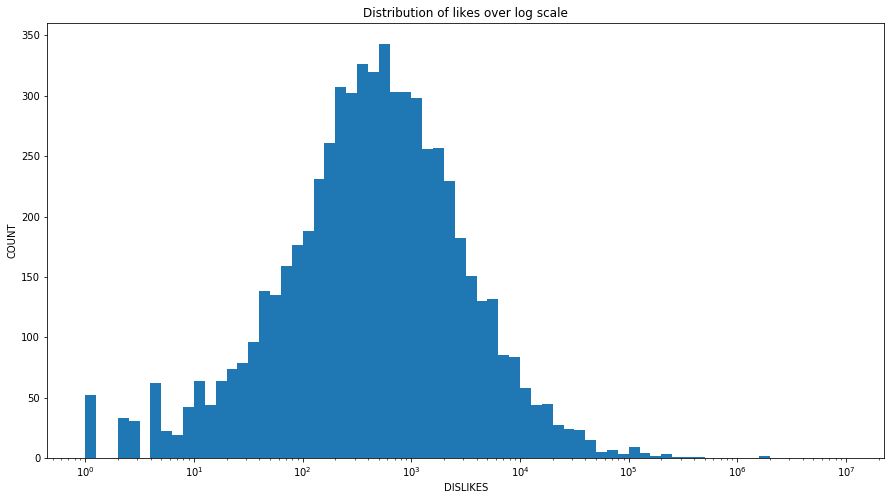

In [48]:
#plot data

hist_plot(df_videos, 'dislikes', [0, 7, 0.1], 
          'Distribution of likes over log scale', [15,8], 'log')


**Comment:**

From the above plot we get a better distribution of the 'dislikes' data. The plot previously was right skewed but now we have normally distributed data. The plot also has outliers.

In [49]:
# Before plotting the data lets see what values we have in 'comment_count'
df_videos.comment_count.sort_values(ascending = False)

11323    1361580
38273    1228655
6181      810698
15571     658130
3581      546100
38547     517232
22040     477233
17063     436698
30249     383762
35080     371864
4997      350458
40824     320194
34708     242039
31343     238744
30345     227648
26349     213764
6742      210605
22361     203884
26709     194290
18559     193355
38284     180913
24739     180133
6978      175929
26339     162990
6985      157207
8396      157166
40855     156793
12992     148768
40948     144795
39814     142410
          ...   
16334          0
6196           0
10366          0
21239          0
21322          0
21534          0
16296          0
6146           0
16214          0
16147          0
4199           0
1363           0
12191          0
16369          0
7595           0
20584          0
12398          0
16564          0
16556          0
3995           0
3996           0
20851          0
7179           0
7170           0
16551          0
4183           0
12579          0
6965          

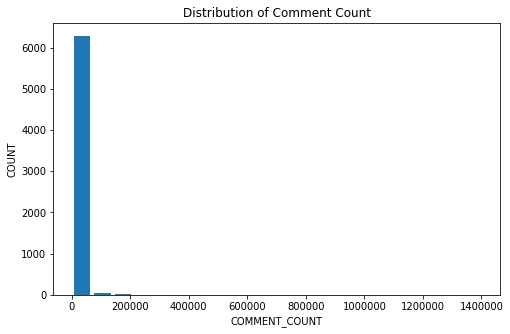

In [50]:
#plot data
hist_plot(df_videos, 'comment_count', [0, df_videos['comment_count'].max(), 70000], 
          'Distribution of Comment Count', [8,5], 'normal')

**Comment:**

The above plot doesn't show us much details of how the data of comment_count is spread. Lets try and check the spread of data by setting limits.

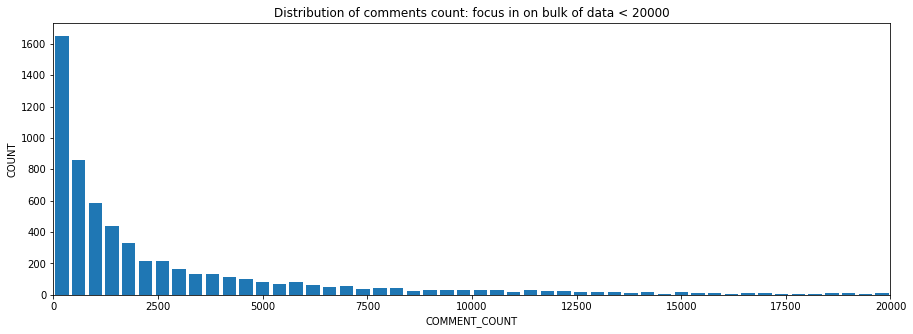

In [51]:
# first histogram: focus in on bulk of data < 20000
hist_plot(df_videos, 'comment_count', [0, 20000, 400], 
          'Distribution of comments count: focus in on bulk of data < 20000', [15,5], 'lim')

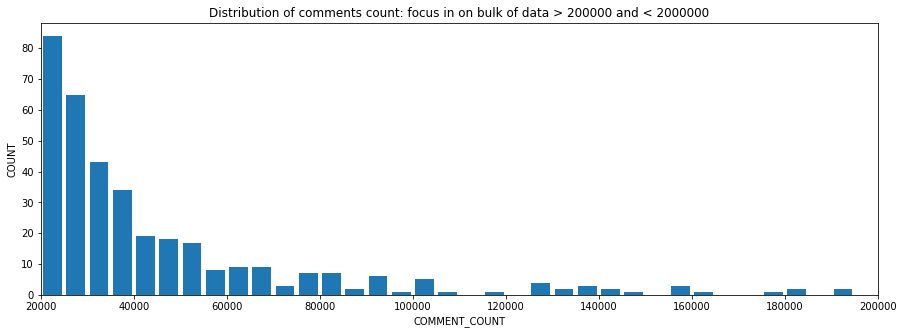

In [52]:
# second histogram: focus in on bulk of data > 20000 and < 200000
hist_plot(df_videos, 'comment_count', [20000, 200000, 5000], 
          'Distribution of comments count: focus in on bulk of data > 200000 and < 2000000', [15,5], 'lim')

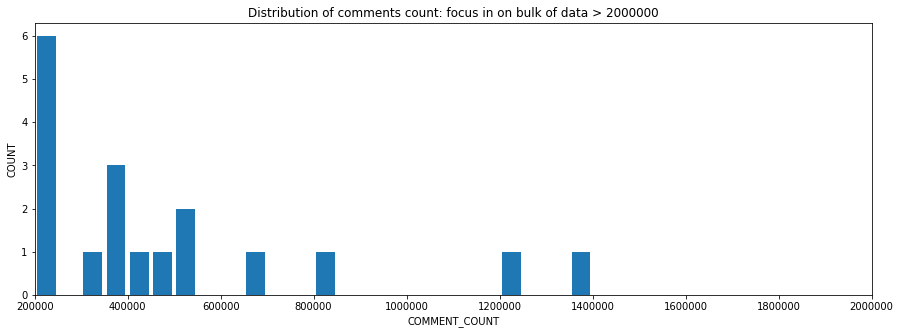

In [53]:
# third histogram: focus in on bulk of data > 200000
hist_plot(df_videos, 'comment_count', [200000, 2000000, 50000], 
          'Distribution of comments count: focus in on bulk of data > 2000000', [15,5], 'lim')

**Comment**

As we broke our data into 3 parts we can now see a better spread of data but we still don't have a clear picture of the data spread of comments count. But now we also know that most videos have between 0 and 200K comments count. To get a clear picture of the data sperad lets try and apply log calculations on the data and see if we can get a better distribution of comments count data.

In [54]:
# Get the statistics of data by applying log
np.log10(df_videos.comment_count.describe())

count    3.802842
mean     3.809610
std      4.529221
min          -inf
25%      2.570543
50%      3.102434
75%      3.608686
max      6.134043
Name: comment_count, dtype: float64

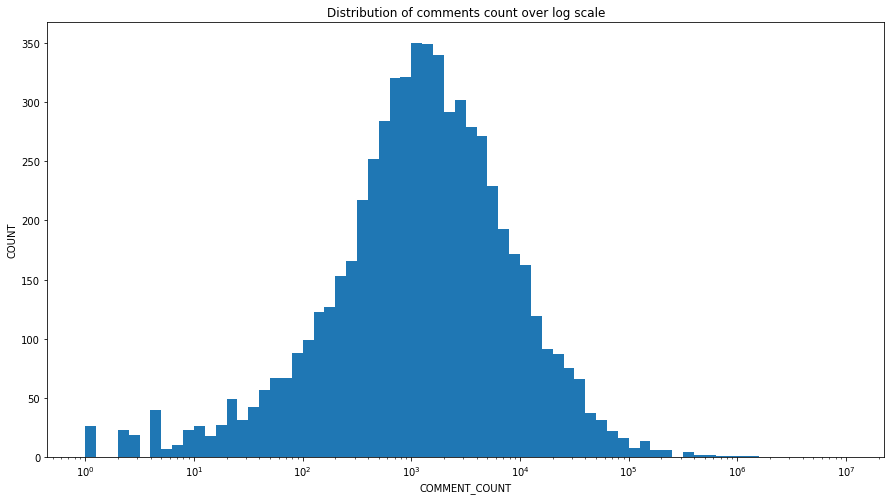

In [55]:
#plot data
hist_plot(df_videos, 'comment_count', [0, 7, 0.1], 
          'Distribution of comments count over log scale', [15,8], 'log')


**Comment:**

From the above plot we get a better distribution of the 'comment_count' data. The plot previously was right skewed but now we have normally distributed data.

*Lets now check the qualitative variables of the data like category, channel, month, day, hour*

First lets write a function for count plot


In [56]:
base_color = sns.color_palette()[0]
def count_plot(figsize, data, x, angle, title, typee):
    if typee == 'vertical':
        #figsize
        plt.figure(figsize = [figsize[0], figsize[1]])
        #set days based on most videos publised in order
        val = data[x].value_counts()
        val_order = val.index
        #plot the data
        sns.countplot(x = x, data = data, order = val_order, color = base_color);
        # axis and titles
        plt.xticks(rotation= angle);
        plt.xlabel(x.upper()) # Change column name to uppercase
        plt.ylabel('COUNT')
        plt.title(title)
    elif typee == 'horizontal':
        #figsize
        plt.figure(figsize = [figsize[0], figsize[1]])
        #set days based on most videos publised in order
        val = data[x].value_counts()[:20]
        val_order = val.index
        #plot the data
        sns.countplot(y = x, data = data, order = val_order, color = base_color);
        plt.xticks(rotation= angle);
        plt.ylabel(x.upper()) # Change column name to uppercase
        plt.xlabel('COUNT')
        plt.title(title)

First lets plot categories of trending videos

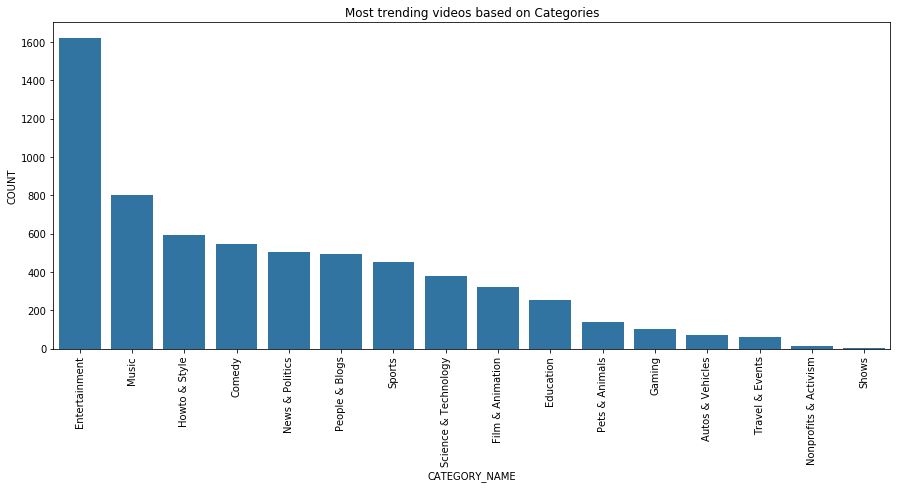

In [57]:
#plot
count_plot([15,6], df_videos, 'category_name', 90, 'Most trending videos based on Categories', 'vertical')

**Comment:**

From the above plot we can see that entertainment category has more trending videos followed by music and how to style and the least number of trending videos are from Nonprofits& Activism and shows. Entertainment category has published more than 1600 videos, music category has published 800 videos and how to style has around 600 published videos.

Lets now check which channel has published most trending videos

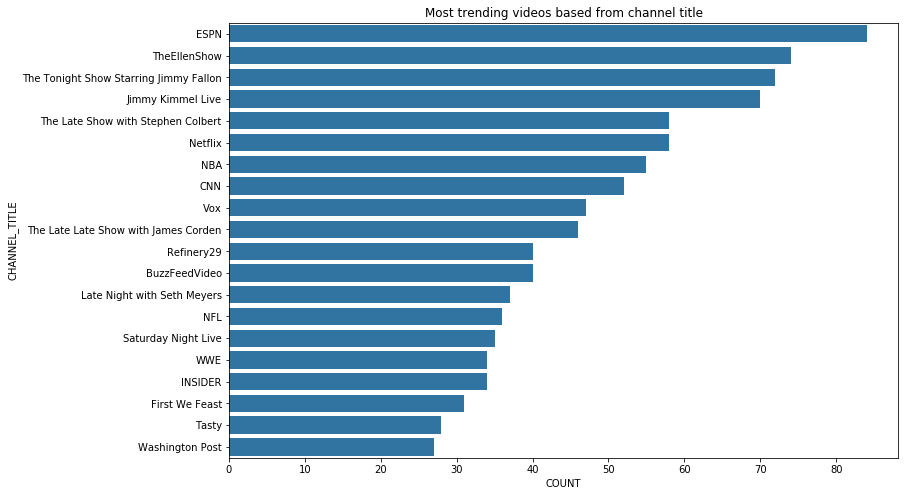

In [58]:
#plot
count_plot([12,8], df_videos, 'channel_title', 0, 'Most trending videos based from channel title', 'horizontal')

**Comment:**

From the above plot we can see that ESPN and The ellen show channel has the most trending videos publised. ESPN with more than 80 and The ellen show with more than 70 videos.

Lets now see which month has most published trending videos

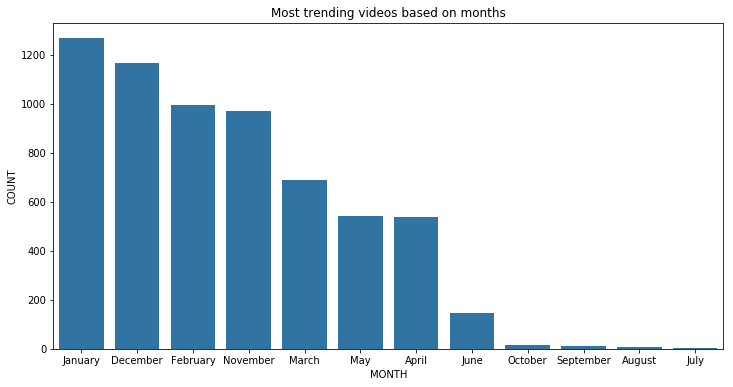

In [59]:
#plot
count_plot([12,6], df_videos, 'month', 0, 'Most trending videos based on months', 'vertical')

**Comment:**

From the above plot we can see that most trending videos were published in January and least were published in July

Lets now see which day has most published trending videos

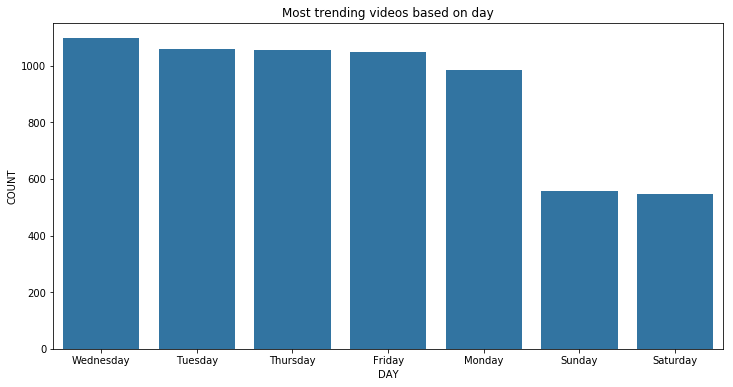

In [60]:
#plot
count_plot([12,6], df_videos, 'day', 0, 'Most trending videos based on day', 'vertical')

**Comment:**

From the above plot we can see that most trending videos were published on Wednesday and least were published on Saturday

Lets now see which hour of the day has most published trending videos

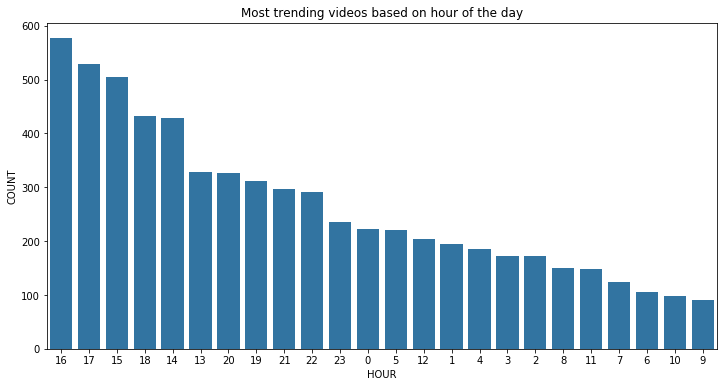

In [61]:
#plot
count_plot([12,6], df_videos, 'hour', 0, 'Most trending videos based on hour of the day', 'vertical')

In [62]:
#df_videos['hour'] = pd.to_datetime(df_videos['hour'], format='%I %p', errors = 'ignore')
#df_videos.hour.value_counts()

**Comment:**

From the above plot we can see that most trending videos were published at 4 in the evening and least were published at 9 in the morning.

**Bivariate Exploration of Data**

Bivariate exploration of data involves in analyzing two variables at a time be it 2 quantitative variables or 1 quantitative variable and 1 qualitative variable. It helps us determine how the two variables depend on each other.

Lets write some functions for scatterplots

In [63]:
def scat_plot( figsize, data, x, y, transperancy, title, typee):
    if typee == 'normal':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        sns.regplot(y= y, x= x, data = data, scatter_kws = {'alpha':transperancy})
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'log_data':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data      
        x1= np.log(data[x])
        y1= np.log(data[y])
        sns.regplot(y= y1, x= x1, data = data, scatter_kws = {'alpha':transperancy})
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'log_scale':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        sns.regplot(y= y, x= x, data = data, scatter_kws = {'alpha':transperancy})
        #lets view the data in log scale
        plt.xscale('log');
        plt.yscale('log');
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);    
    else:
        print('Please check typee')


Let us first see if we can find any co relation between likes and views of the dataset

In [64]:
#sns.jointplot(df_videos.likes, df_videos.views, kind = 'reg', color='C1', size = 10)

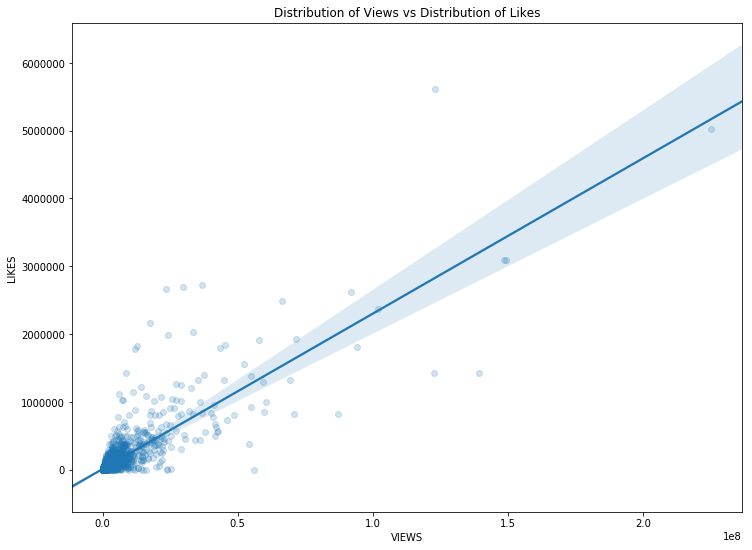

In [65]:
#plot
scat_plot([12,9], df_videos, 'views', 'likes', 1/5 , 'Distribution of Views vs Distribution of Likes', 'normal')

**Comment:**
    
The above plot shows us the relation between Views and Likes of trending videos but as we can see the plot has over plotting issues and the data is not distributed for proper understanding. Lets try to apply log scale and see if we can get a better understanding of the data

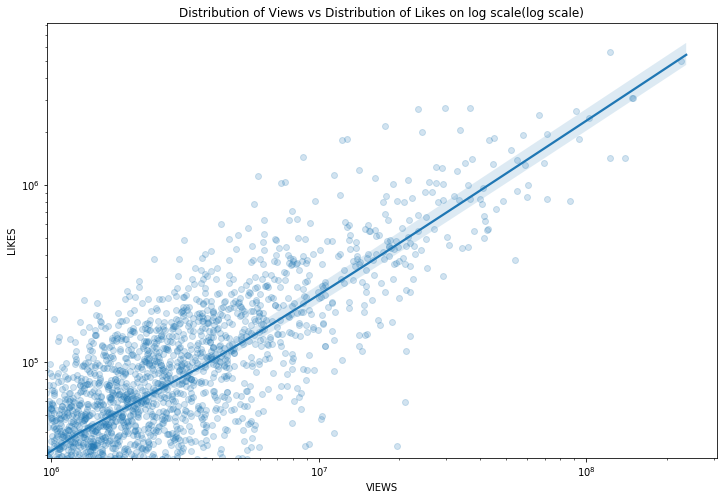

In [66]:
#plot
scat_plot([12,8], df_videos, 'views', 'likes', 1/5 , 
          'Distribution of Views vs Distribution of Likes on log scale(log scale)', 'log_scale')

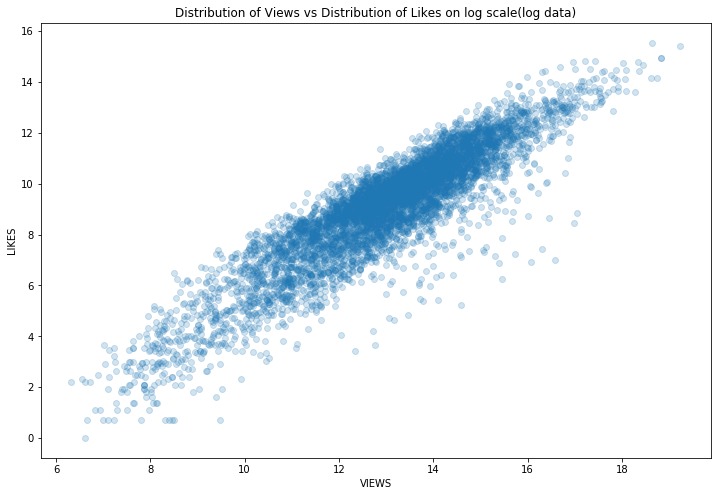

In [67]:
# lets check the plot in log data and not in log scale
scat_plot([12,8], df_videos, 'views', 'likes', 1/5 , 
          'Distribution of Views vs Distribution of Likes on log scale(log data)', 'log_data')

**Comment:**

With the log scale and log data we can see that the corelation between views and likes is positive and strong.

Lets now check the co relation between dislikes and views

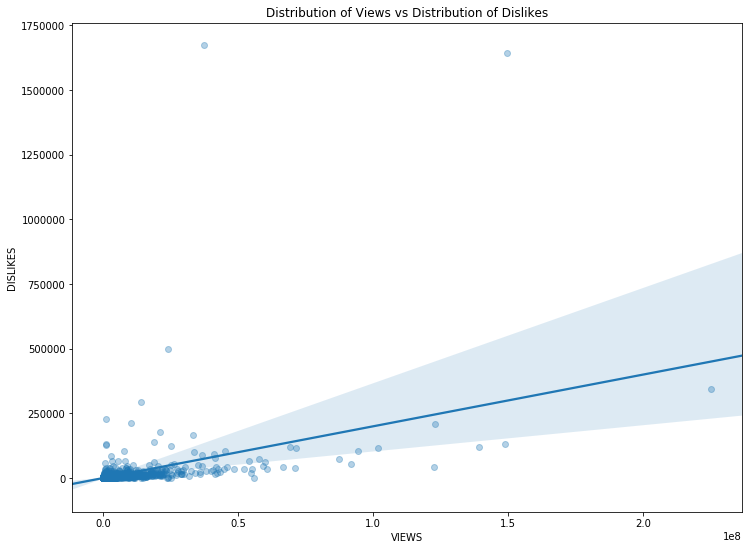

In [68]:
#plot
scat_plot([12,9], df_videos, 'views', 'dislikes', 1/3 , 
          'Distribution of Views vs Distribution of Dislikes', 'normal')

**Comment:**

The above plot shows us the relation between Views and dislikes of trending videos but as we can see the plot has over plotting issues and the data is not distributed for proper understanding. Lets try to apply log scale and see if we can get a better understanding of the data

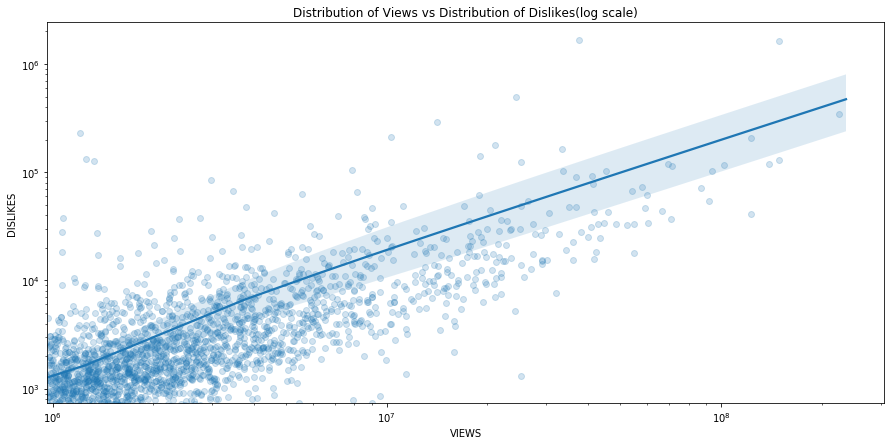

In [69]:
#plot
scat_plot([15,7], df_videos, 'views', 'dislikes', 1/5 , 
          'Distribution of Views vs Distribution of Dislikes(log scale)', 'log_scale')

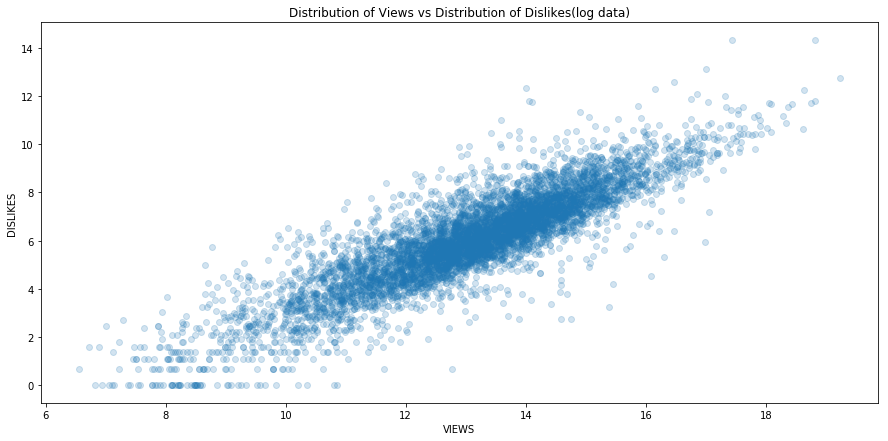

In [70]:
# lets check the plot in log data and not in log scale
scat_plot([15,7], df_videos, 'views', 'dislikes', 1/5 , 
          'Distribution of Views vs Distribution of Dislikes(log data)', 'log_data')

**Comment:**

With the log scale and log data we can see that the corelation between views and dislikes is also positive but not as strong as the corelation between views and likes.

Lets now check the co relation between comment count and views

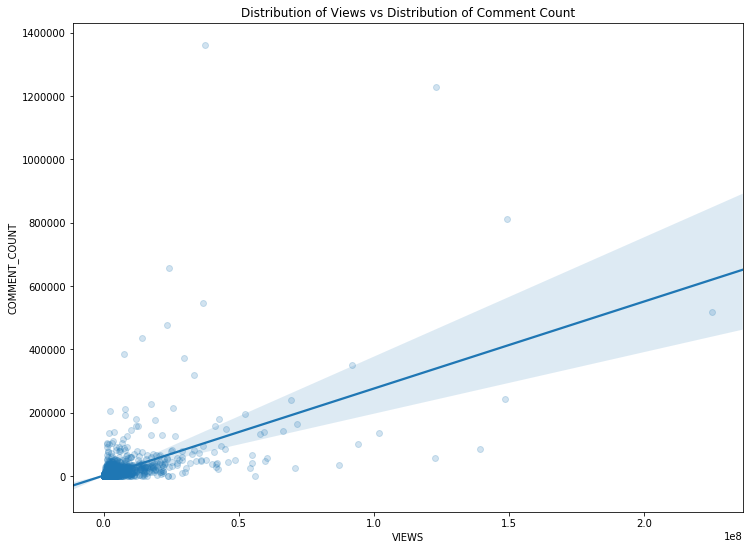

In [71]:
#plot
scat_plot([12,9], df_videos, 'views', 'comment_count', 1/5 , 
          'Distribution of Views vs Distribution of Comment Count', 'normal')


**Comment:**

The above plot shows us the relation between Views and comment_count of trending videos but as we can see the plot has large scale issue and the data is not distributed for proper understanding. Lets try to apply log scale, log transformed data and see if we can get a better understanding of the data

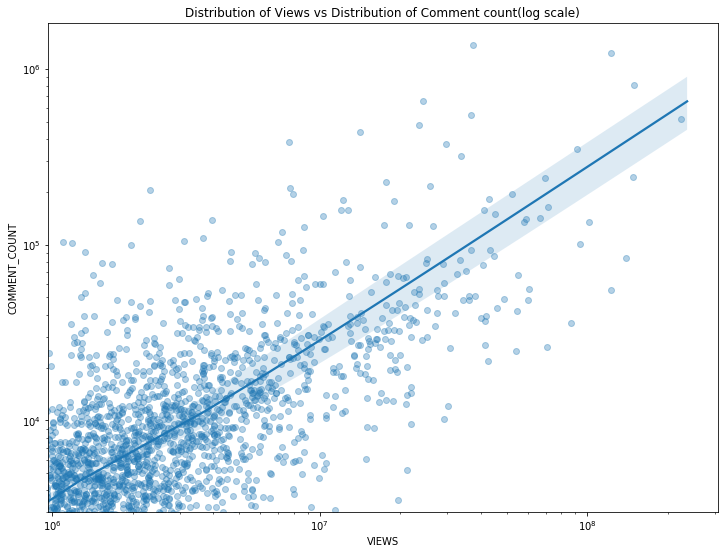

In [72]:
#plot
scat_plot([12,9], df_videos, 'views', 'comment_count', 1/3 , 
          'Distribution of Views vs Distribution of Comment count(log scale)', 'log_scale')


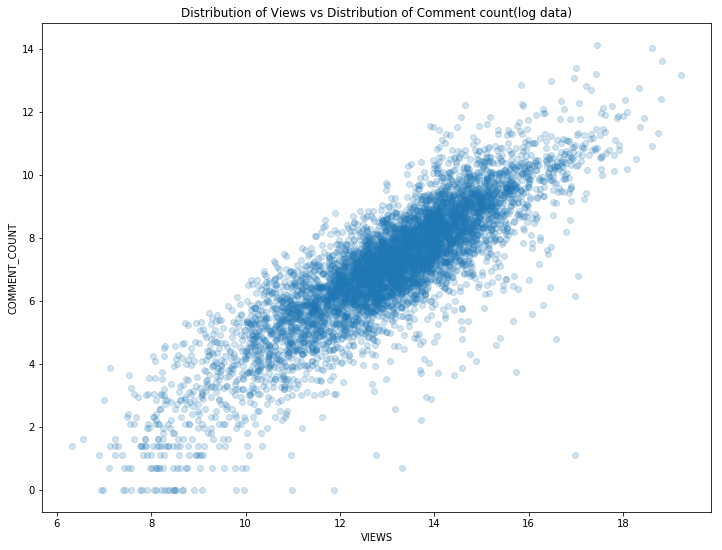

In [73]:
# lets check the plot in log data and not in log scale
scat_plot([12,9], df_videos, 'views', 'comment_count', 1/5 , 
          'Distribution of Views vs Distribution of Comment count(log data)', 'log_data')


**Comment:**

With the log scale and log data we can see that the corelation between views and comment count is also positive but weak.

Lets now check the co relation between likes and dislikes

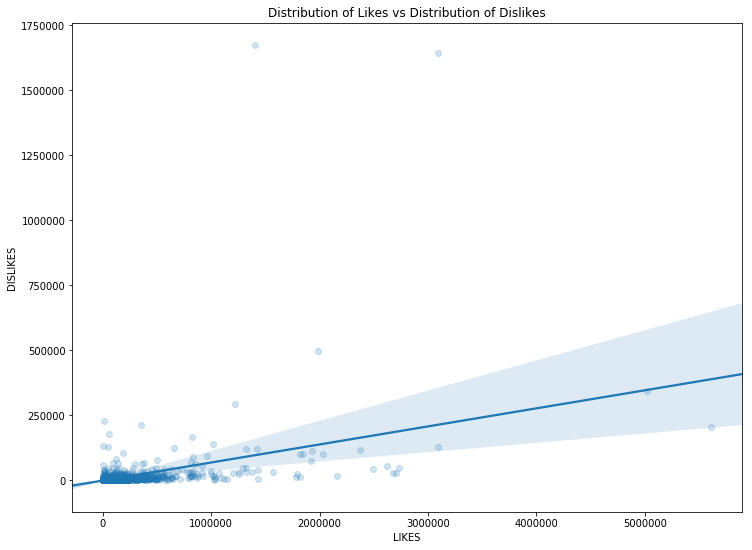

In [74]:
#plot
scat_plot([12,9], df_videos, 'likes', 'dislikes', 1/5 , 
          'Distribution of Likes vs Distribution of Dislikes', 'normal')


**Comment:**

The above plot shows us the relation between likes and dislikes of trending videos which is a positive relation but as we can see the plot has large scale issue and the data is not distributed for proper understanding. Lets try to apply log scale, log transformed data and see if we can get a better understanding of the data

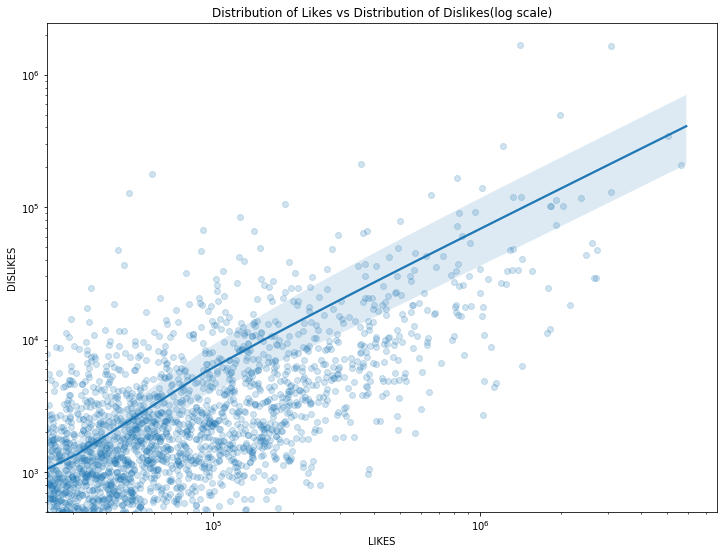

In [75]:
#plot
scat_plot([12,9], df_videos, 'likes', 'dislikes', 1/5 , 
          'Distribution of Likes vs Distribution of Dislikes(log scale)', 'log_scale')


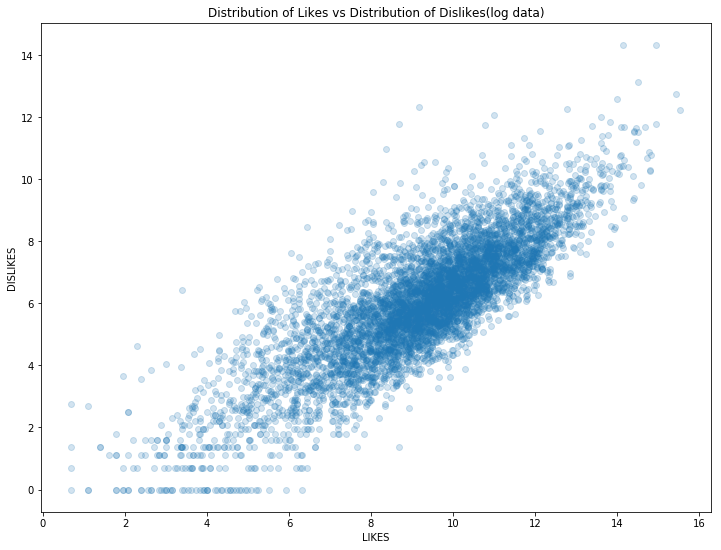

In [76]:
#plot
scat_plot([12,9], df_videos, 'likes', 'dislikes', 1/5 , 
          'Distribution of Likes vs Distribution of Dislikes(log data)', 'log_data')


**Comment:**

With the log scale and log data we can see that relation between likes and dislikes is positive but not strong

Lets check the relation between likes and comments

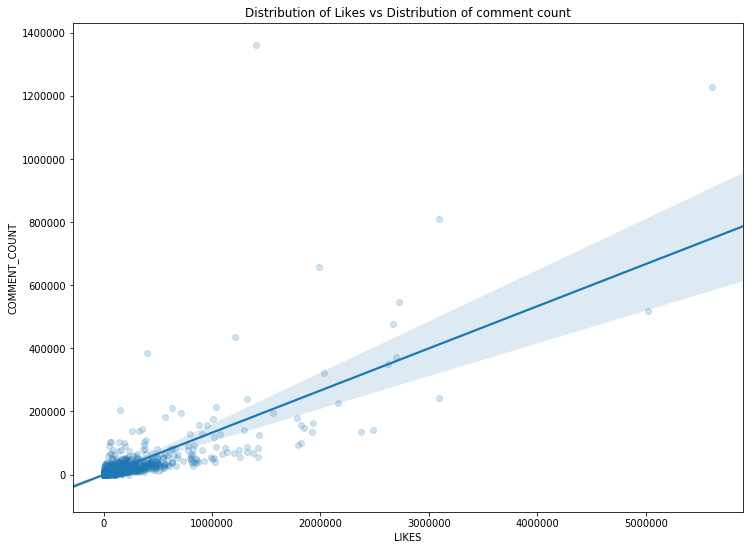

In [77]:
#plot
scat_plot([12,9], df_videos, 'likes', 'comment_count', 1/5 , 
          'Distribution of Likes vs Distribution of comment count', 'normal')


**Comment:**

The above plot shows us the relation between likes and comment count of trending videos which is a positive relation but as we can see the plot has large scale, overplotting issues and the data is not distributed for proper understanding. Lets try to apply log scale, log transformed data and see if we can get a better understanding of the data

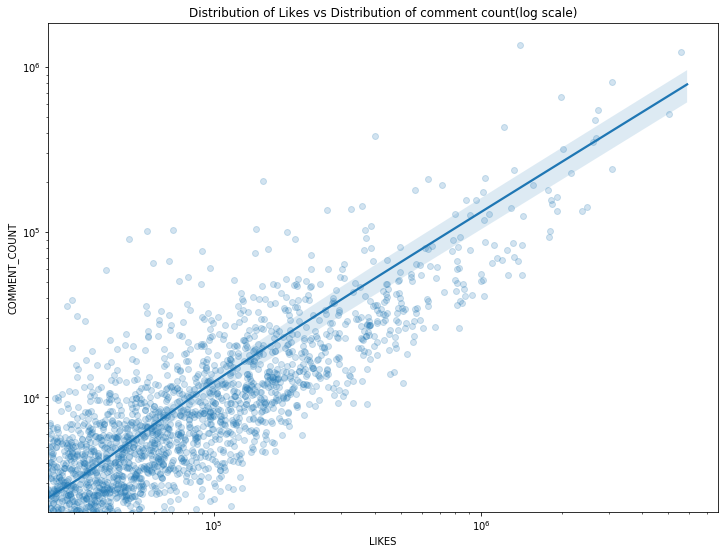

In [78]:
#plot
scat_plot([12,9], df_videos, 'likes', 'comment_count', 1/5 , 
          'Distribution of Likes vs Distribution of comment count(log scale)', 'log_scale')


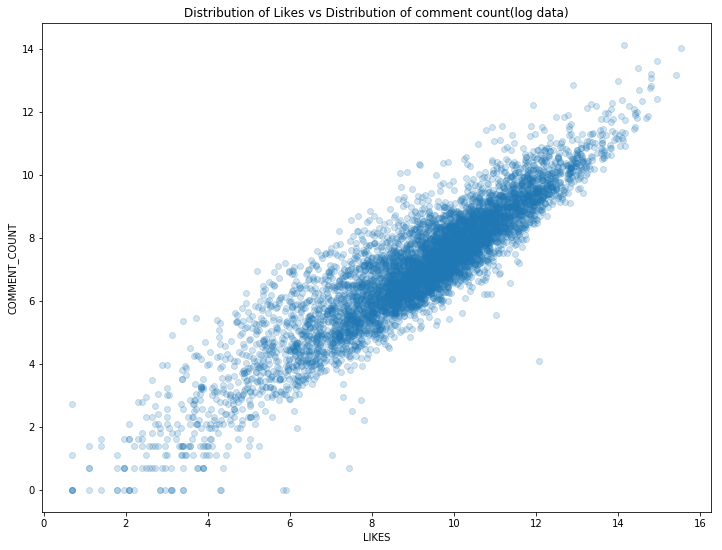

In [79]:
#plot
scat_plot([12,9], df_videos, 'likes', 'comment_count', 1/5 , 
          'Distribution of Likes vs Distribution of comment count(log data)', 'log_data')


**Comment:**

With the log scale and log data we can see that relation between likes and comment count is positive

Lets check the relation between dislikes and comments

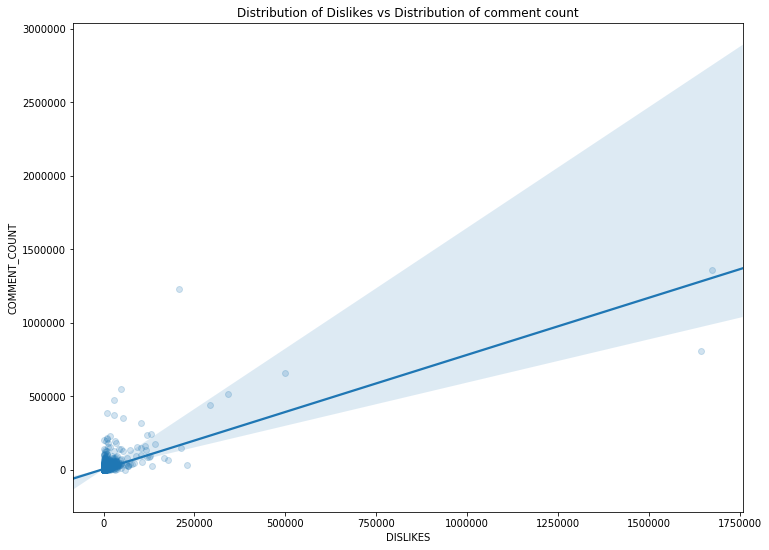

In [80]:
#plot
scat_plot([12,9], df_videos, 'dislikes', 'comment_count', 1/5 , 
          'Distribution of Dislikes vs Distribution of comment count', 'normal')


**Comment:**

The above plot shows us the relation between dislikes and comment count of trending videos which is a positive relation but as we can see the plot has large scale, over plotting issues and the data is not distributed for proper understanding. Lets try to apply log scale, log transformed data and see if we can get a better understanding of the data

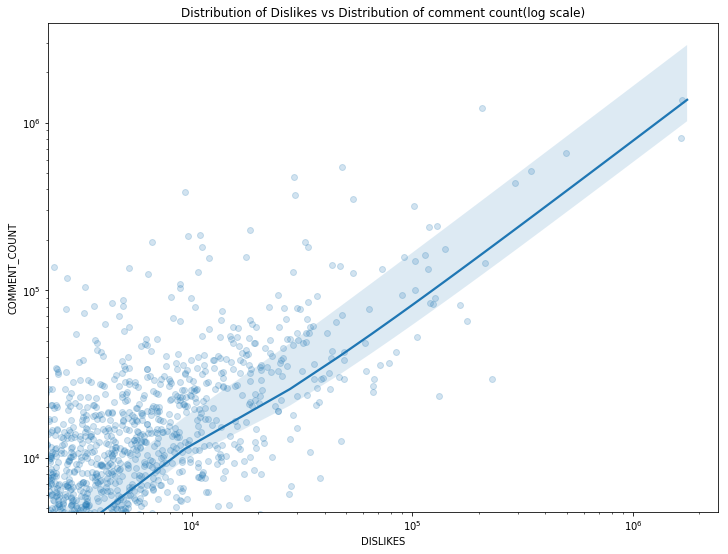

In [81]:
#plot
scat_plot([12,9], df_videos, 'dislikes', 'comment_count', 1/5 , 
          'Distribution of Dislikes vs Distribution of comment count(log scale)', 'log_scale')


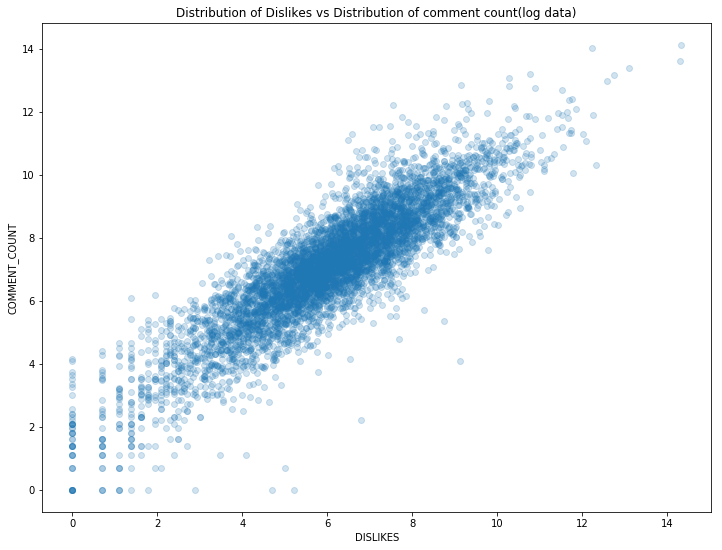

In [82]:
#plot
scat_plot([12,9], df_videos, 'dislikes', 'comment_count', 1/5 , 
          'Distribution of Dislikes vs Distribution of comment count(log data)', 'log_data')


**Comment:**

With the log scale and log data we can see that relation between dislikes and comment count is positive.

Now chects check the relation between quantitative and qualitative variables.
First we will write functions for box plots and voilin plots. These plots will help us get descriptive statistics of data and density spread of the data.

In [83]:
def box_plot(figsize, data, x, y, angle, title, typee):
    if typee == 'horizontal':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.boxplot(data = data, y = y, x = x, color = base_color)
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'vertical':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.boxplot(data = data, y = x, x = y, color = base_color)
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.xlabel(y.upper())
        plt.ylabel(x.upper())
        plt.title(title);
    elif typee == 'horizontal_log':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.boxplot(data = data, y = y, x = x, color = base_color)
        #set tick rotation
        plt.xticks(rotation= angle);
        #set scale
        plt.xscale('log');
        #plt.yscale('log');
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'vertical_log':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.boxplot(data = data, y = x, x = y, color = base_color)
        #set tick rotation
        plt.xticks(rotation= angle);
        #set scale
        #plt.xscale('log');
        plt.yscale('log');
        #set axis labels and title
        plt.xlabel(y.upper())
        plt.ylabel(x.upper())
        plt.title(title);
    elif typee == 'horizontal_log_data':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        x1= np.log(data[x]+1)
        #y1= np.log(data[y])
        sns.boxplot(data = data, y = y, x = x1, color = base_color)
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'vertical_log_data':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        x1= np.log(data[x]+1)
        #y1= np.log(data[y])
        sns.boxplot(data = data, y = x1, x = y, color = base_color)
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.xlabel(y.upper())
        plt.ylabel(x.upper())
        plt.title(title);
    else:
        print('please check typee')

In [84]:
def violin_plot(figsize, data, x, y, angle, title, typee):
    if typee == 'horizontal':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.violinplot(data = data, y = y, x = x, color = base_color, inner = 'quartile')
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'vertical':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.violinplot(data = data, y = x, x = y, color = base_color, inner = 'quartile')
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.xlabel(y.upper())
        plt.ylabel(x.upper())
        plt.title(title);
    elif typee == 'horizontal_log':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        
        sns.violinplot(data = data, x = x, y = y, color = base_color, inner = 'quartile')
        #set tick rotation
        plt.xticks(rotation= angle);
        #set scale
        plt.xscale('log');
        #plt.yscale('log');
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'vertical_log':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        sns.violinplot(data = data, y = x, x = y, color = base_color, inner = 'quartile')
        #set tick rotation
        plt.xticks(rotation= angle);
        #set scale
        #plt.xscale('log');
        plt.yscale('log');
        #set axis labels and title
        plt.xlabel(y.upper())
        plt.ylabel(x.upper())
        plt.title(title);
    elif typee == 'horizontal_log_data':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        x1= np.log(data[x]+1)
        #y1= np.log(data[y]+1)
        sns.violinplot(data = data, y = y, x = x1, color = base_color, inner = 'quartile')
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'vertical_log_data':
        #figsize
        plt.figure(figsize= (figsize[0],figsize[1]))
        x1= np.log(data[x]+1)
        #y1= np.log(data[y]+1)
        sns.violinplot(data = data, y = x1, x = y, color = base_color, inner = 'quartile')
        #set tick rotation
        plt.xticks(rotation= angle);
        #set axis labels and title
        plt.xlabel(y.upper())
        plt.ylabel(x.upper())
        plt.title(title);
    else:
        print('please check typee')

Lets check the relation between views and categories

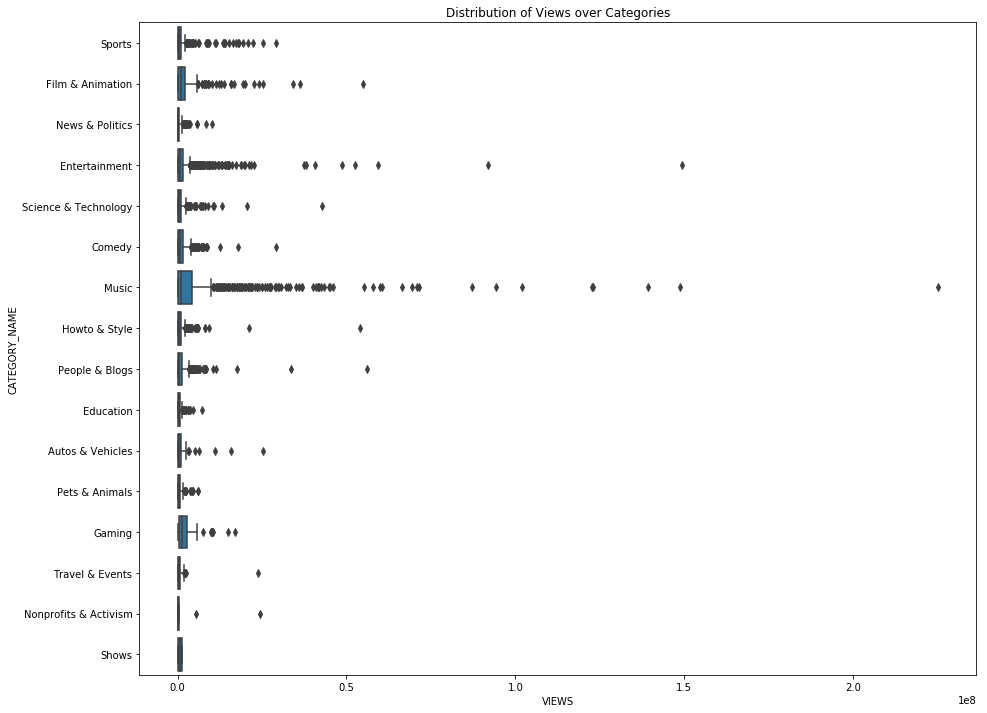

In [85]:
#plot
box_plot([15,12], df_videos, 'views', 'category_name' , 0 , 
          'Distribution of Views over Categories', 'horizontal')


**Comment:**

The Above plot shows us the statistics of views for all the categories but the interpretation is not clear as the data has large sclae and looks overplotted. Lets try and apply the log scale to see if we can get a better picture of the distribution of views across the categories.

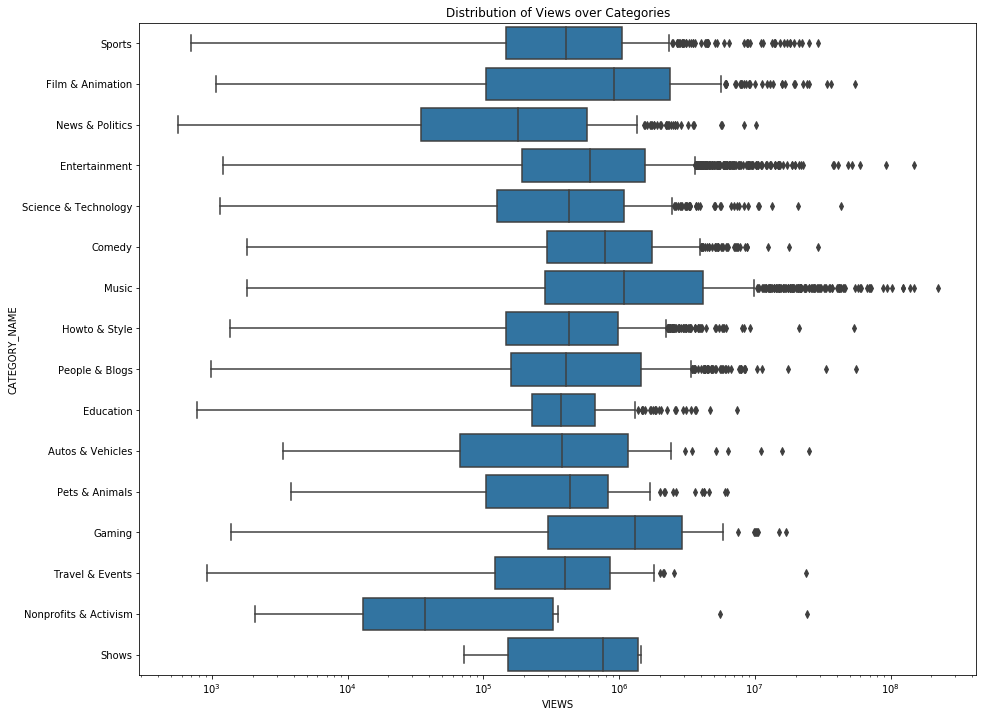

In [86]:
#plot
box_plot([15,12], df_videos,'views','category_name', 0, 
          'Distribution of Views over Categories', 'horizontal_log')


**Comment:**

After applying the log scale we get a better understanding of the box plaot with clear statistics interpretable. Here we can see that when we apply log scale the data shows outliers only after the max value. Lets see how the data behaves when we acctually apply log to the data and not to the scale


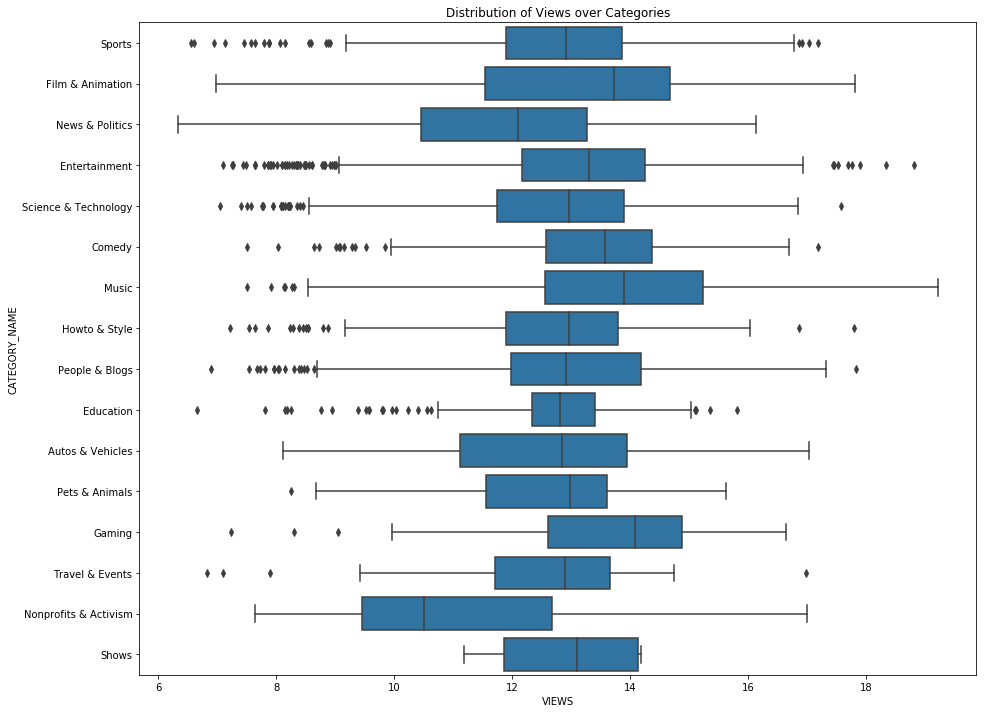

In [87]:
#plot
box_plot([15,12], df_videos,'views','category_name', 0, 
          'Distribution of Views over Categories', 'horizontal_log_data')


**Comment:**

After applying the log to the data we see that the plot shows there are outliers before min value and after max value as well.

Lets now see the density spread of views data over categories

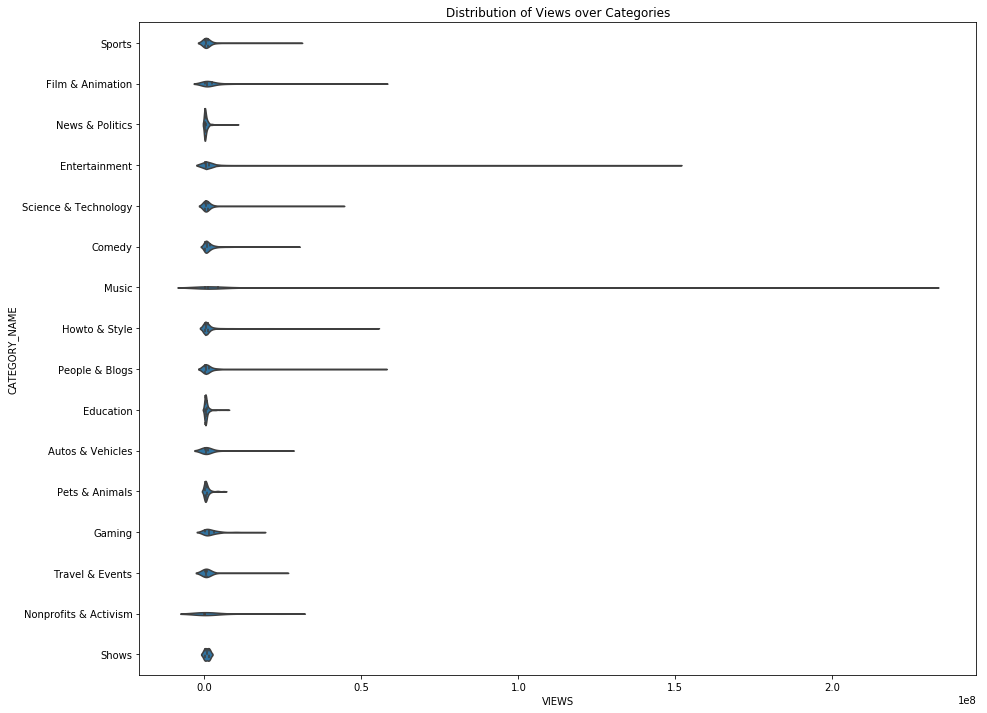

In [88]:
violin_plot([15,12], df_videos,'views','category_name', 0, 
          'Distribution of Views over Categories', 'horizontal')

**Comment:**

The Above plot shows us the density of data likes for all the categories but the interpretation is not clear as the data has large sclae and looks overplotted because of lard scale and having more data in only perticular range. Lets try and apply the log scale to see if we can get a better picture of the distribution of views across the categories


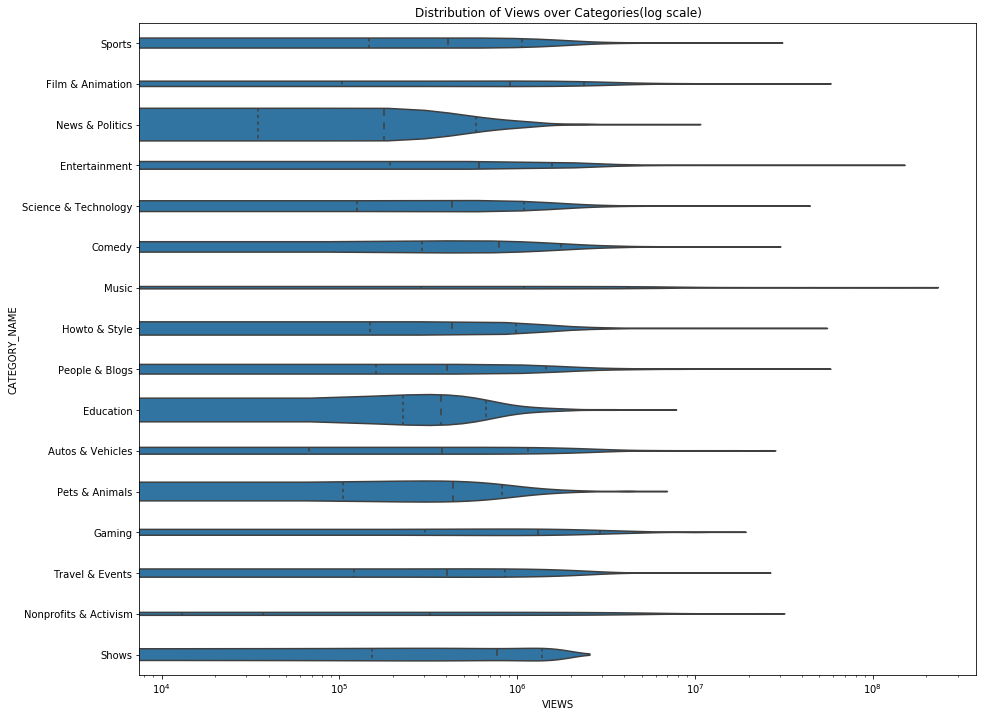

In [89]:
violin_plot([15,12], df_videos,'views','category_name', 0, 
          'Distribution of Views over Categories(log scale)', 'horizontal_log')

**Comment:**

when applying log scale some times the scale doesn't show the complete data scale. As in the above plot we can see that only higher part of the data is plotted on the log scale. Lets see if we can get a clear picture when we actually apply log to the data rather than to the scale.


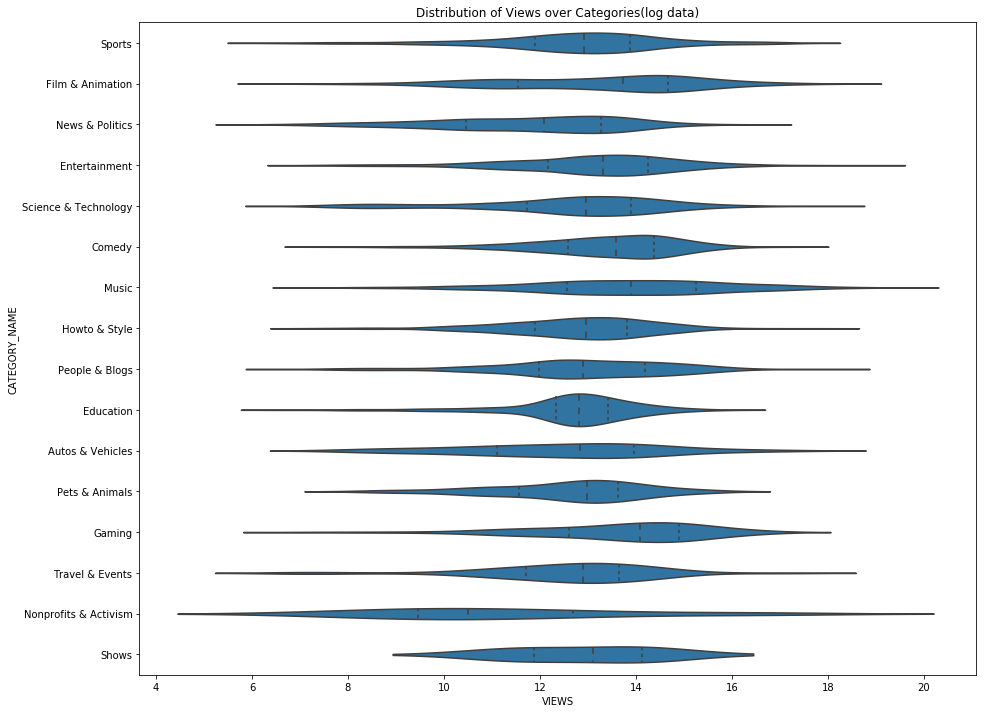

In [90]:
violin_plot([15,12], df_videos,'views','category_name', 0, 
          'Distribution of Views over Categories(log data)', 'horizontal_log_data')

**Comment:**

From the above plots we can see that log scale doesn't show us a proper plot but when we use log applied data we get a better picture of the density spread of data. we can see that we have large scale data where the density of data is less at the min data points and max data points and the density is more in between.

Lets now see the distribution of likes over categories to check the density of data spread.

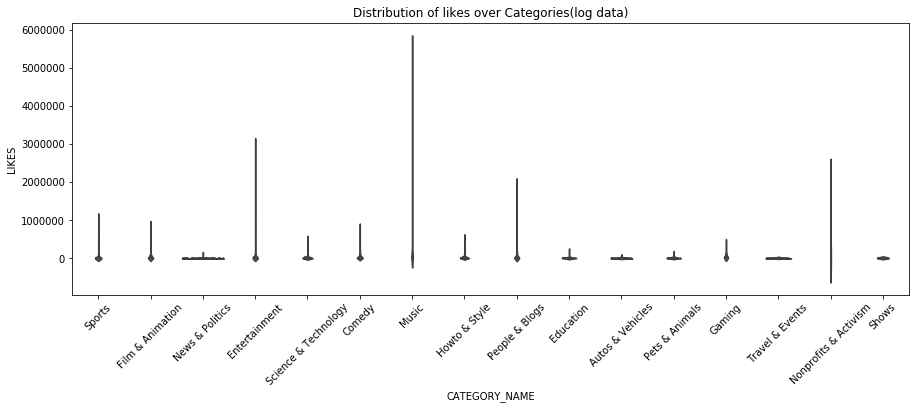

In [91]:
violin_plot([15,5], df_videos,'likes', 'category_name',  45, 
          'Distribution of likes over Categories(log data)', 'vertical')

**Comment:**

The Above plot shows us the density of data likes for all the categories but the interpretation is not clear as the data has large scale and looks overplotted because of it. Lets try and apply the log scale to see if we can get a better picture of the distribution of likes across the categories

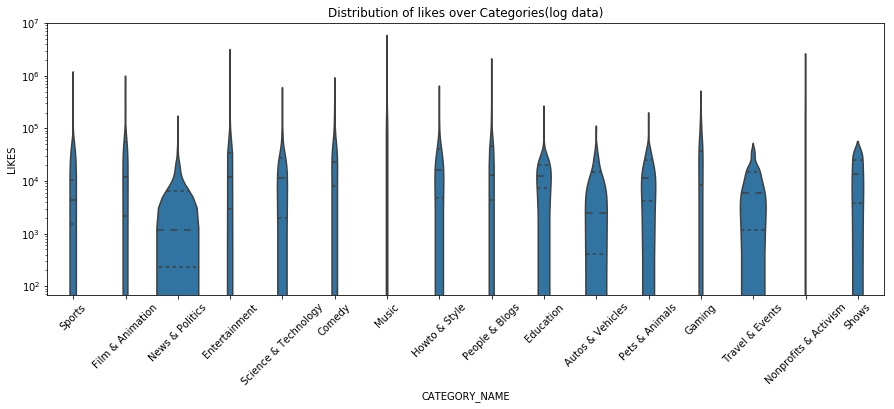

In [92]:
violin_plot([15,5], df_videos,'likes', 'category_name',  45, 
          'Distribution of likes over Categories(log data)', 'vertical_log')

**Comment:**

when applying log scale some times the scale doesn't show the complete data scale. As in the above plot we can see that only higher part of the data is plotted on the log scale. Lets see if we can get a clear picture when we actually apply log to the data rather than to the scale.


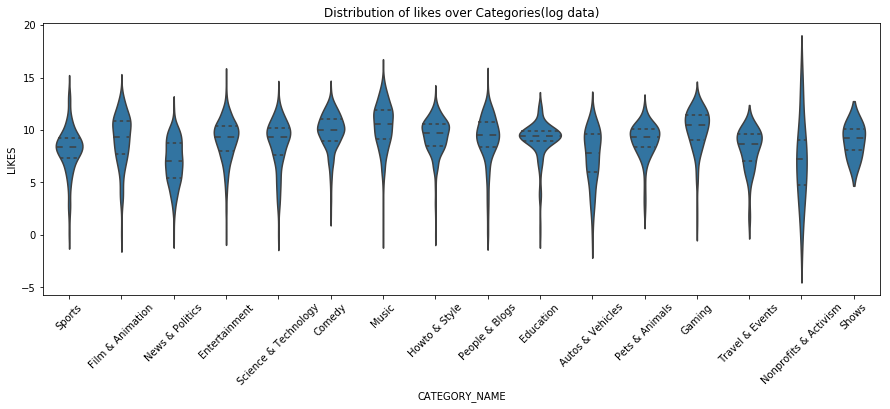

In [93]:
violin_plot([15,5], df_videos,'likes', 'category_name',  45, 
          'Distribution of likes over Categories(log data)', 'vertical_log_data')

**Comment:**
    
The plot with log data shows us the distribution of likes over categories we can see that most of the data shows relatively high variance but the density of 'sports', 'comedy', 'education', 'Pets & Animals' and 'shows' show more density compared to others. We can also see that bimodality is suggested in 'shows', 'Travel & Events' category. 

Lets go ahead and check the descriptive statistice of likes over categories

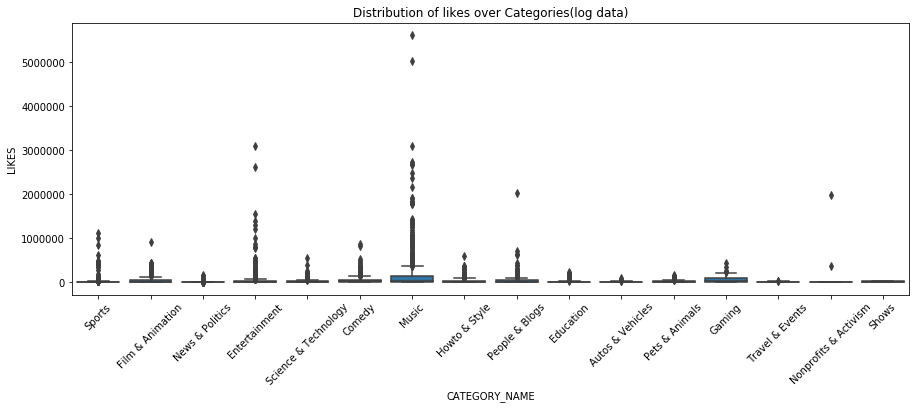

In [94]:
box_plot([15,5], df_videos,'likes', 'category_name',  45, 
          'Distribution of likes over Categories(log data)', 'vertical')

**Comment:**

The above plot should help us get a understanding of descriptive statistics of likes over category names. But as the data has large sclae issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log scale is applied.

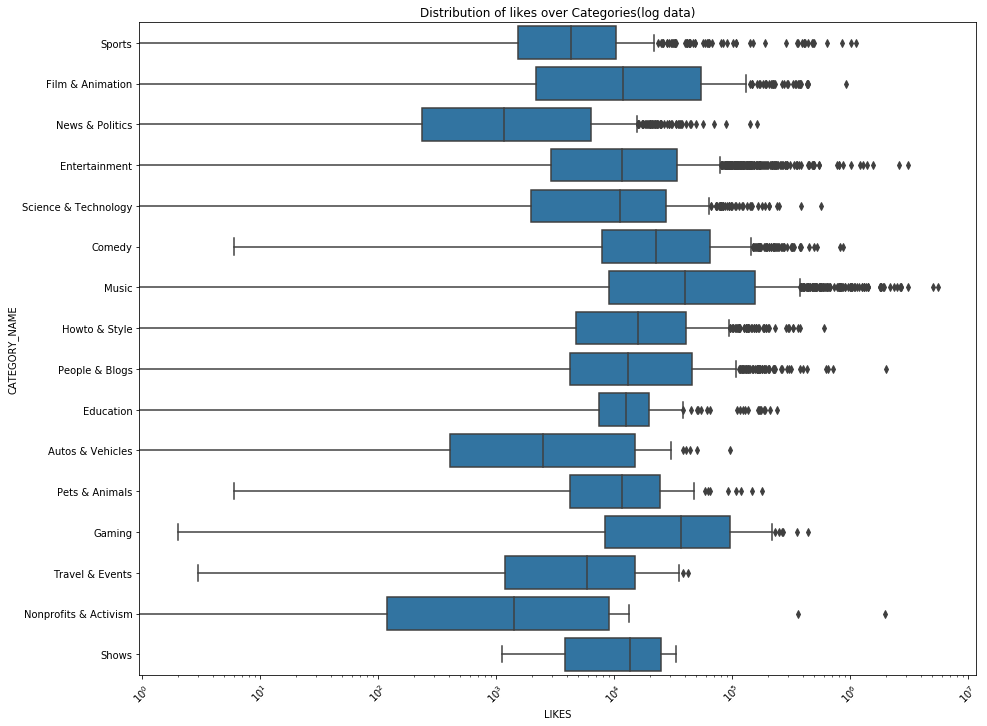

In [95]:
box_plot([15,12], df_videos,'likes', 'category_name',  45, 
          'Distribution of likes over Categories(log data)', 'horizontal_log')

**Comment:**

With the log scale applied we definitely have a better picture of the statistics but we don't have the complete data. The min values of the data are missing in the plot, this happens because of log scale. Lets try and see if we can get a better picture when we plot log transformed data.

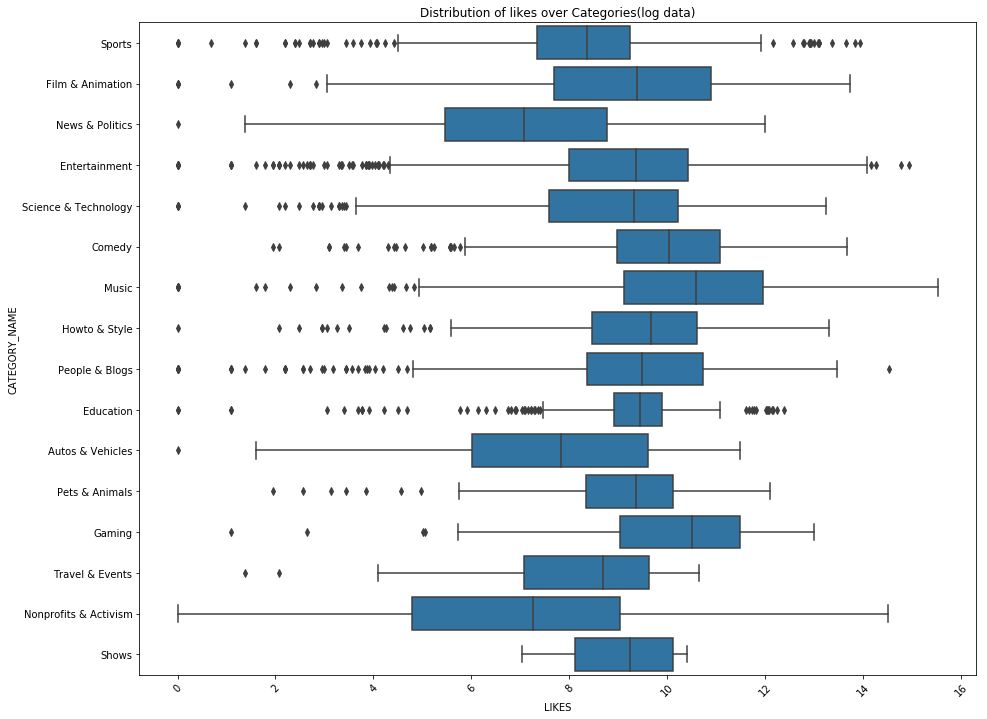

In [96]:
box_plot([15,12], df_videos,'likes', 'category_name',  45, 
          'Distribution of likes over Categories(log data)', 'horizontal_log_data')

**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of likes over categories. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed like shows, gaming,non profit, entertainment, science and tech, travel and event.

Let us now go ahead and check the density spread of dislikes data over categories

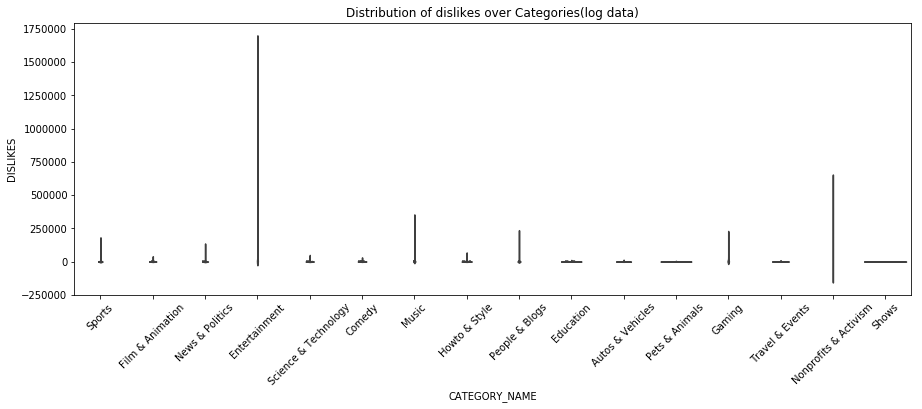

In [97]:
violin_plot([15,5], df_videos,'dislikes', 'category_name',  45, 
          'Distribution of dislikes over Categories(log data)', 'vertical')

**Comment:**

The Above plot shows us the density of data dislikes for all the categories but the interpretation is not clear as the data has large sclae and looks overplotted because of lard scale and having more data in only perticular range. Lets try and apply the log scale to see if we can get a better picture of the distribution of dislikes across the categories.

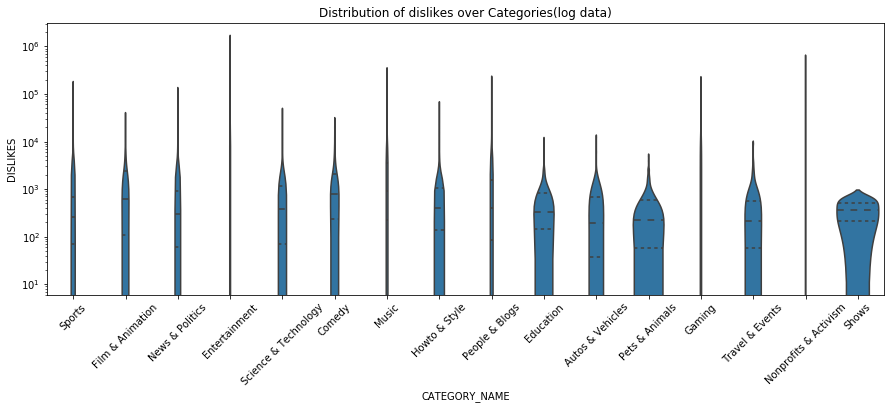

In [98]:
violin_plot([15,5], df_videos,'dislikes', 'category_name',  45, 
          'Distribution of dislikes over Categories(log data)', 'vertical_log')

**Comment:**

when applying log scale some times the scale doesn't show the complete data scale. As in the above plot we can see that only higher part of the data is plotted on the log scale. Lets see if we can get a clear picture when we actually apply log to the data rather than to the scale.


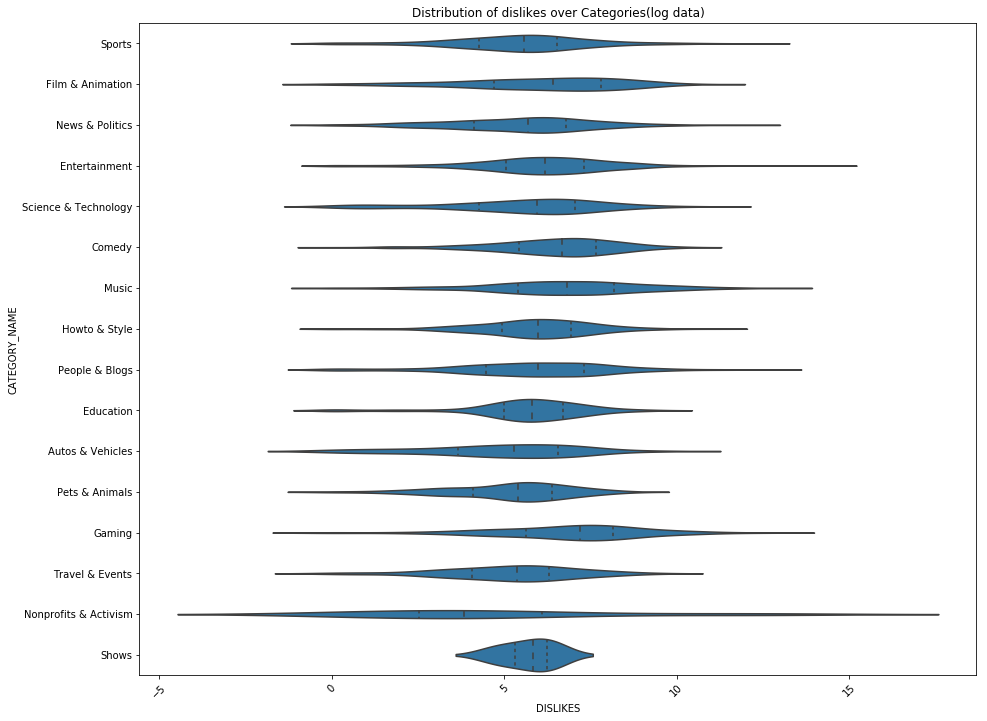

In [99]:
violin_plot([15,12], df_videos,'dislikes', 'category_name',  45, 
          'Distribution of dislikes over Categories(log data)', 'horizontal_log_data')

**Comment:**

From the above plots we can see that log scale doesn't show us a proper plot but when we use log applied data we get a better picture of the density spread of data. we can see that we have large scale data where the density of data is less at the min data points and max data points and the density is more in between. We can see that while most of the data shows relatively high variance but the density of 'sports', 'education' and 'shows' show more density compared to others. We can also see that bimodality is suggested in 'shows','pets & animals' category.

Lets now see the descriptive statistics of dislikes over categories.


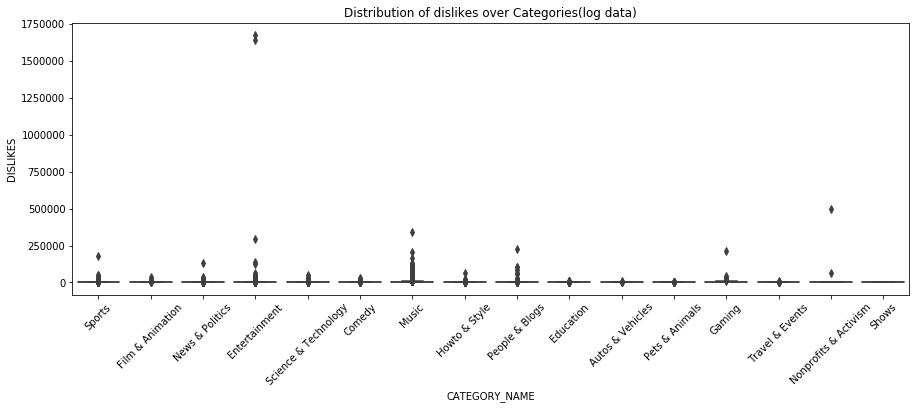

In [100]:
box_plot([15,5], df_videos,'dislikes', 'category_name',  45, 
          'Distribution of dislikes over Categories(log data)', 'vertical')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of dislikes over category names. But as the data has large sclae issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log scale is applied.


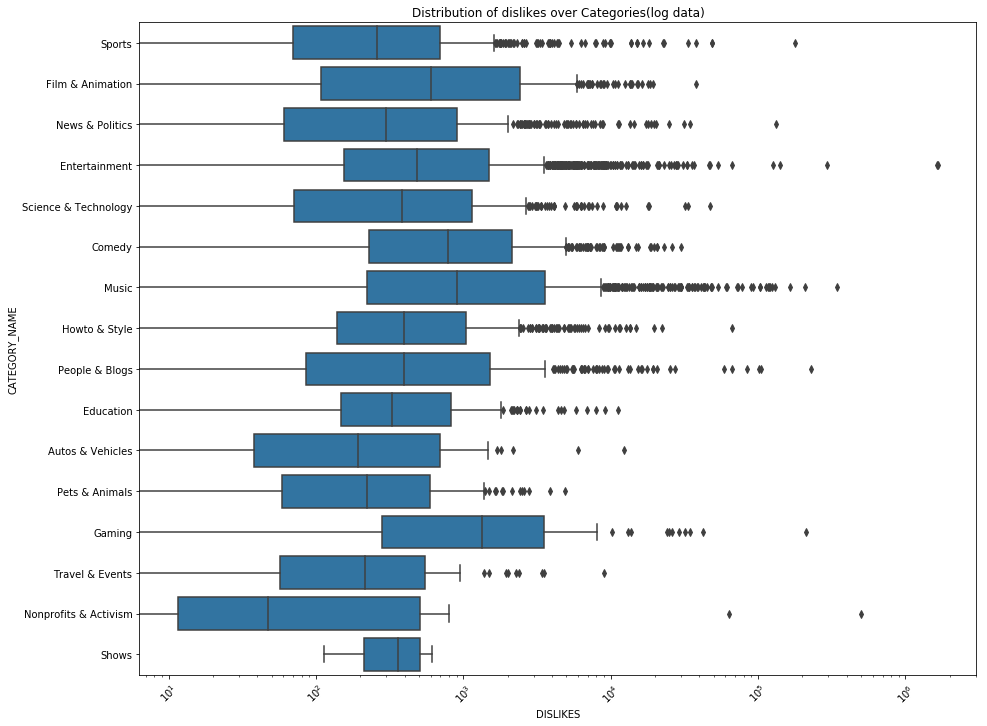

In [101]:

box_plot([15,12], df_videos,'dislikes', 'category_name',  45, 
          'Distribution of dislikes over Categories(log data)', 'horizontal_log')


**Comment:**

With the log scale applied we definitely have a better picture of the statistics but we don't have the complete data. The min values of the data are missing in the plot, this happens because of log scale. Lets try and see if we can get a better picture when we plot log transformed data.

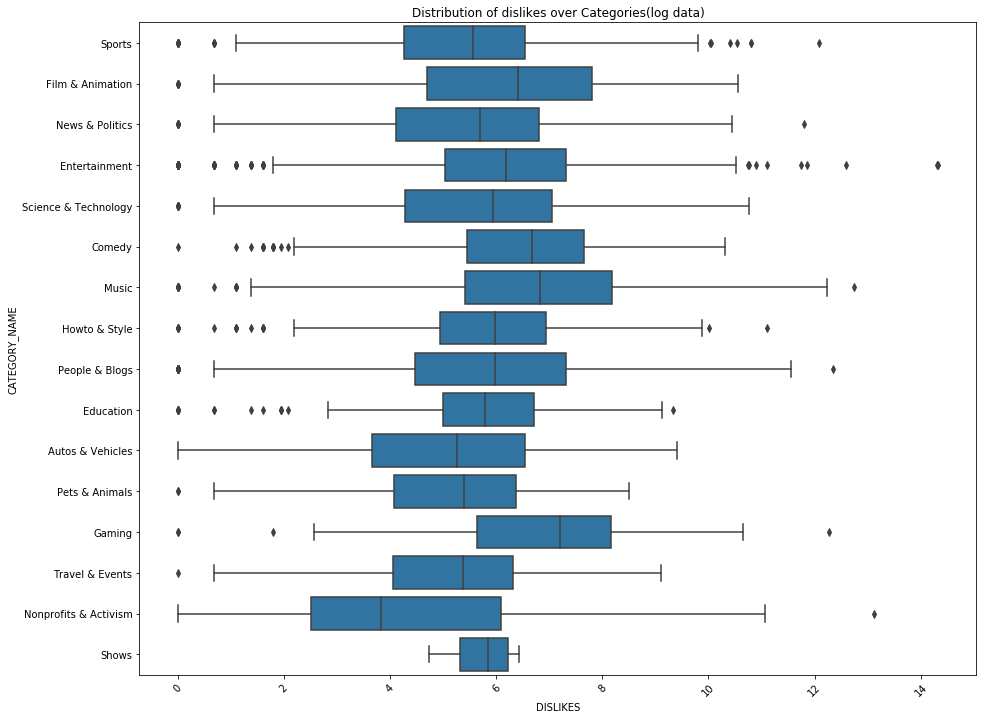

In [102]:

box_plot([15,12], df_videos,'dislikes', 'category_name',  45, 
          'Distribution of dislikes over Categories(log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of dislikes over categories. We can see that the data has outliers before min value as well as after max value for some categories. Also, we can see that some of the data is negative skewed like shows, gaming, entertainment, science and tech, travel and event etc while nonprofits & activism category shows data is positive skewed.

Let us now go ahead and check the density spread of comment count data over categories


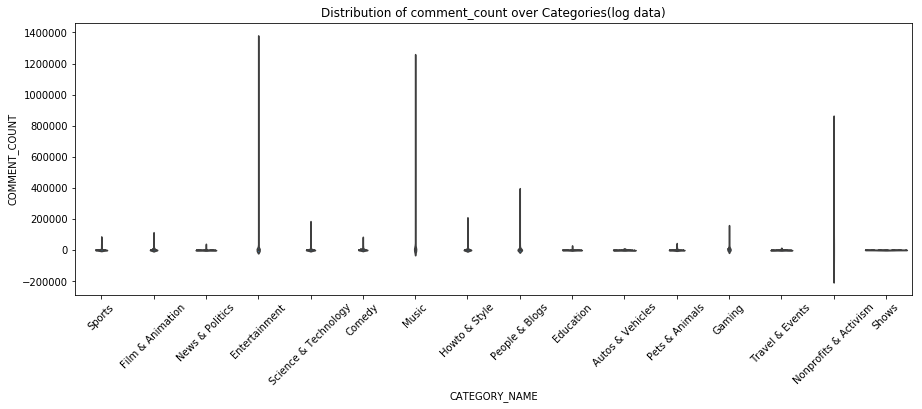

In [103]:
violin_plot([15,5], df_videos,'comment_count', 'category_name',  45, 
          'Distribution of comment_count over Categories(log data)', 'vertical')


**Comment:**

The Above plot shows us the density of data comment count for all the categories but the interpretation is not clear as the data has large sclae and looks overplotted because of lard scale and having more data in only perticular range. Lets try and apply the log scale to see if we can get a better picture of the distribution of comment count across the categories.

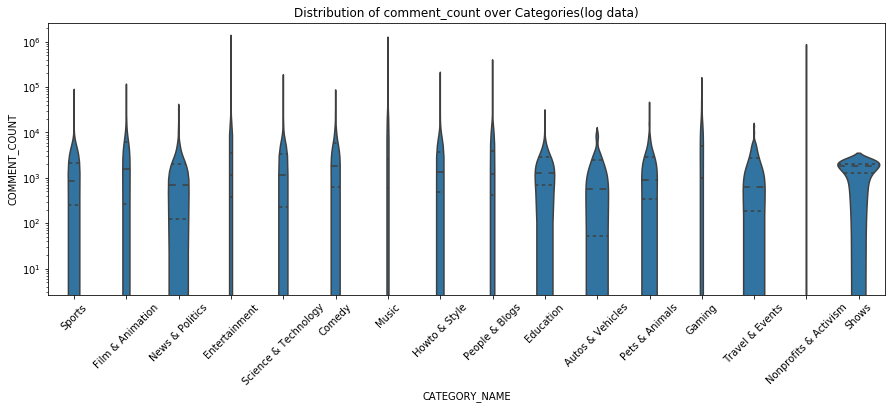

In [104]:

violin_plot([15,5], df_videos,'comment_count', 'category_name',  45, 
          'Distribution of comment_count over Categories(log data)', 'vertical_log')


**Comment:**

when applying log scale some times the scale doesn't show the complete data scale. As in the above plot we can see that only higher part of the data is plotted on the log scale. Lets see if we can get a clear picture when we actually apply log to the data rather than to the scale.


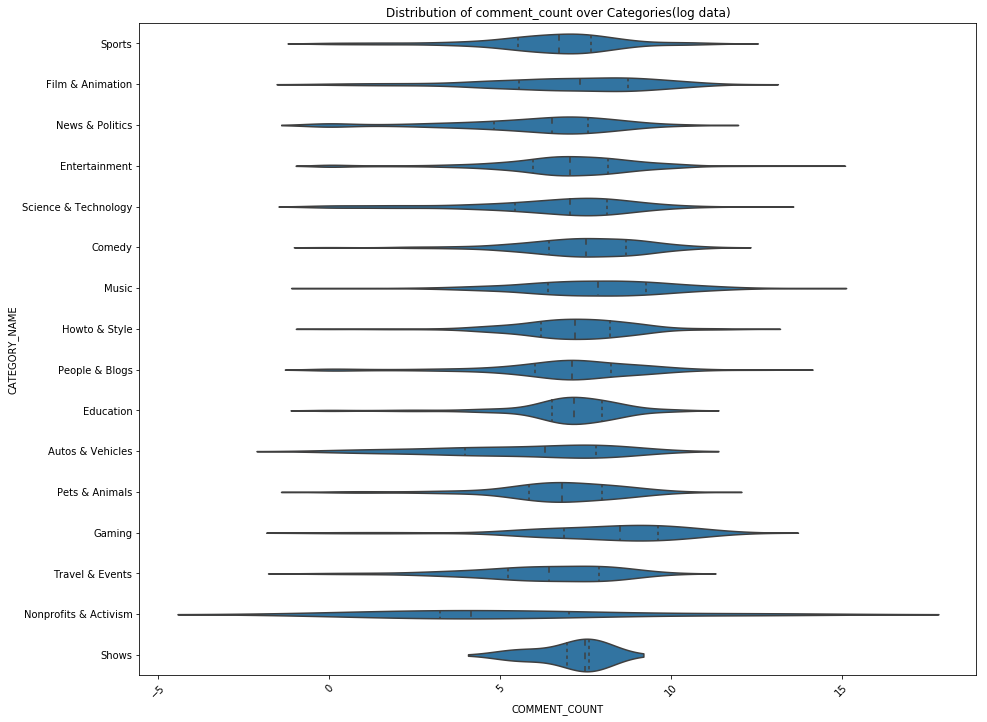

In [105]:

violin_plot([15,12], df_videos,'comment_count', 'category_name',  45, 
          'Distribution of comment_count over Categories(log data)', 'horizontal_log_data')


**Comment:**

From the above plots we can see that log scale doesn't show us a proper plot but when we use log applied data we get a better picture of the density spread of data. we can see that we have large scale data where the density of data is less at the min data points and max data points and the density is more in between. We can see that while most of the data shows relatively high variance but the density of 'education' and 'shows' show more density compared to others. We can also see that bimodality is suggested in 'shows' category.

Lets now see the descriptive statistics of comment count over categories.

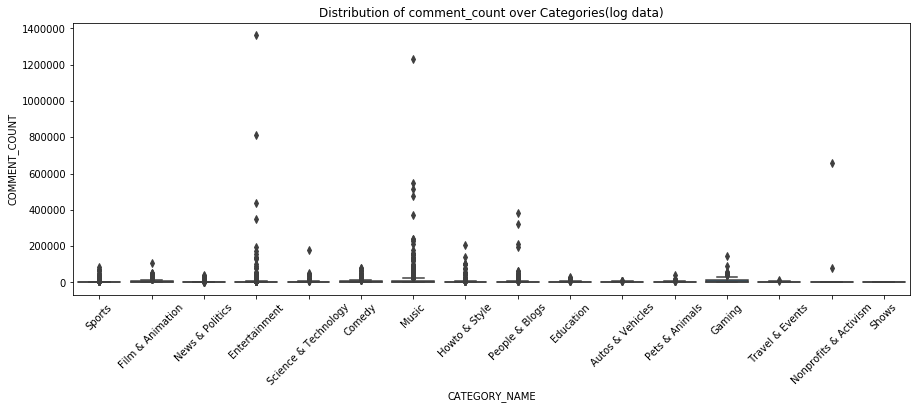

In [106]:

box_plot([15,5], df_videos,'comment_count', 'category_name',  45, 
          'Distribution of comment_count over Categories(log data)', 'vertical')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of likes over category names. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log scale is applied.

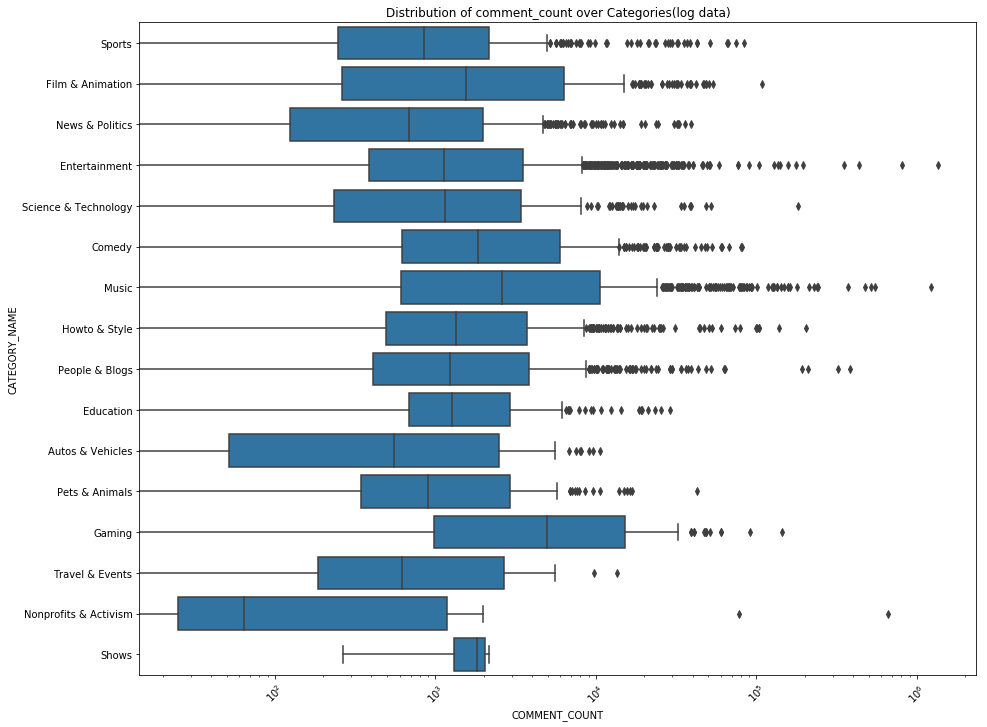

In [107]:

box_plot([15,12], df_videos,'comment_count', 'category_name',  45, 
          'Distribution of comment_count over Categories(log data)', 'horizontal_log')


**Comment:**

With the log scale applied we definitely have a better picture of the statistics but we don't have the complete data. The min values of the data are missing in the plot, this happens because of log scale. Lets try and see if we can get a better picture when we plot log transformed data.

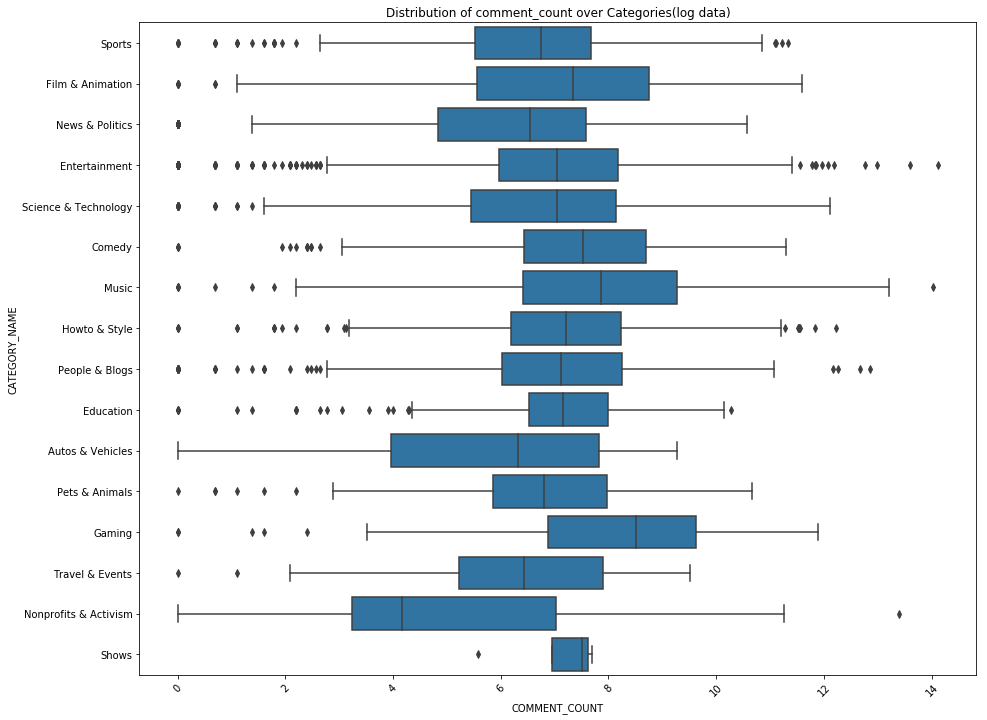

In [108]:

box_plot([15,12], df_videos,'comment_count', 'category_name',  45, 
          'Distribution of comment_count over Categories(log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of likes over categories. We can see that the data has outliers before min value as well as after max value  for some categories. Also, we can see that some of the data is negative skewed like shows, gaming, autos &vehicles,sports,  science and tech etc. while non profit, travel events, pets, education and few more are positive skewed.

Let us now go ahead and check the density spread of view data over channels

In [109]:
#we have many channels so lets just consider top 10 channels based on most published trending videos
df_top10_chn = df_videos[df_videos['channel_title'].isin(['ESPN', 'TheEllenShow', 
                                                          'The Tonight Show Starring Jimmy Fallon',
                                                          'Jimmy Kimmel Live', 'Netflix', 
                                                          'The Late Show with Stephen Colbert', 
                                                          'NBA', 'CNN', 'Vox', 
                                                          'The Late Late Show with James Corden'])]
        

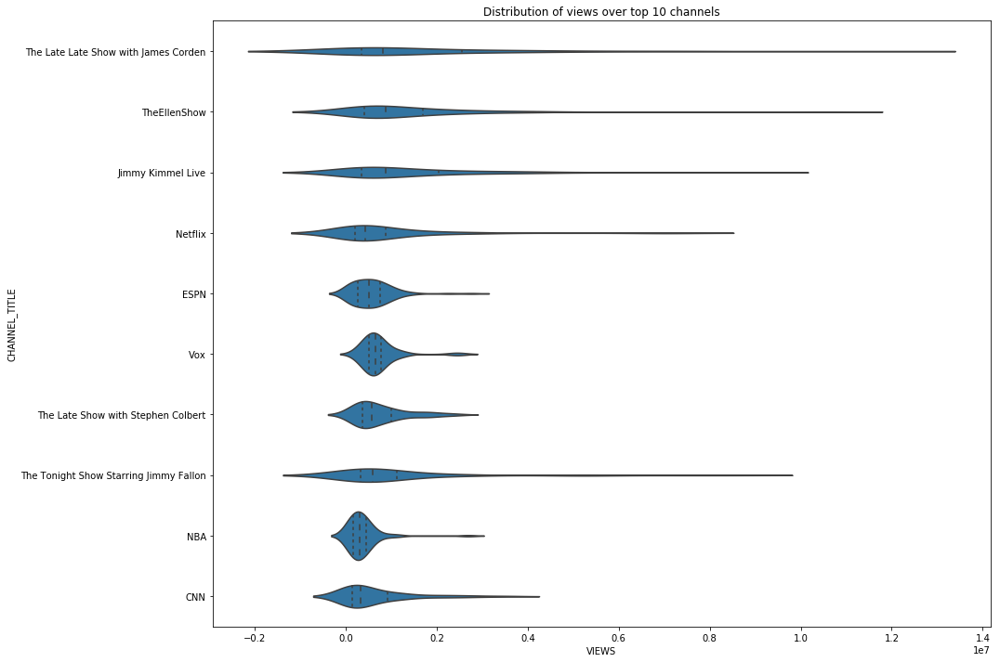

In [110]:
violin_plot([15,12], df_top10_chn,'views', 'channel_title',  0, 
          'Distribution of views over top 10 channels', 'horizontal')


**Comment:**

The above plot shows us the dnetisy spread of data for the top 10 channels. Here we can see and understand the data as its only a subset of main data. From the above plot we can see that some of the channels show relatively high varience but the density of NBA, VOX, ESPN show more density than the other channels. We can also see that bimodality is suggested in VOX channel. Lets see how the data behaves when we plot log transformed data.

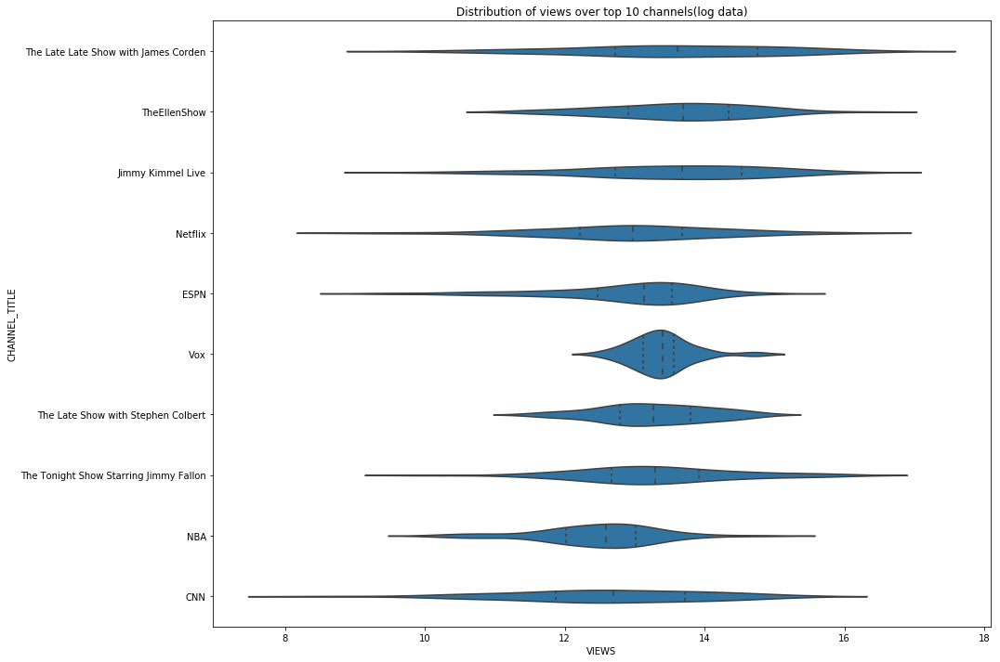

In [111]:

violin_plot([15,12], df_top10_chn,'views', 'channel_title',  0, 
          'Distribution of views over top 10 channels(log data)', 'horizontal_log_data')

**Comment:**

From the above log transformed data plot we can see that it gives us quite different look of the density spread of data when compared to data without transformation. Here we can see that VOX has more density than other which show relatively high varience but it is also VOX which suggests bimodality.

Let us now go ahead and check the descriptive statistics of the data

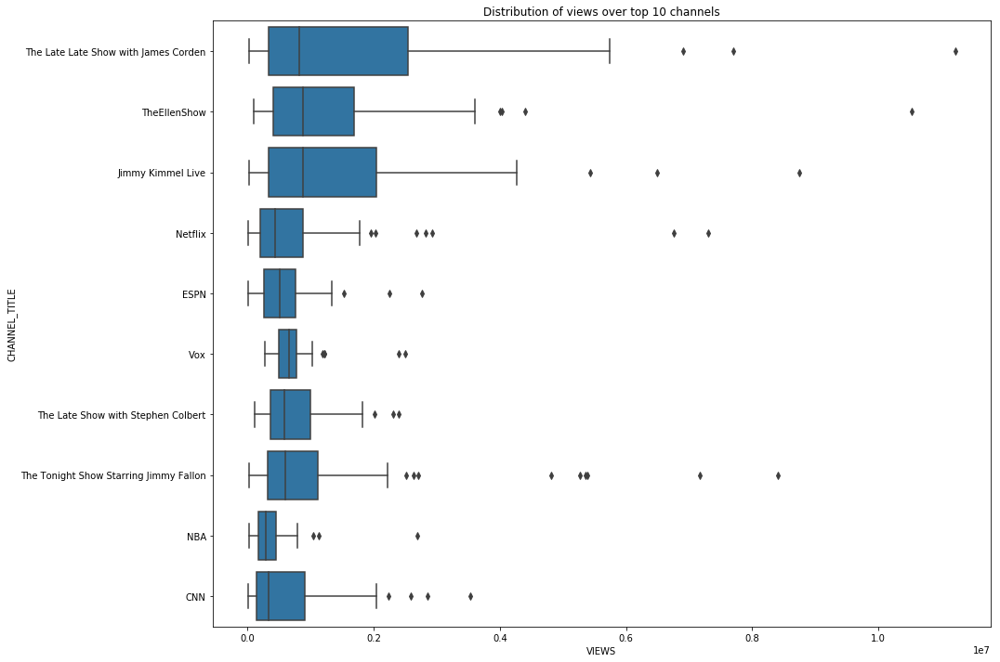

In [112]:
box_plot([15,12], df_top10_chn,'views', 'channel_title',  0, 
          'Distribution of views over top 10 channels', 'horizontal')


**Comment:**

From the above plot we can get an insight on descriptive statistics of the data. Here we can see that the plot show many outliers after the max value. we can also see that most of the data is positive skewed. Lets check how the data behaves with log transformation.

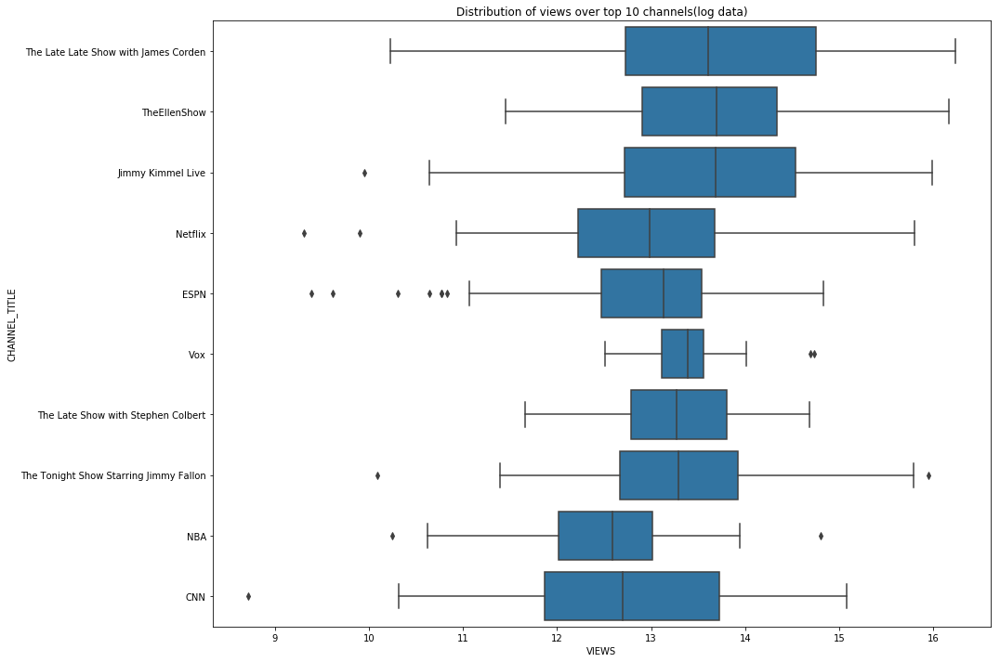

In [113]:

box_plot([15,12], df_top10_chn,'views', 'channel_title',  0, 
          'Distribution of views over top 10 channels(log data)', 'horizontal_log_data')

**Comment:**

From the above log transformed data plot we can see that it shows us different statistics than the original data. Here we can see that only few of the data shows outliers. The outliers are present before the min value and also after the max value. we can also see that some of the data is positive skewed and some of the data is negative skewed.

Lets go ahead and check the density spread of likes over channels

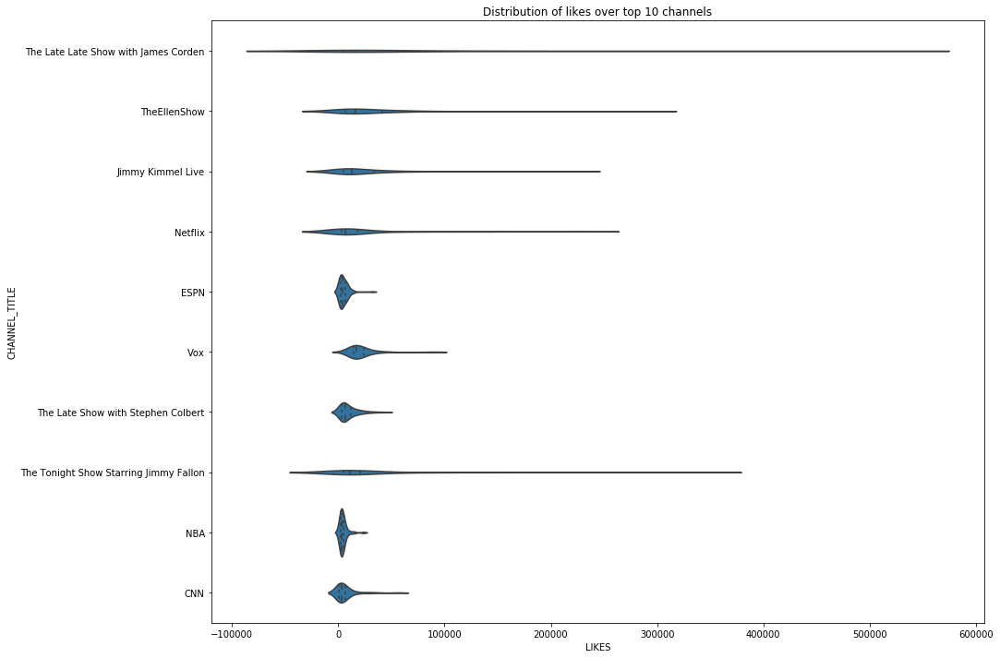

In [114]:
violin_plot([15,12], df_top10_chn,'likes', 'channel_title',  0, 
          'Distribution of likes over top 10 channels', 'horizontal')


**Comment:**

The above plot shows us the dnetisy spread of data for the top 10 channels. Here we can see and understand part the data as its only a subset of main data. From the above plot we can see that some of the channels show relatively high varience but the density of NBA, VOX, ESPN show more density than the other channels. Lets see how the data behaves when we plot log transformed data


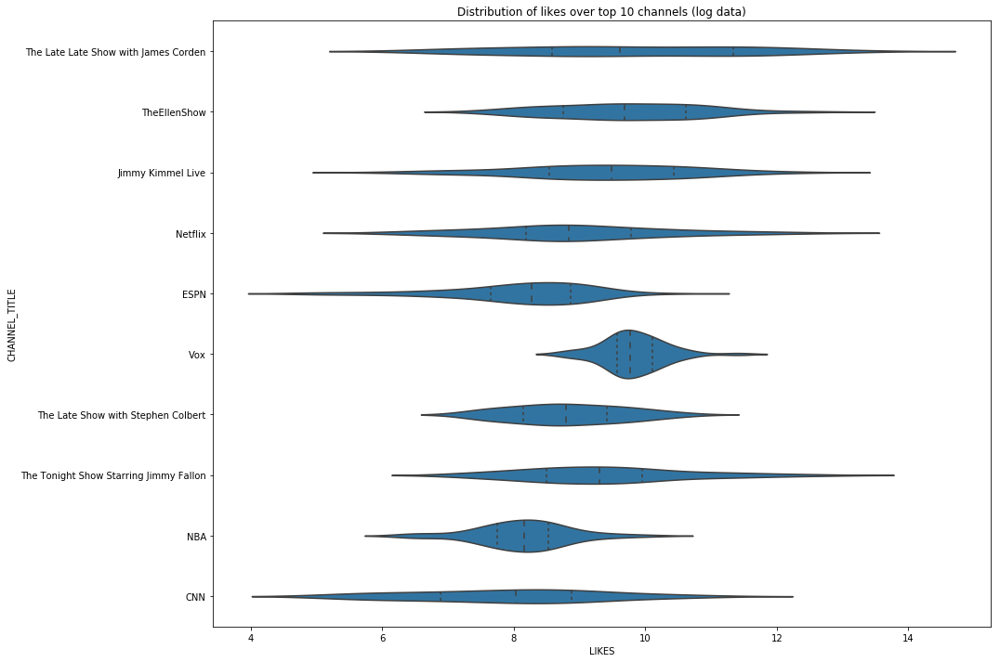

In [115]:

violin_plot([15,12], df_top10_chn,'likes', 'channel_title',  0, 
          'Distribution of likes over top 10 channels (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that it gives us quite different look of the density spread of data when compared to data without transformation. Here we can see that VOX, NBA have more density than other which show relatively high varience.

Let us now go ahead and check the descriptive statistics of the data


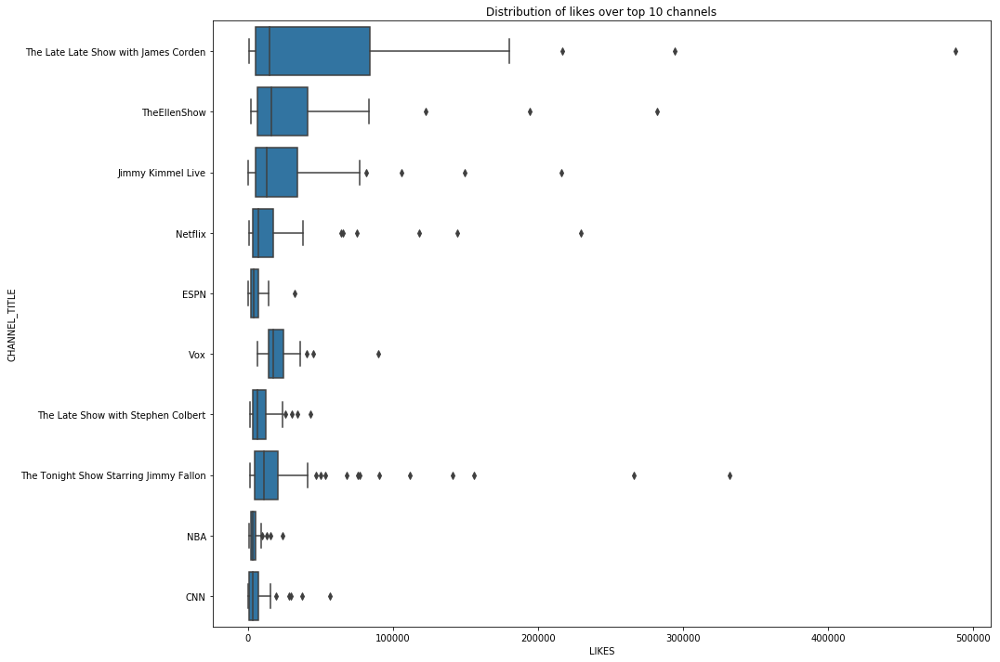

In [116]:
box_plot([15,12], df_top10_chn,'likes', 'channel_title',  0, 
          'Distribution of likes over top 10 channels', 'horizontal')


**Comment:**

From the above plot we can get an insight on descriptive statistics of the data. Here we can see that the plot show many outliers after the max value. we can also see that most of the data is positive skewed. Lets check how the data behaves with log transformation.


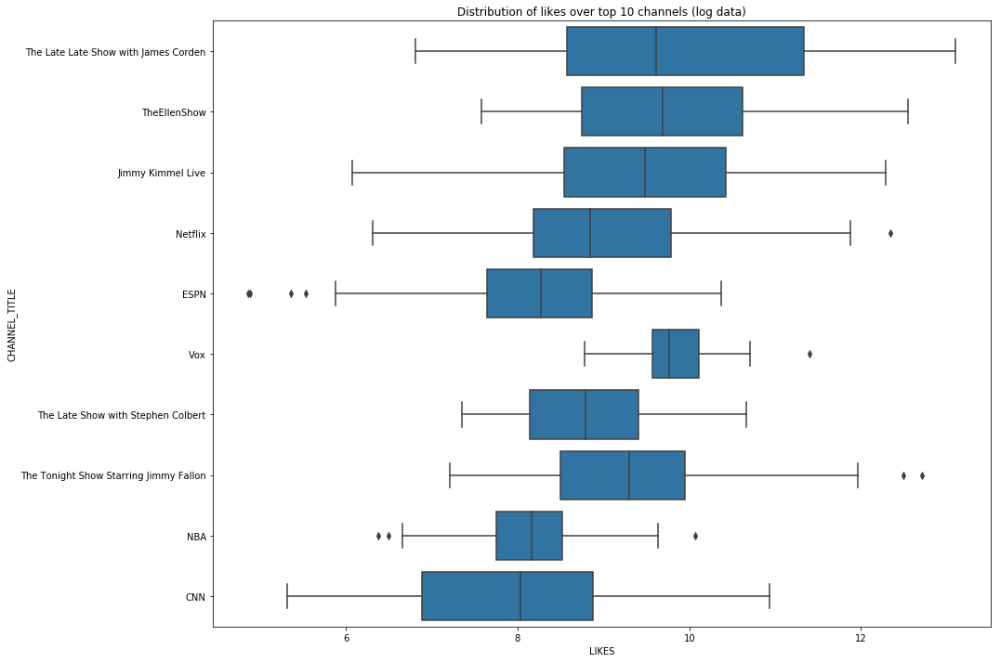

In [117]:

box_plot([15,12], df_top10_chn,'likes', 'channel_title',  0, 
          'Distribution of likes over top 10 channels (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that it shows us different statistics than the original data. Here we can see that only few of the data shows outliers. The outliers are present before the min value and also after the max value. we can also see that some of the data is positive skewed and some of the data is negative skewed.

Lets go ahead and check the density spread of dislikes over channels

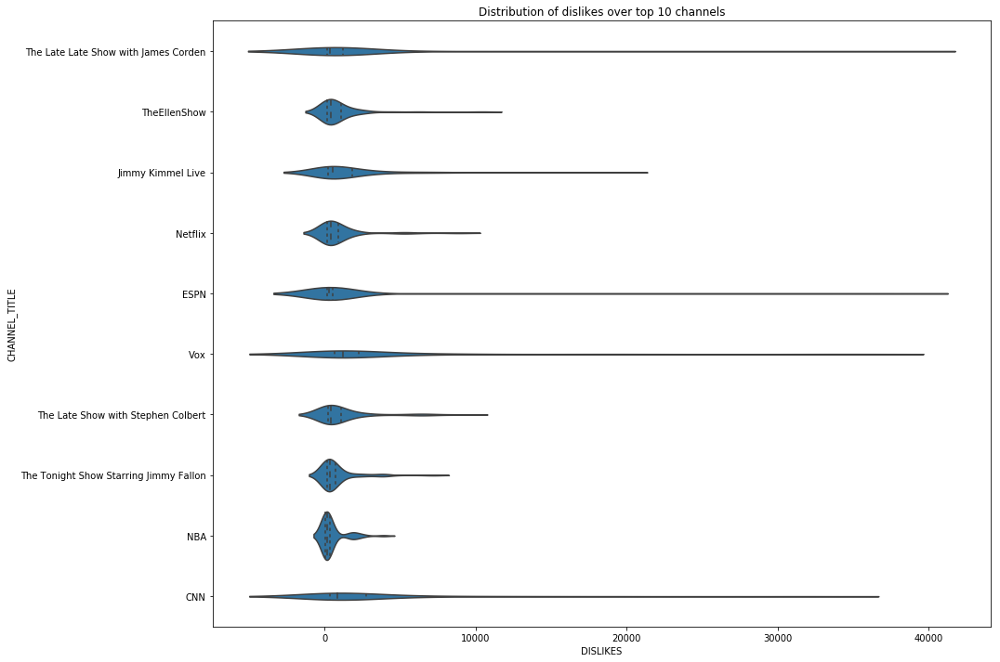

In [118]:
violin_plot([15,12], df_top10_chn,'dislikes', 'channel_title',  0, 
          'Distribution of dislikes over top 10 channels', 'horizontal')


**Comment:**

The above plot shows us the dentisy spread of data for the top 10 channels. Here we can see and understand the data as its only a subset of main data. From the above plot we can see that some of the channels show relatively high varience but the density of some channels show more density than the other channels. We can also see that bimodality is suggested in some channels like NBA. Lets see how the data behaves when we plot log transformed data

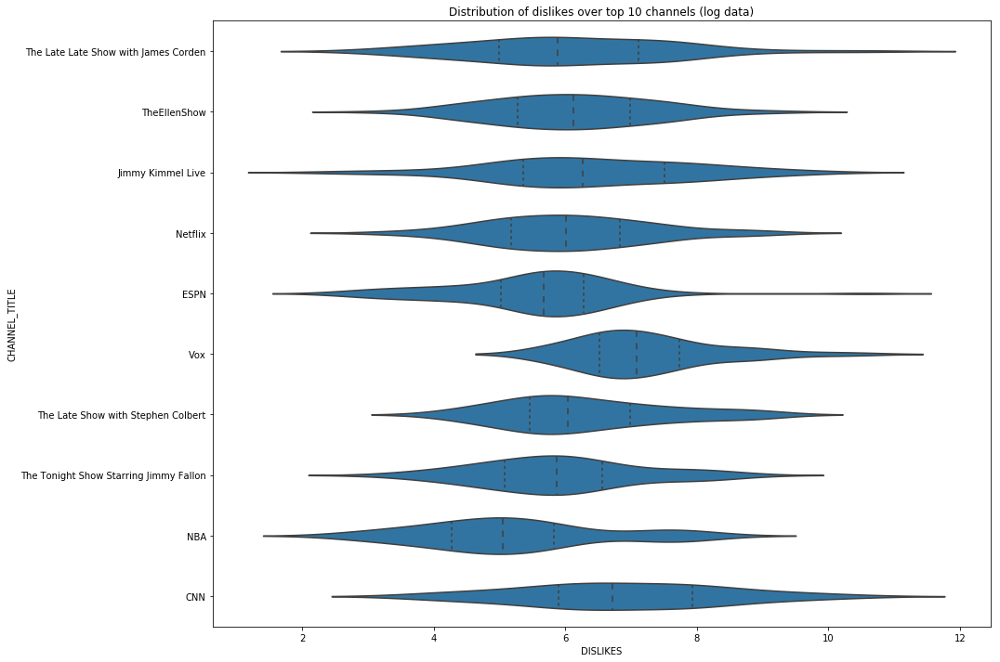

In [119]:

violin_plot([15,12], df_top10_chn,'dislikes', 'channel_title',  0, 
          'Distribution of dislikes over top 10 channels (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that it gives us quite different look of the density spread of data when compared to data without transformation. some of the channels show relatively high varience but the density of some channels show more density than the other channels. Also, NBA suggests bimodality.

Let us now go ahead and check the descriptive statistics of the data


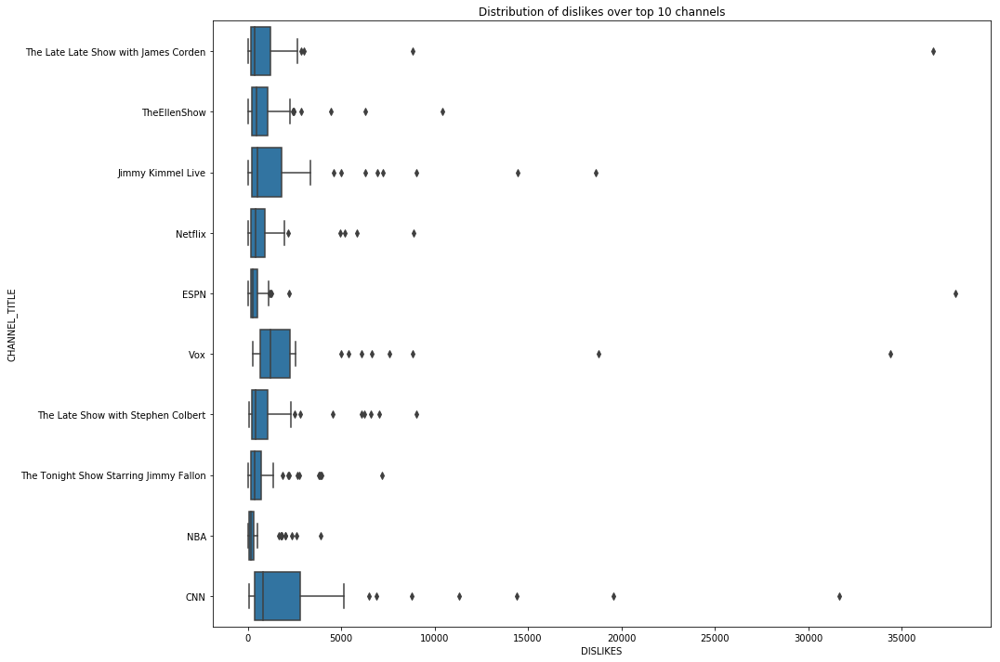

In [120]:


box_plot([15,12], df_top10_chn,'dislikes', 'channel_title',  0, 
          'Distribution of dislikes over top 10 channels', 'horizontal')


**Comment:**

From the above plot we can get an insight on descriptive statistics of the data. Here we can see that the plot show many outliers after the max value. we can also see that most of the data is positive skewed. Lets check how the data behaves with log transformation.


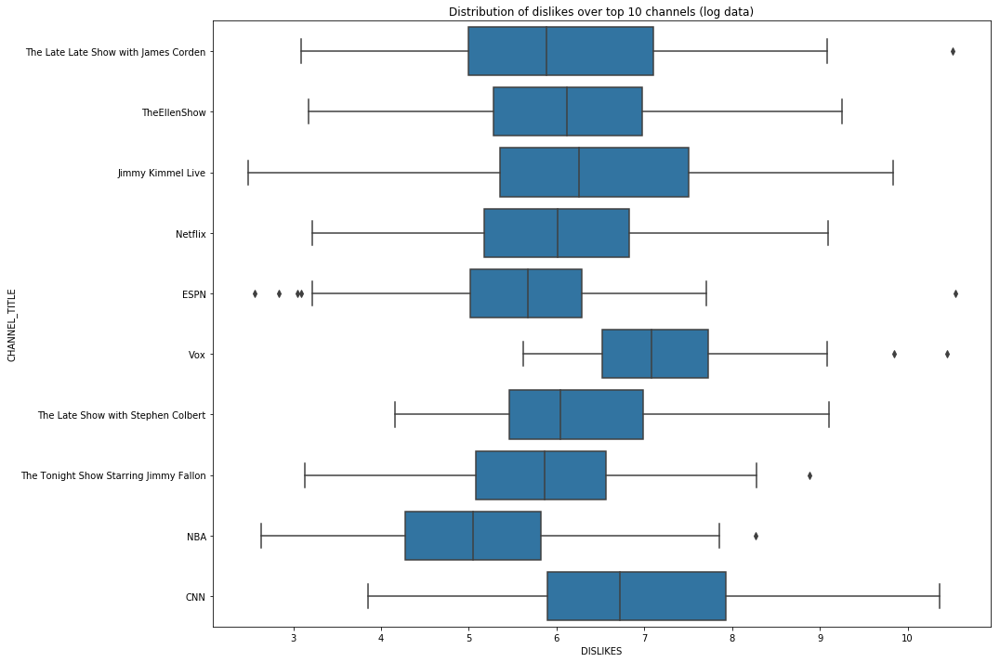

In [121]:

box_plot([15,12], df_top10_chn,'dislikes', 'channel_title',  0, 
          'Distribution of dislikes over top 10 channels (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that it shows us different statistics than the original data. Here we can see that only few of the data shows outliers. The outliers are present before the min value and also after the max value. we can also see that most of the data is positive skewed.

Lets go ahead and check the density spread of comment_count over channels

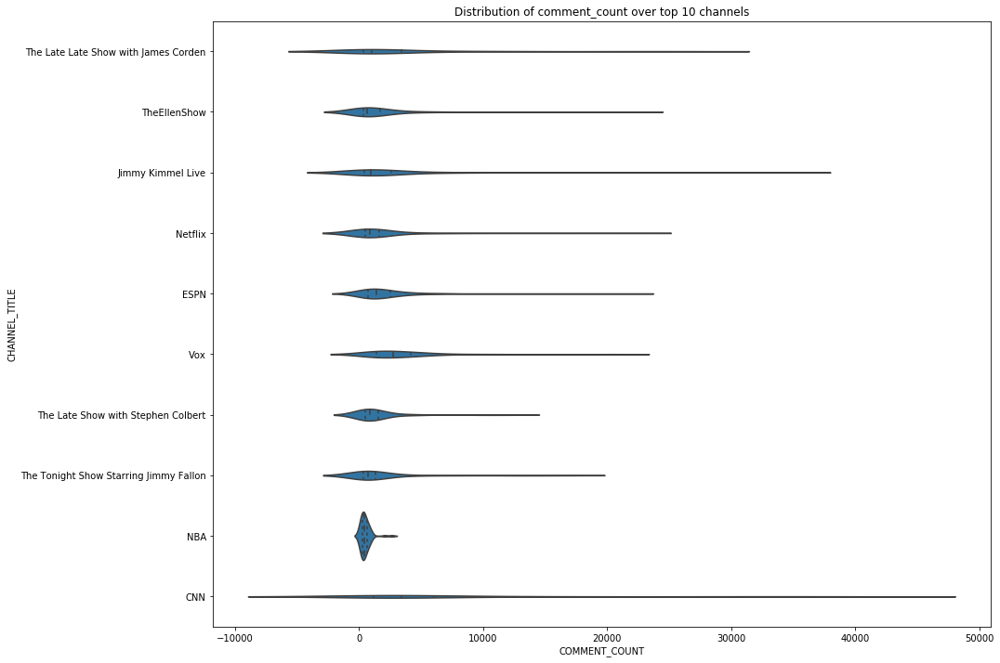

In [122]:
violin_plot([15,12], df_top10_chn,'comment_count', 'channel_title',  0, 
          'Distribution of comment_count over top 10 channels', 'horizontal')


**Comment:**

The above plot shows us the dentisy spread of data for the top 10 channels. Here we can see and understand part of the data as its only a subset of main data. From the above plot we can see that some of the channels show relatively high varience but the density of NBA shows more density than the other channels. Lets see how the data behaves when we plot log transformed data

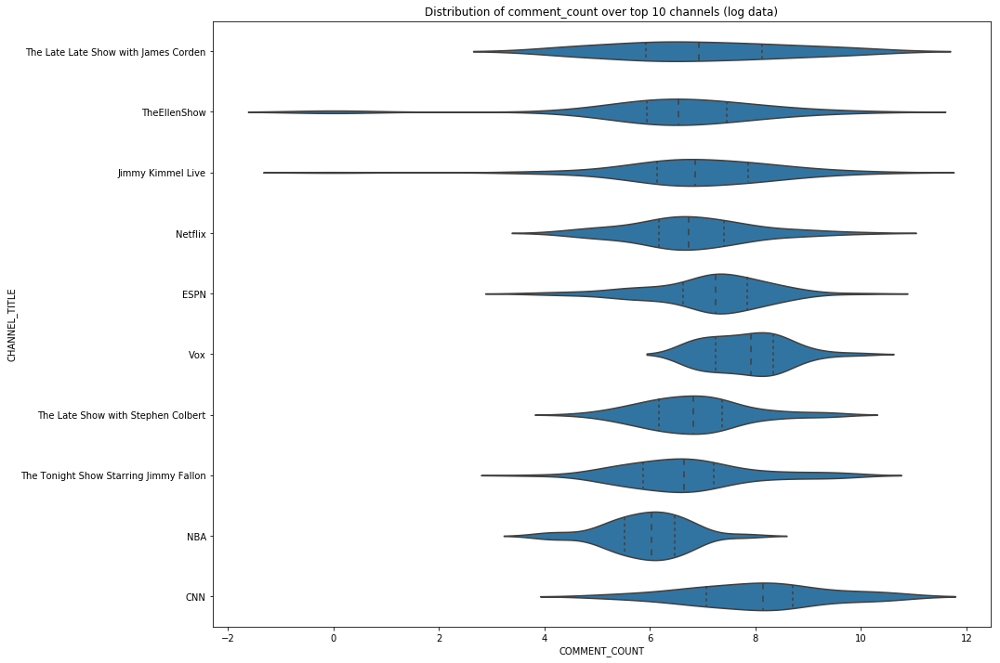

In [123]:

violin_plot([15,12], df_top10_chn,'comment_count', 'channel_title',  0, 
          'Distribution of comment_count over top 10 channels (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that it gives us quite different look of the density spread of data when compared to data without transformation. Here we can see that VOX and The ellen show suggests bimodality.

Let us now go ahead and check the descriptive statistics of the data


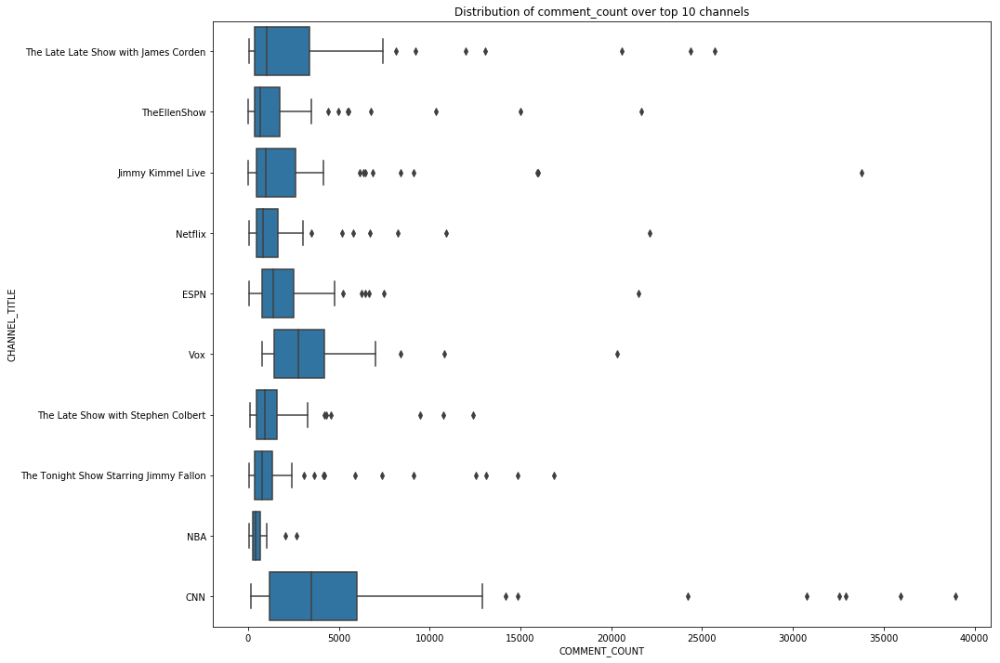

In [124]:


box_plot([15,12], df_top10_chn,'comment_count', 'channel_title',  0, 
          'Distribution of comment_count over top 10 channels', 'horizontal')


**Comment:**

From the above plot we can get an insight on descriptive statistics of the data. Here we can see that the plot show many outliers after the max value. we can also see that most of the data is positive skewed. Lets check how the data behaves with log transformation.

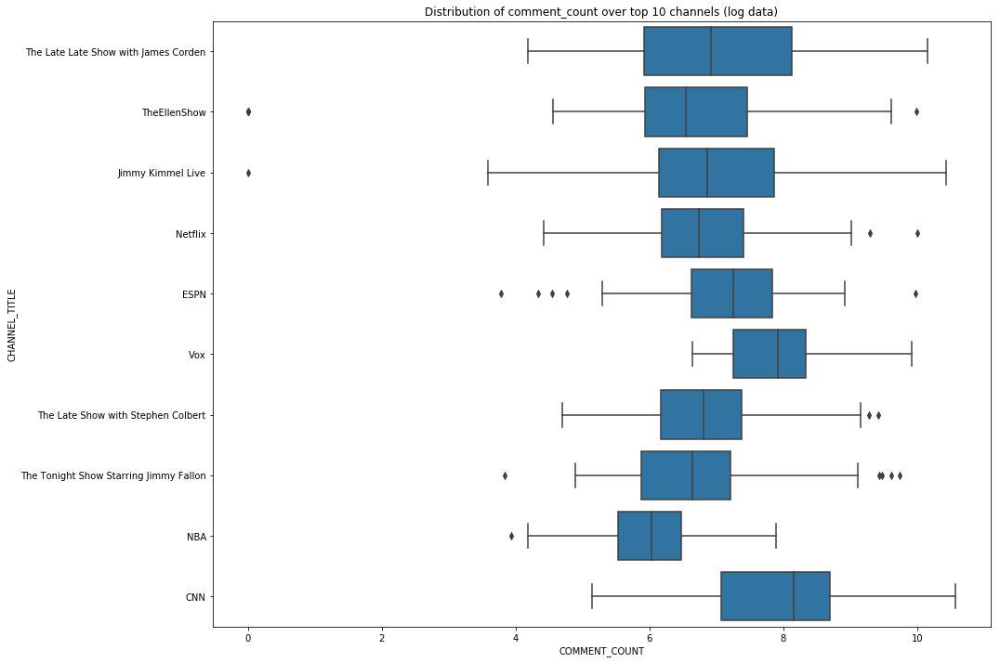

In [125]:

box_plot([15,12], df_top10_chn,'comment_count', 'channel_title',  0, 
          'Distribution of comment_count over top 10 channels (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that it shows us different statistics than the original data. Here we can see that only few of the data shows outliers. The outliers are present before the min value and also after the max value. we can also see that most of the data is positive skewed and some of the data is negative skewed.

Lets go ahead and check the density spread of views over months

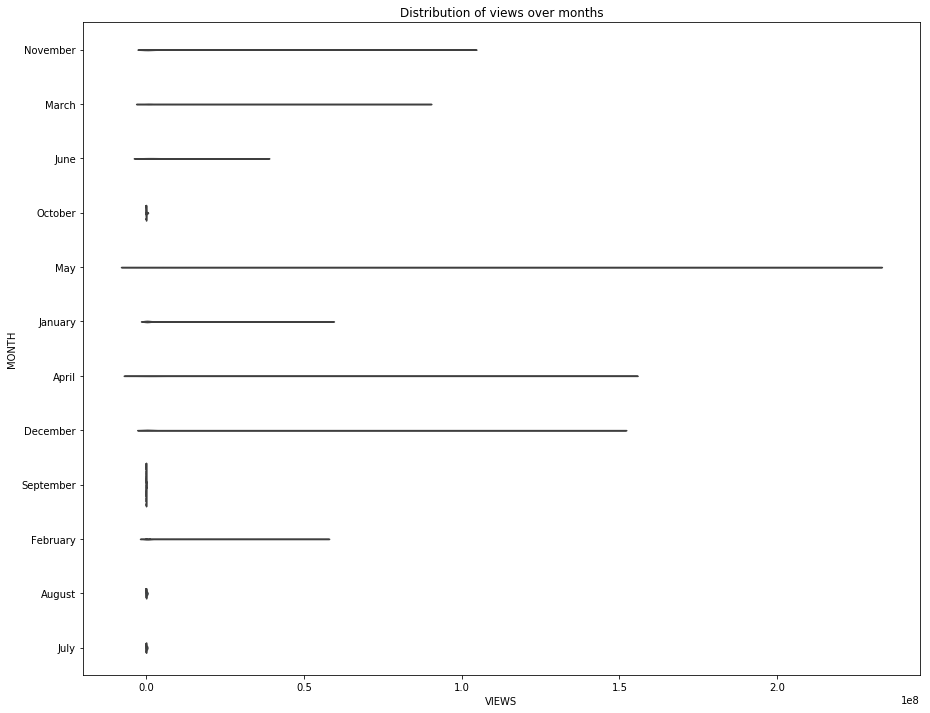

In [126]:
violin_plot([15,12], df_videos,'views', 'month',  0, 
          'Distribution of views over months', 'horizontal')


**Comment:**

The Above plot shows us the density of data for all the months but the interpretation is not clear as the data has large scale. Lets try and apply the log transformation to see if we can get a better picture of the distribution of data across months.

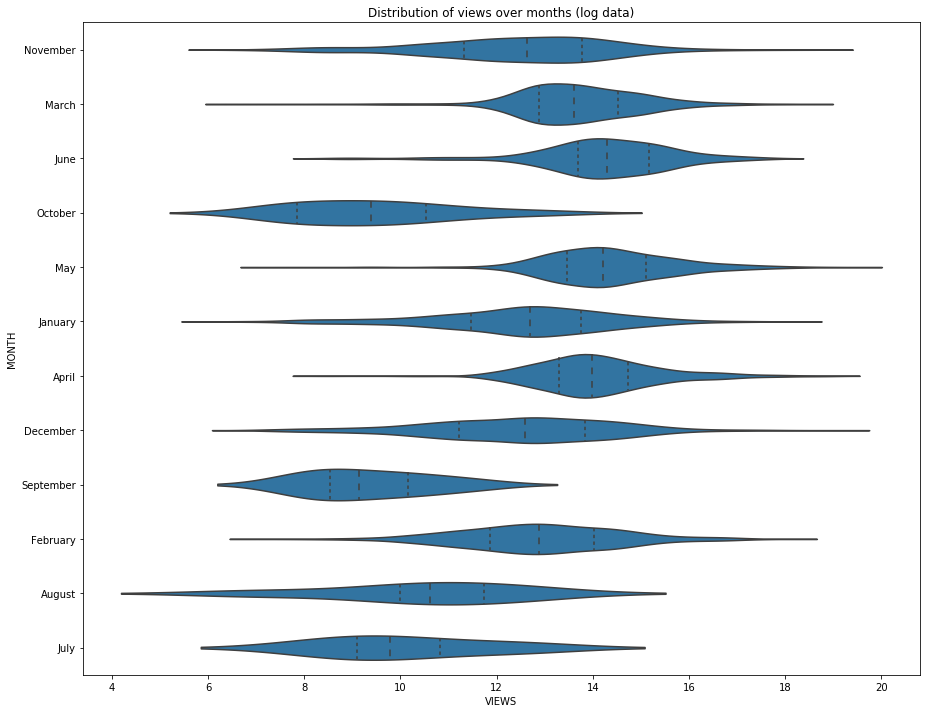

In [127]:

violin_plot([15,12], df_videos,'views', 'month',  0, 
          'Distribution of views over months (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that we get better picture of the data density. Here we can see that the density of summer months is more than the rest of the months also February suggests Bimodality.

Lets check the descriptive statistics of the data

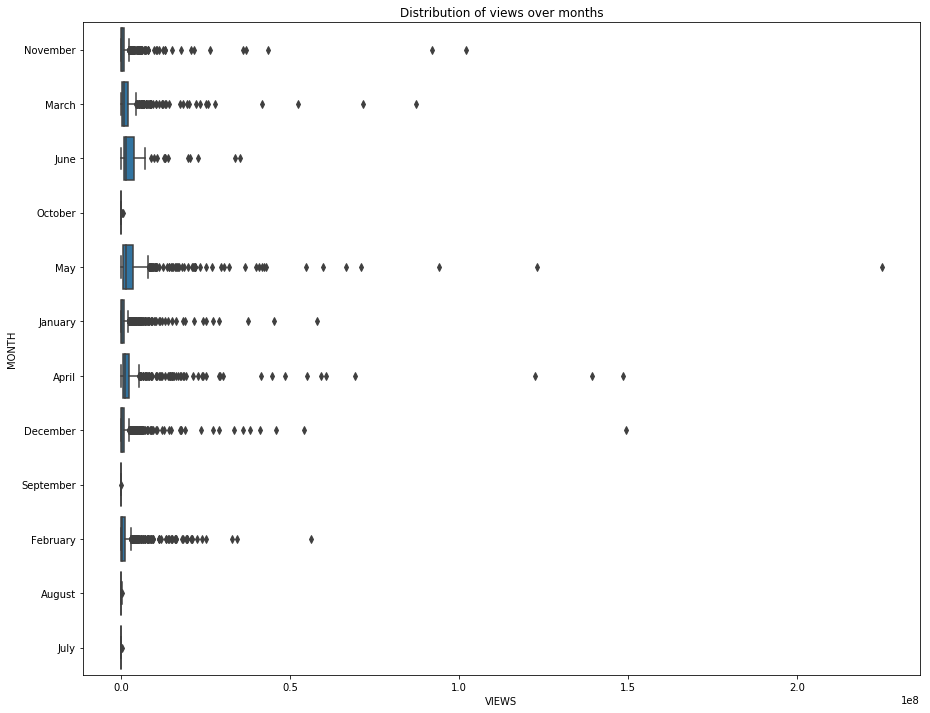

In [128]:


box_plot([15,12], df_videos,'views', 'month',  0, 
          'Distribution of views over months', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of views over months. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.


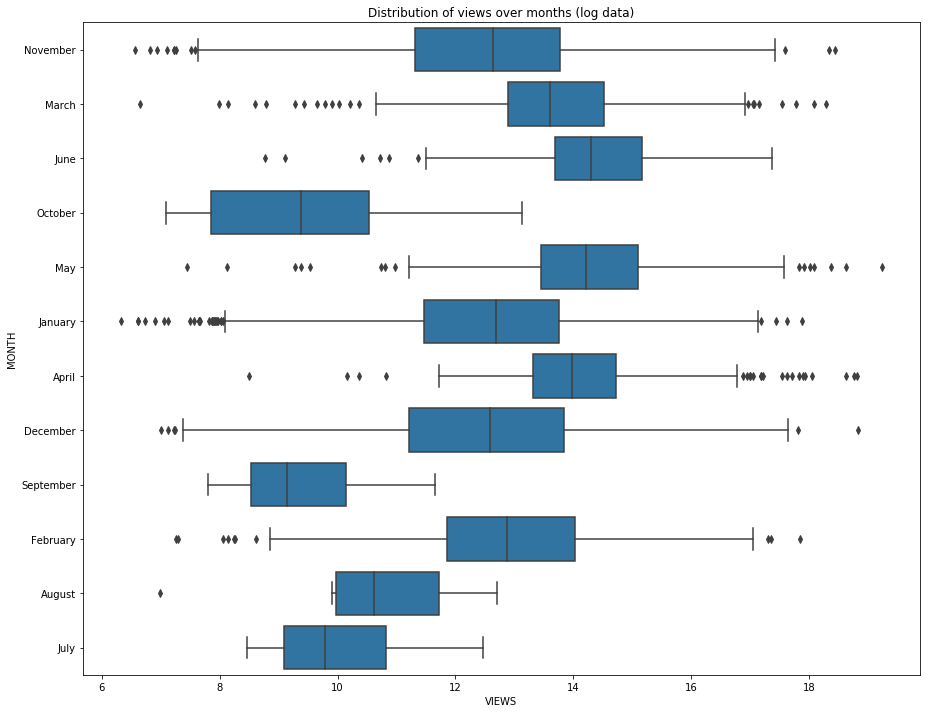

In [129]:

box_plot([15,12], df_videos,'views', 'month',  0, 
          'Distribution of views over months (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics desired data We can see that the data has outliers before min value as well as after max value for some months. Also, we can see that some of the data is negative skewed ans some of the data is positive skewed.

Let us now go ahead and check the density spread of likes data over months

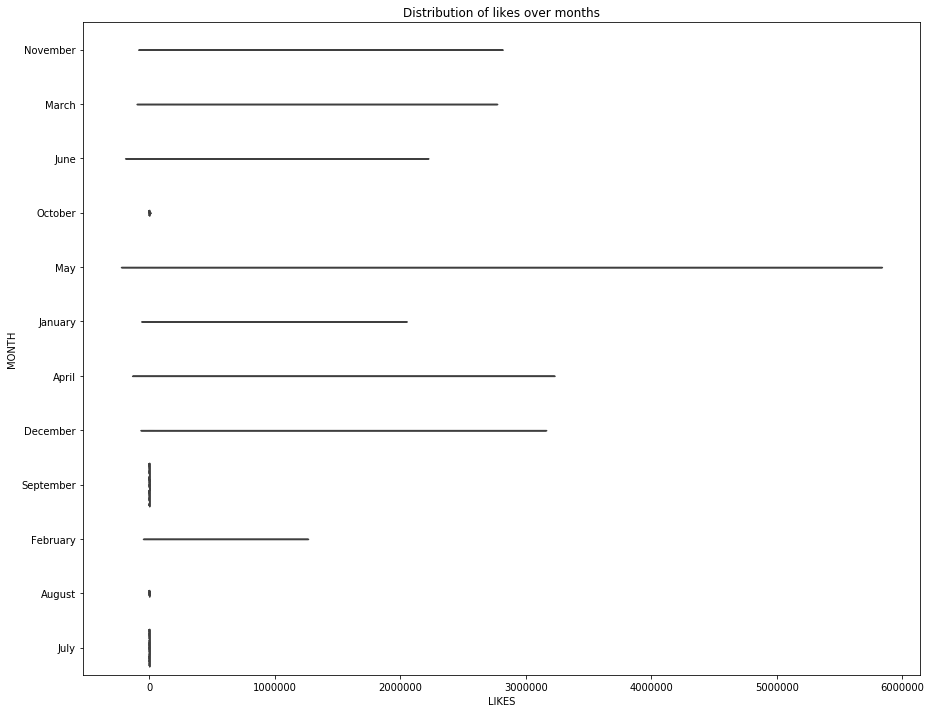

In [130]:
violin_plot([15,12], df_videos,'likes', 'month',  0, 
          'Distribution of likes over months', 'horizontal')


**Comment:**

The Above plot shows us the density of data for all the months but the interpretation is not clear as the data has large scale. Lets try and apply the log transformation to see if we can get a better picture of the distribution of data across months.

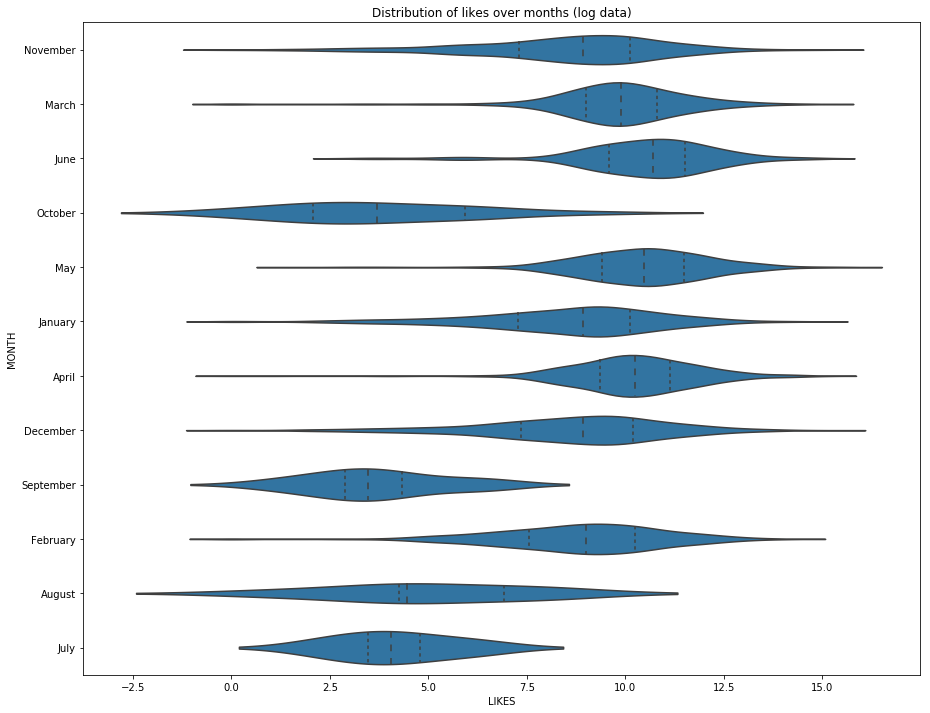

In [131]:

violin_plot([15,12], df_videos,'likes', 'month',  0, 
          'Distribution of likes over months (log data)', 'horizontal_log_data')




**Comment:**

From the above log transformed data plot we can see that we get better picture of the data density. Here we can see that the density of summer months is more than the rest of the months.

Lets check the descriptive statistics of the data

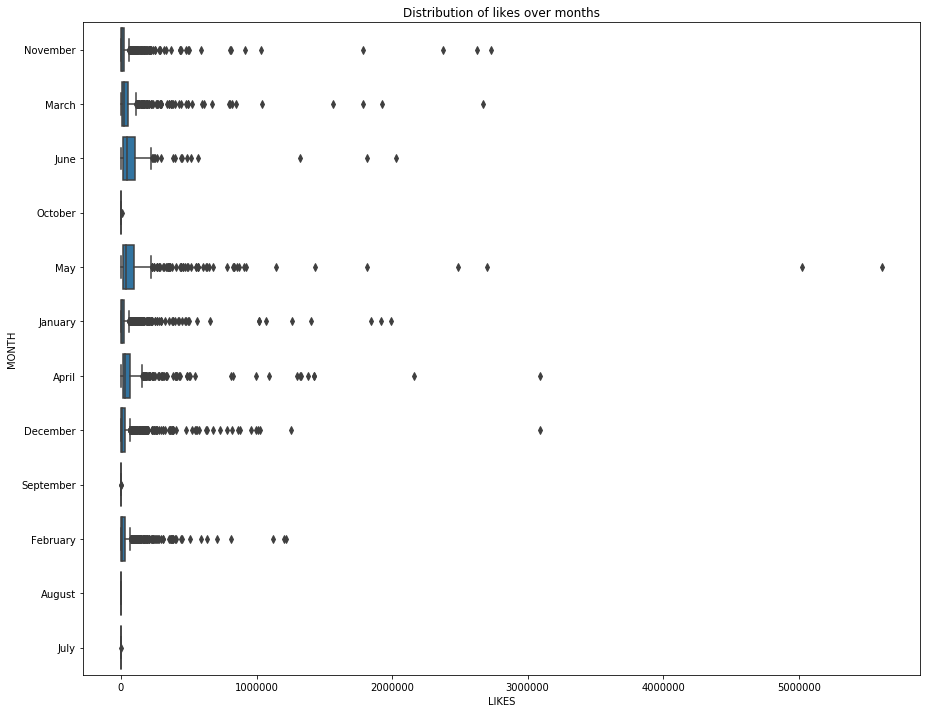

In [132]:
box_plot([15,12], df_videos,'likes', 'month',  0, 
          'Distribution of likes over months', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of likes over months. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.

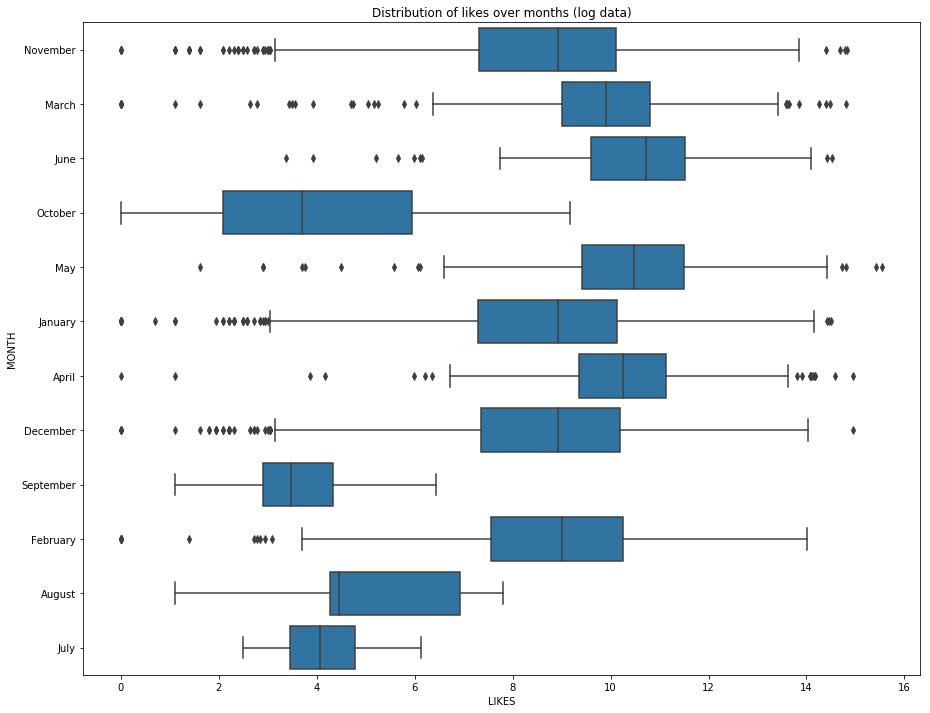

In [133]:

box_plot([15,12], df_videos,'likes', 'month',  0, 
          'Distribution of likes over months (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value for some months. Also, we can see that some of the data is negative skewed ans some of the data is positive skewed.

Let us now go ahead and check the density spread of dislikes data over months

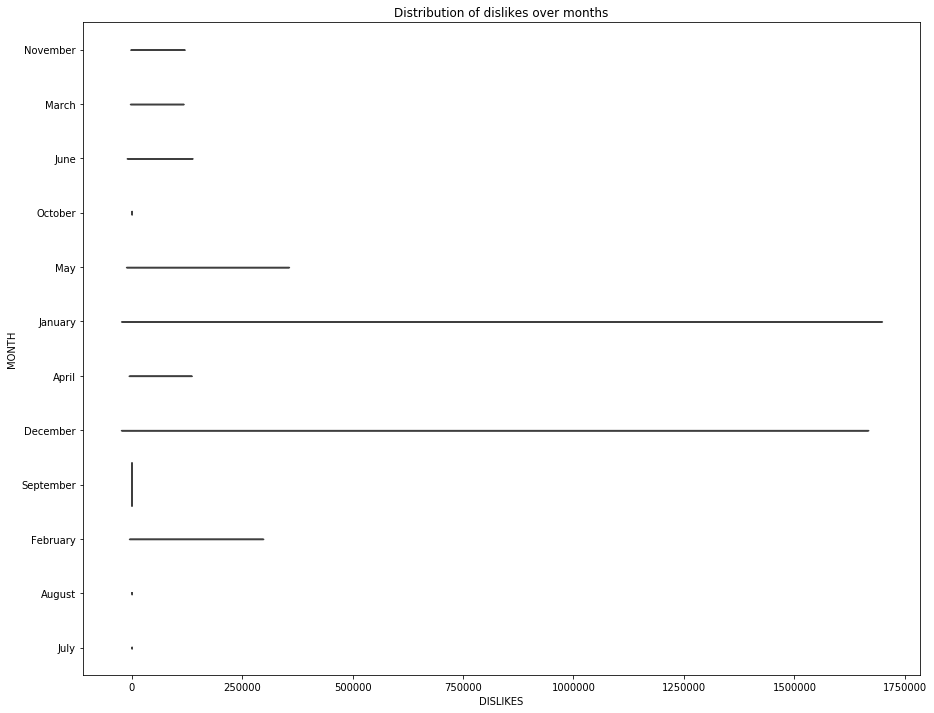

In [134]:
violin_plot([15,12], df_videos,'dislikes', 'month',  0, 
          'Distribution of dislikes over months', 'horizontal')


**Comment:**

The Above plot shows us the density of data for all the months but the interpretation is not clear as the data has large scale. Lets try and apply the log transformation to see if we can get a better picture of the distribution of data across months.

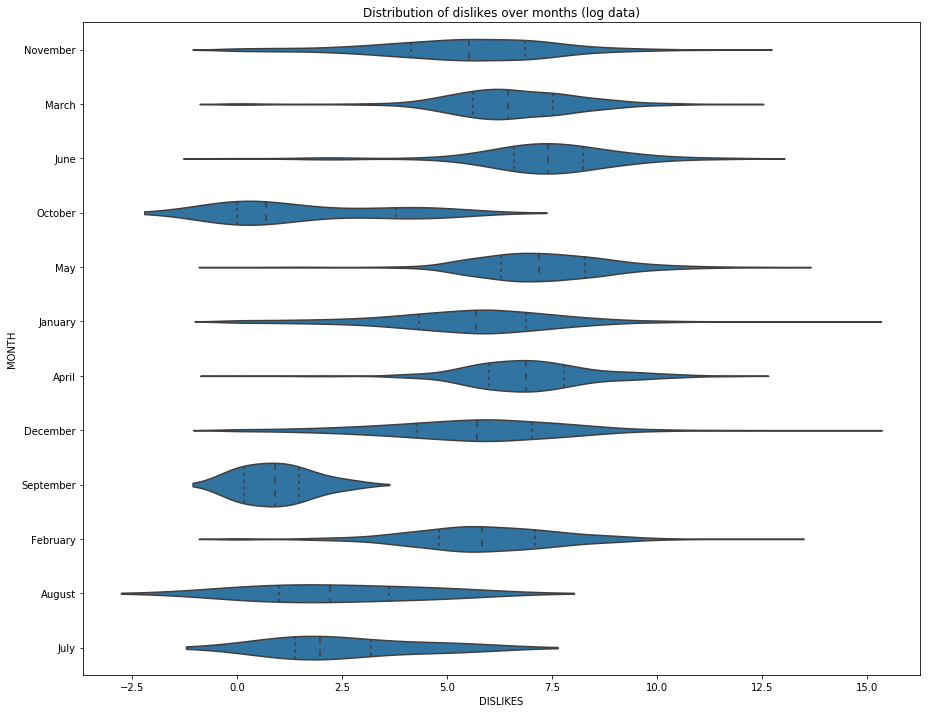

In [135]:

violin_plot([15,12], df_videos,'dislikes', 'month',  0, 
          'Distribution of dislikes over months (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that we get better picture of the data density. Here we can see that the density of september is more than the rest of the months also July suggests Bimodality.

Lets check the descriptive statistics of the data

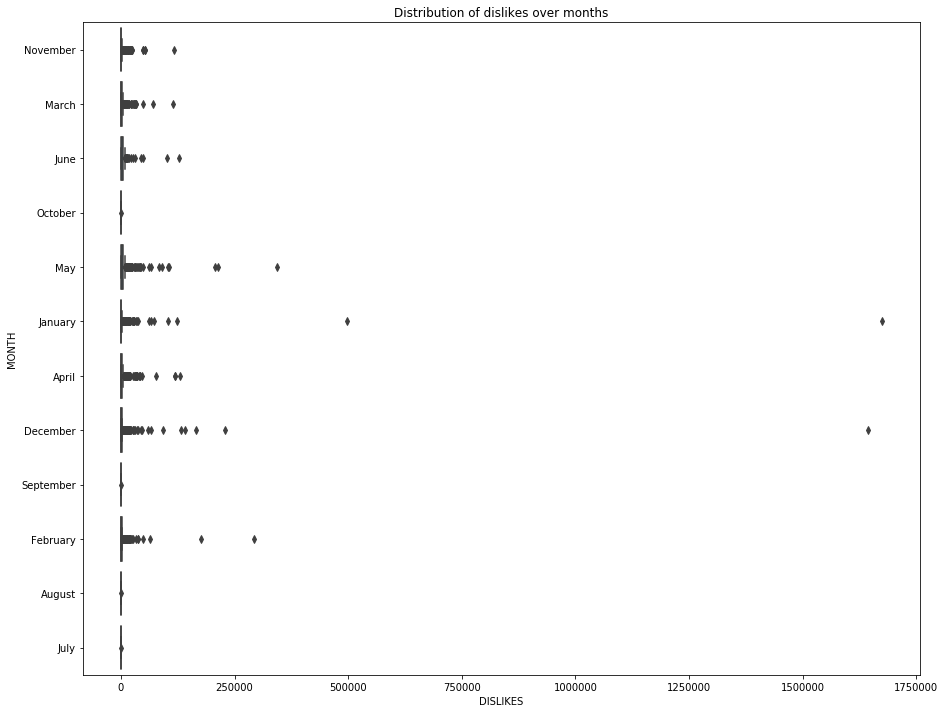

In [136]:


box_plot([15,12], df_videos,'dislikes', 'month',  0, 
          'Distribution of dislikes over months', 'horizontal')



**Comment:**

The above plot should help us get a understanding of descriptive statistics of views over months. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.

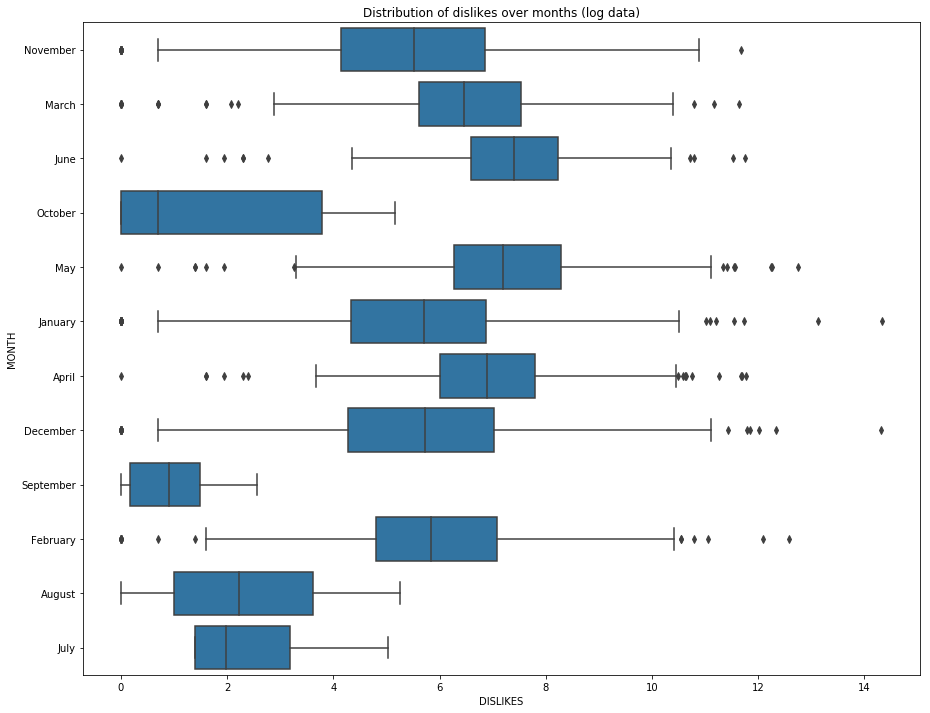

In [137]:
box_plot([15,12], df_videos,'dislikes', 'month',  0, 
          'Distribution of dislikes over months (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value for some months. Also, we can see that some of the data is negative skewed ans some of the data is positive skewed.

Let us now go ahead and check the density spread of comments count data over months

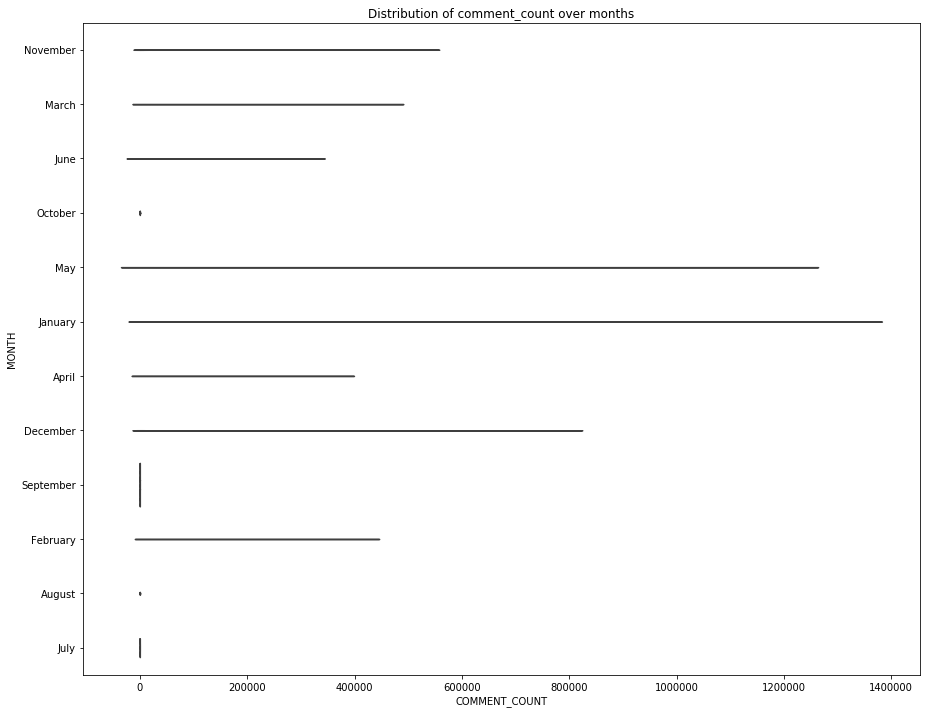

In [138]:
violin_plot([15,12], df_videos,'comment_count', 'month',  0, 
          'Distribution of comment_count over months', 'horizontal')


**Comment:**

The Above plot shows us the density of data for all the months but the interpretation is not clear as the data has large scale. Lets try and apply the log transformation to see if we can get a better picture of the distribution of data across months.

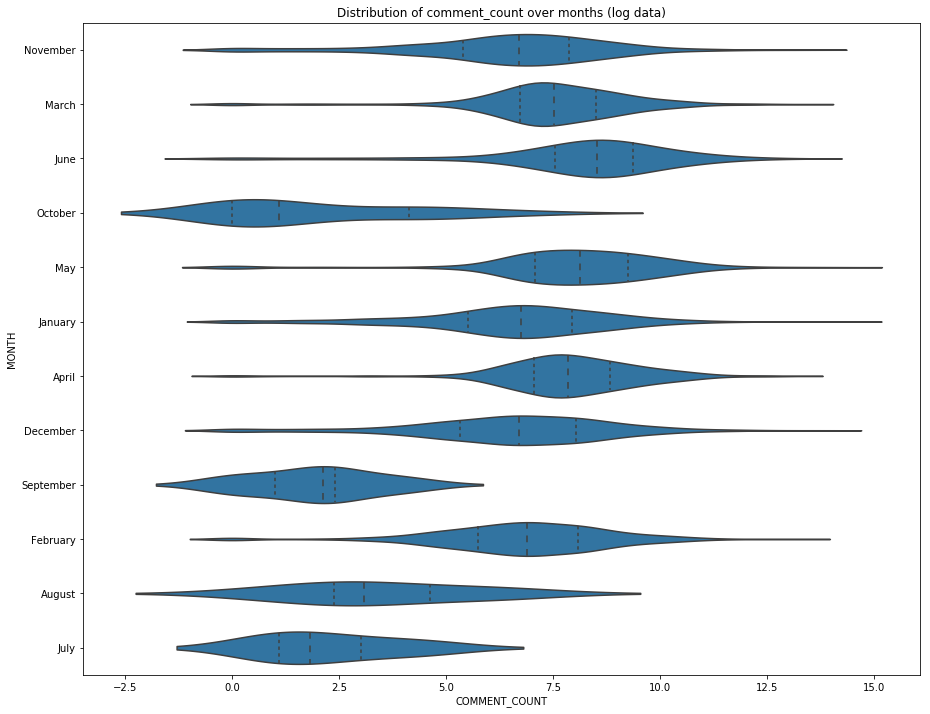

In [139]:

violin_plot([15,12], df_videos,'comment_count', 'month',  0, 
          'Distribution of comment_count over months (log data)', 'horizontal_log_data')


**Comment:**

From the above log transformed data plot we can see that we get better picture of the data density. Here we can see that the density of summer months is more than the rest of the months also February suggests Bimodality.

Lets check the descriptive statistics of the data

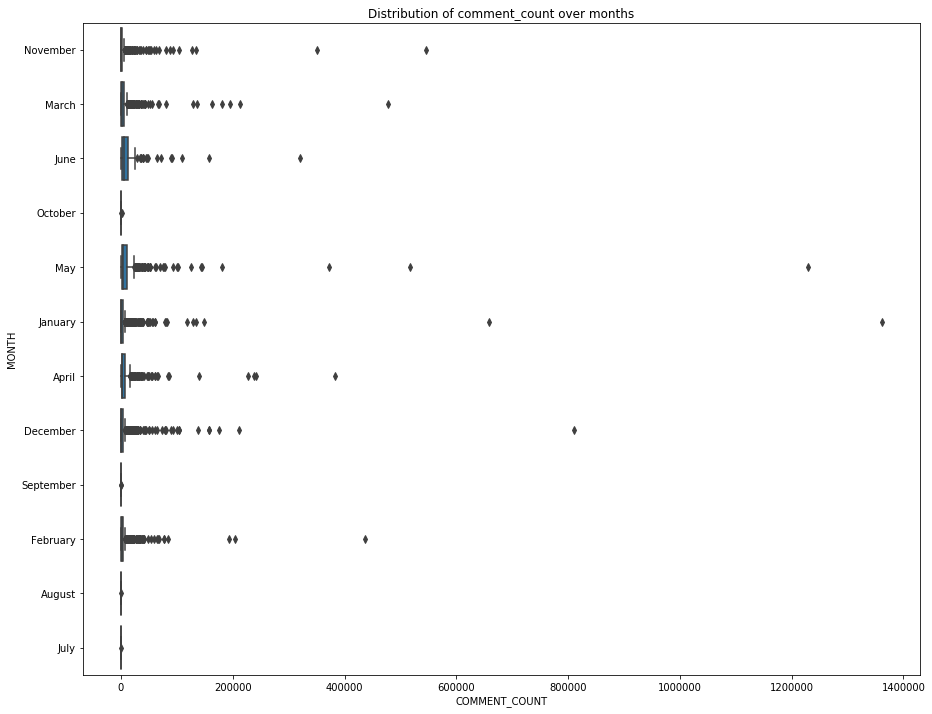

In [140]:


box_plot([15,12], df_videos,'comment_count', 'month',  0, 
          'Distribution of comment_count over months', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of comments count over months. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.

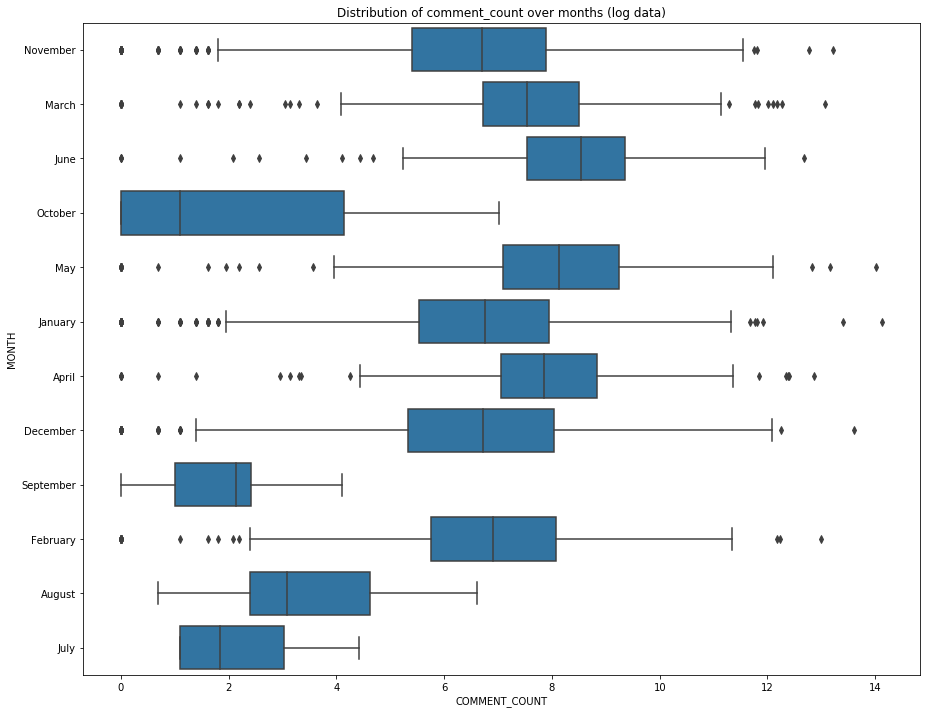

In [141]:

box_plot([15,12], df_videos,'comment_count', 'month',  0, 
          'Distribution of comment_count over months (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value for some months. Also, we can see that some of the data is negative skewed ans some of the data is positive skewed.

Let us now go ahead and check the density spread of views data over days

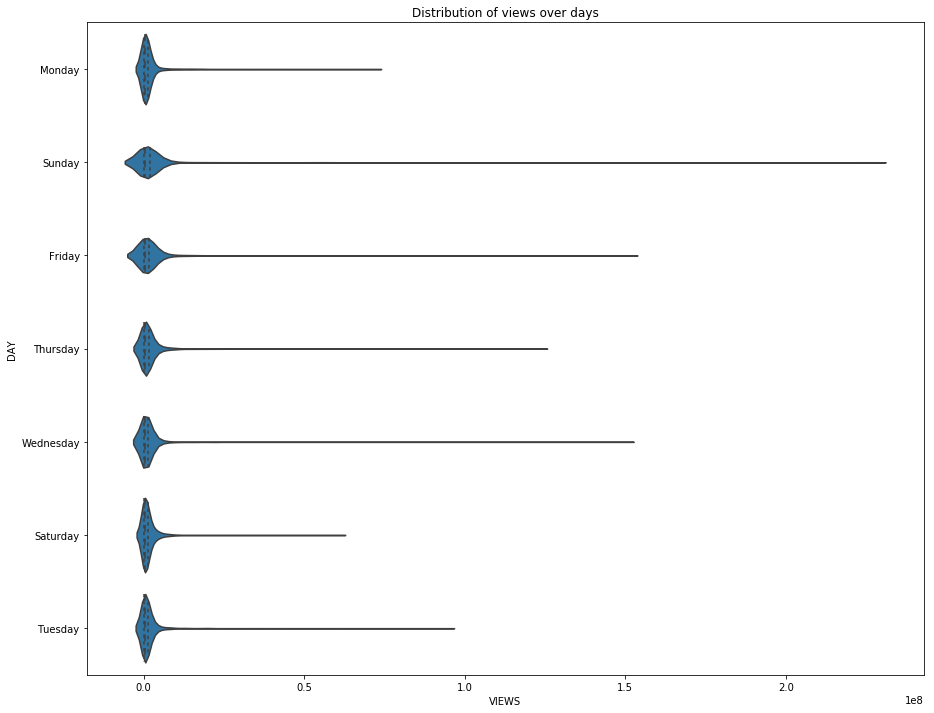

In [142]:
violin_plot([15,12], df_videos,'views', 'day',  0, 
          'Distribution of views over days', 'horizontal')


**Comment:**

The above plots helps us get an understanding of density dpread of data. Here we can see that monday saturday and tuesday show more density than the other days. Lets check how the data behaves when log transformation is applied on it.

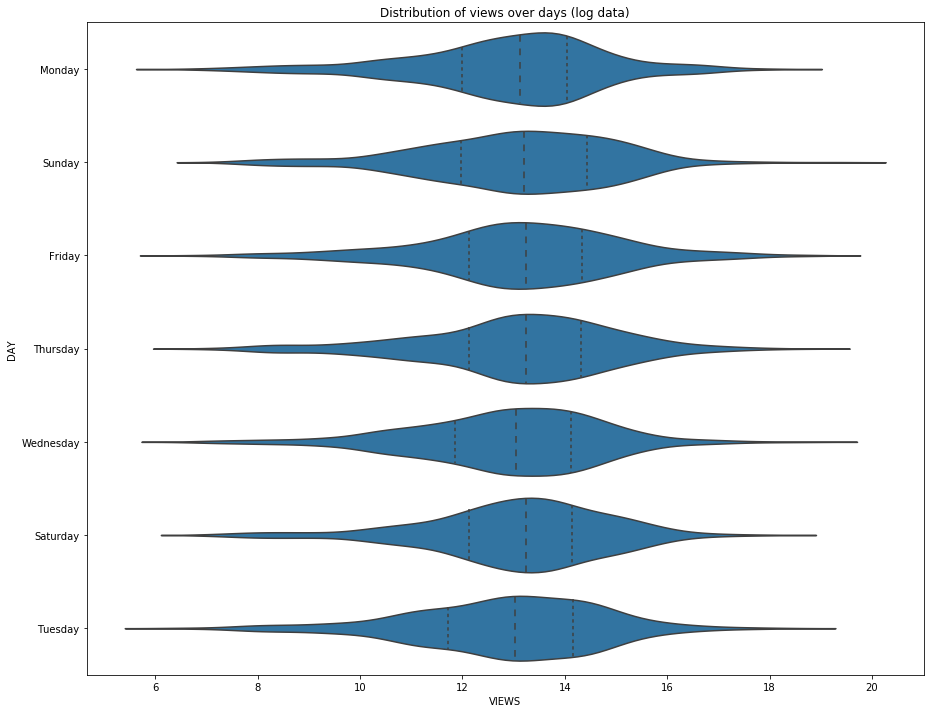

In [143]:

violin_plot([15,12], df_videos,'views', 'day',  0, 
          'Distribution of views over days (log data)', 'horizontal_log_data')


**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the days have same density of data spread.

Lets check the descriptive statistics of the data.

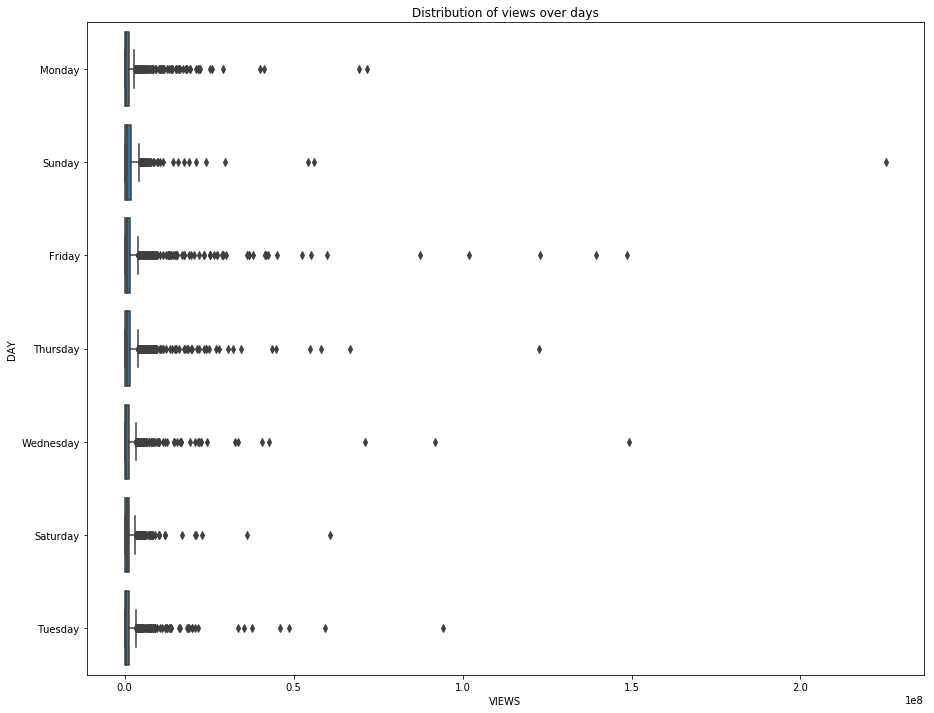

In [144]:


box_plot([15,12], df_videos,'views', 'day',  0, 
          'Distribution of views over days', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.


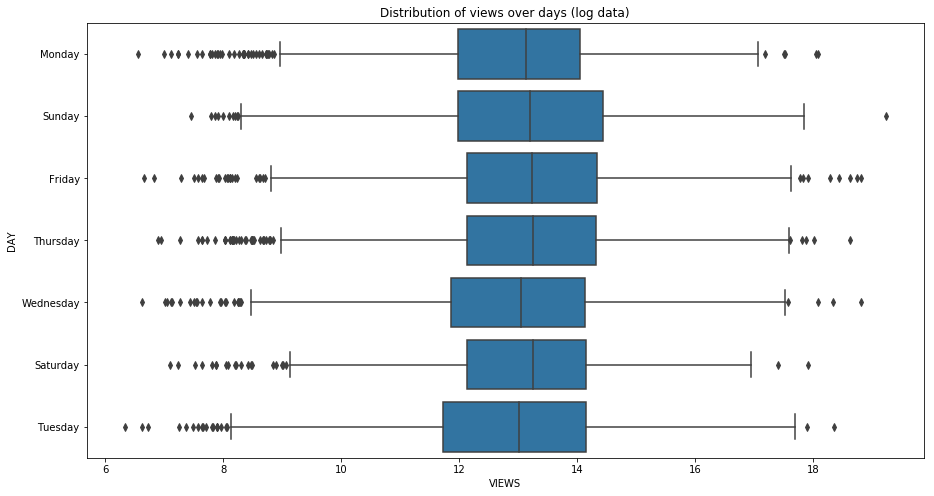

In [145]:

box_plot([15,8], df_videos,'views', 'day',  0, 
          'Distribution of views over days (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is not skewed.

Let us now go ahead and check the density spread of likes data over days

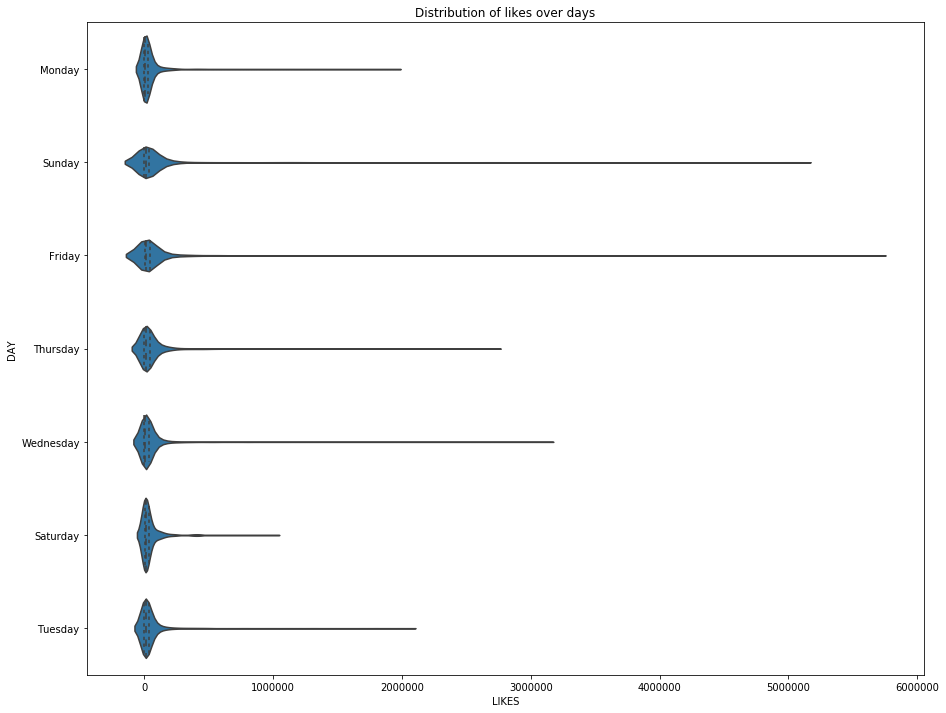

In [146]:
violin_plot([15,12], df_videos,'likes', 'day',  0, 
          'Distribution of likes over days', 'horizontal')


**Comment:**

The above plots helps us get an understanding of density dpread of data. Here we can see that monday saturday and tuesday show more density than the other days. Lets check how the data behaves when log transformation is applied on it.

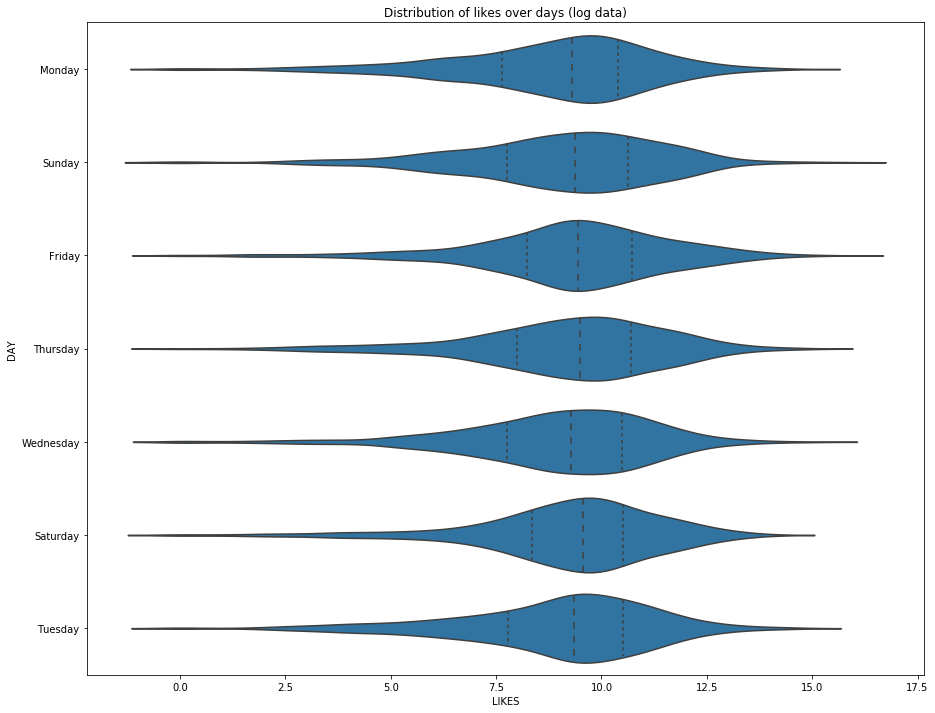

In [147]:

violin_plot([15,12], df_videos,'likes', 'day',  0, 
          'Distribution of likes over days (log data)', 'horizontal_log_data')


**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the days have same density of data spread.

Lets check the descriptive statistics of the data.


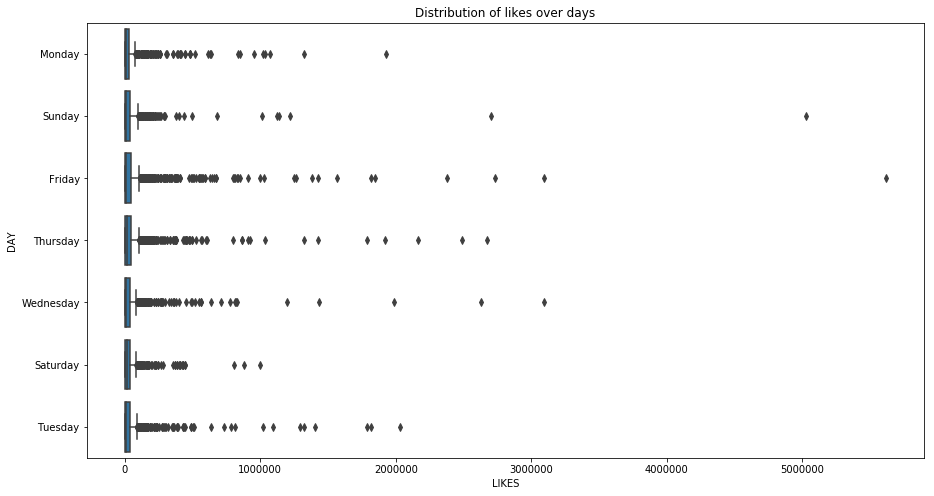

In [148]:


box_plot([15,8], df_videos,'likes', 'day',  0, 
          'Distribution of likes over days', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.


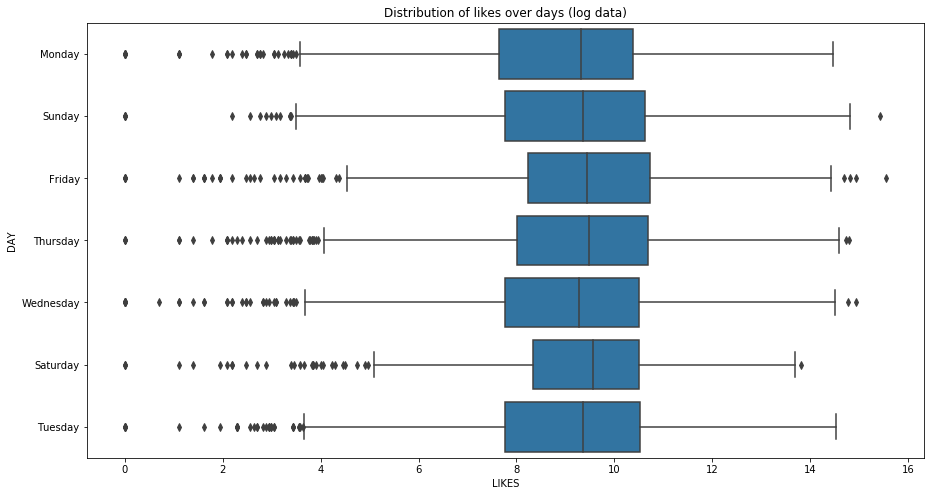

In [149]:

box_plot([15,8], df_videos,'likes', 'day',  0, 
          'Distribution of likes over days (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has many outliers before min value as well as some outliers after max values. Also, we can see that most of the data is negative skewed.

Let us now go ahead and check the density spread of dislikes data over days

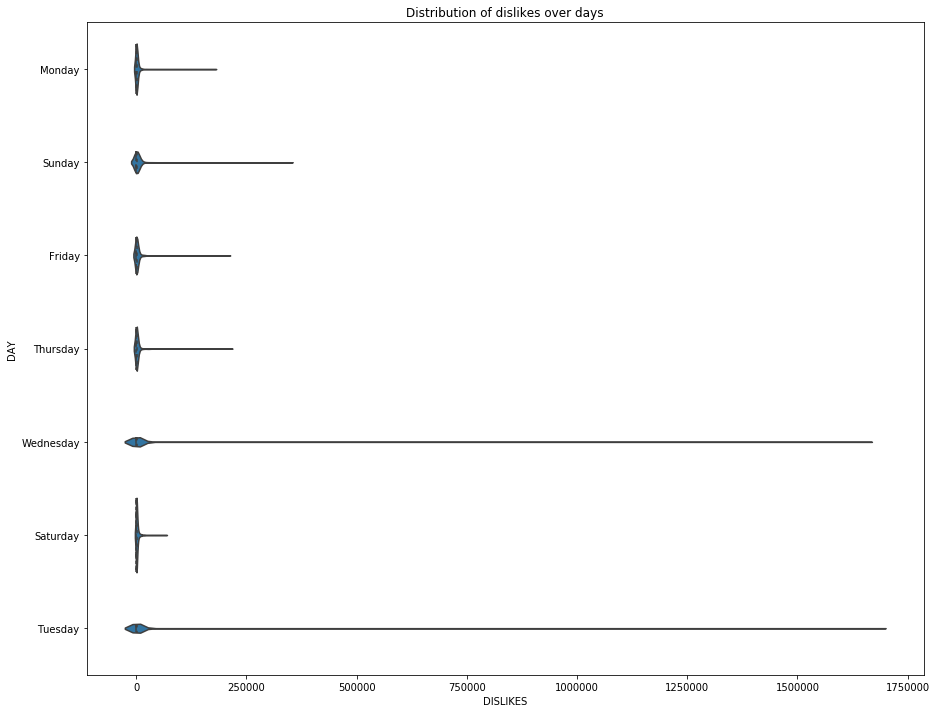

In [150]:
violin_plot([15,12], df_videos,'dislikes', 'day',  0, 
          'Distribution of dislikes over days', 'horizontal')


**Comment:**

The above plots helps us get an understanding of density dpread of data. But as the data has large scale issue we don't have a clear picture of the density. Lets try to see if we can get a better picture if log transformed data is applied.

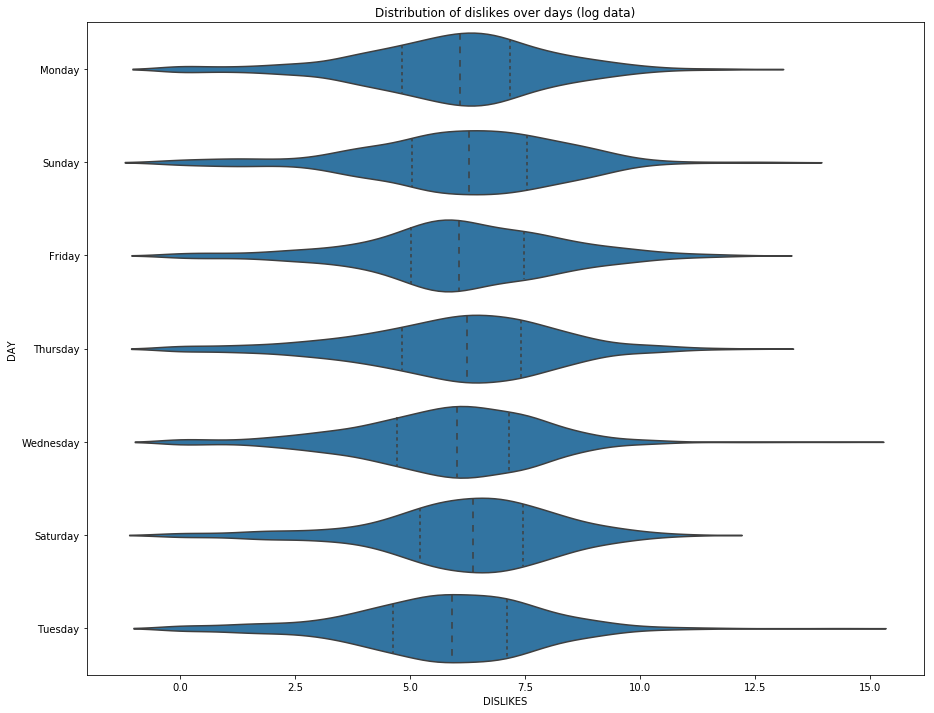

In [151]:

violin_plot([15,12], df_videos,'dislikes', 'day',  0, 
          'Distribution of dislikes over days (log data)', 'horizontal_log_data')


**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that monday, saturday and tuesday have more density than the others but without much difference.

Lets check the descriptive statistics of the data.

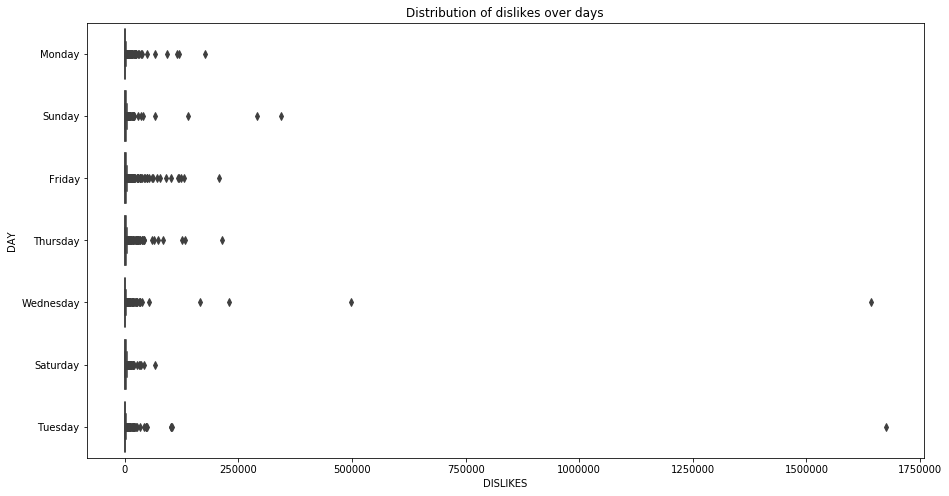

In [152]:


box_plot([15,8], df_videos,'dislikes', 'day',  0, 
          'Distribution of dislikes over days', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.


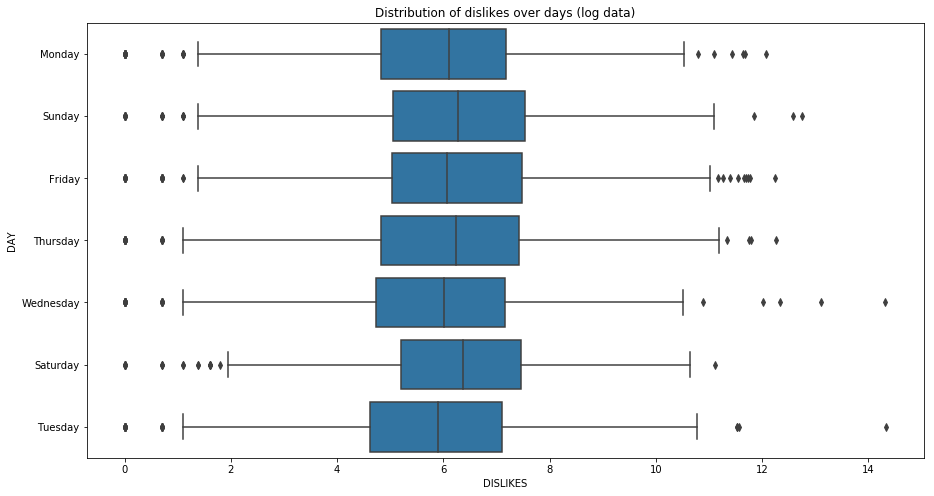

In [153]:

box_plot([15,8], df_videos,'dislikes', 'day',  0, 
          'Distribution of dislikes over days (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is positive skewed.

Let us now go ahead and check the density spread of comments count data over days

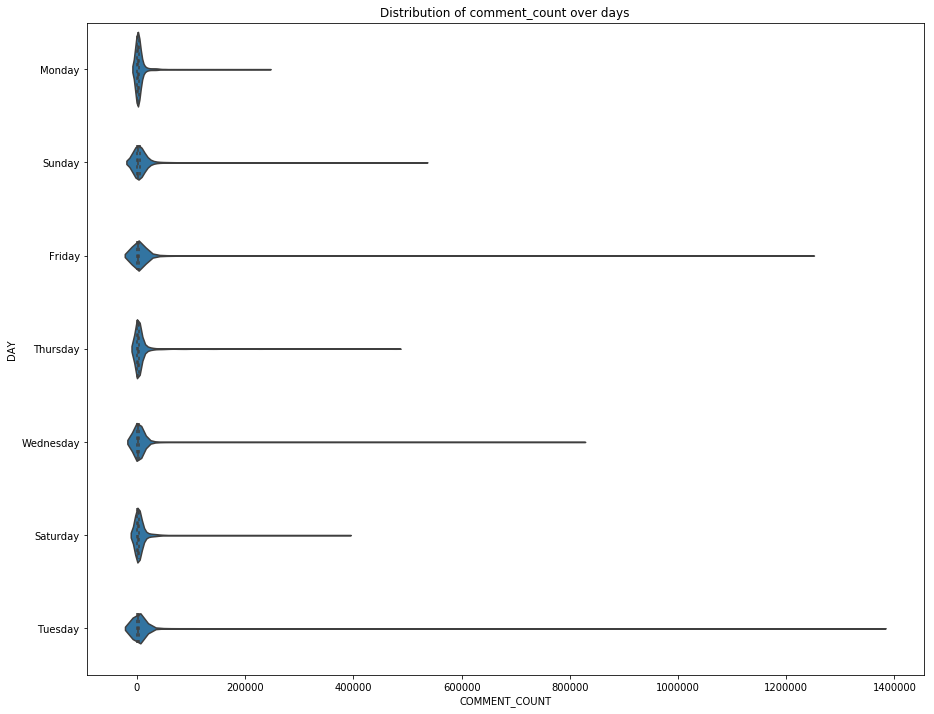

In [154]:
violin_plot([15,12], df_videos,'comment_count', 'day',  0, 
          'Distribution of comment_count over days', 'horizontal')


**Comment:**

The above plots helps us get an understanding of density dpread of data. Here we can see that monday shows more density than the other days. Lets check how the data behaves when log transformation is applied on it.

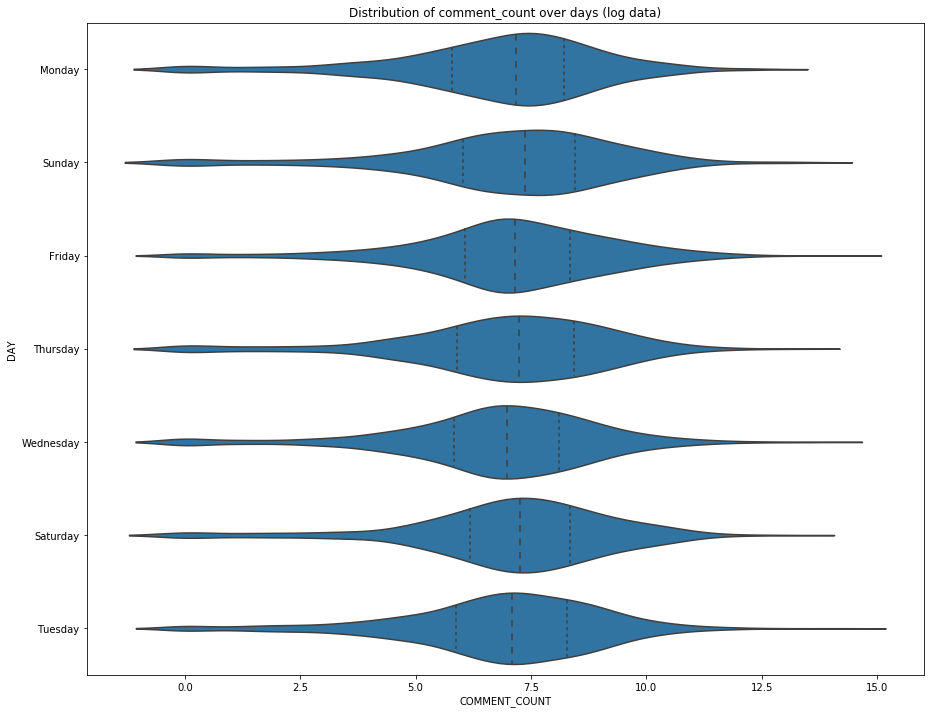

In [155]:

violin_plot([15,12], df_videos,'comment_count', 'day',  0, 
          'Distribution of comment_count over days (log data)', 'horizontal_log_data')


**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the days have almost same density of data spread.

Lets check the descriptive statistics of the data.


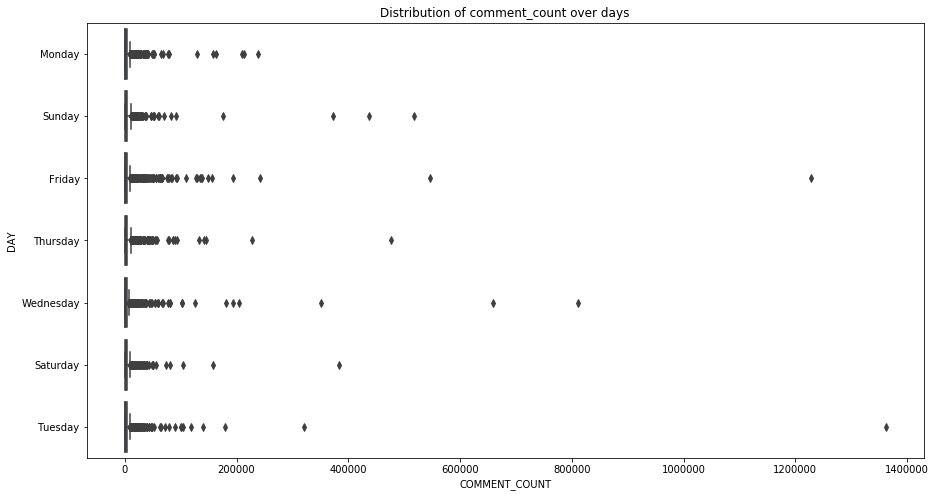

In [156]:


box_plot([15,8], df_videos,'comment_count', 'day',  0, 
          'Distribution of comment_count over days', 'horizontal')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.

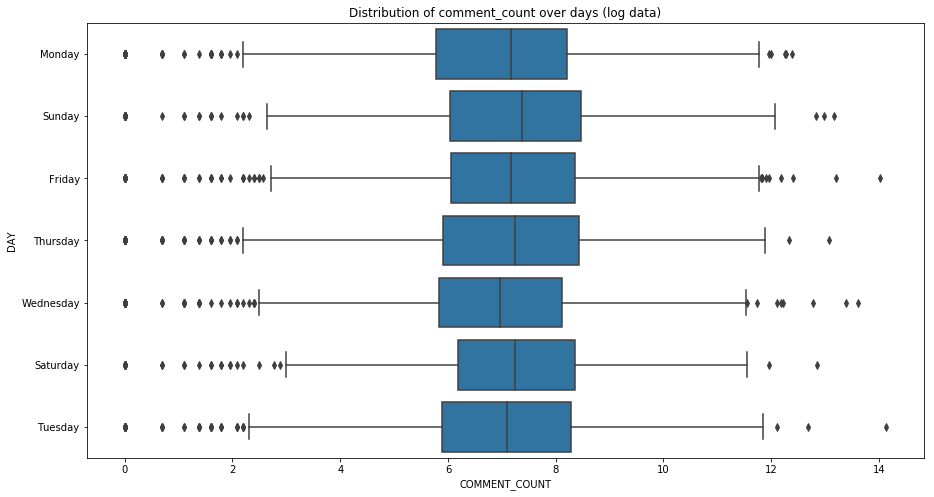

In [157]:

box_plot([15,8], df_videos,'comment_count', 'day',  0, 
          'Distribution of comment_count over days (log data)', 'horizontal_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is positive skewed.

Let us now go ahead and check the density spread of views data over hours

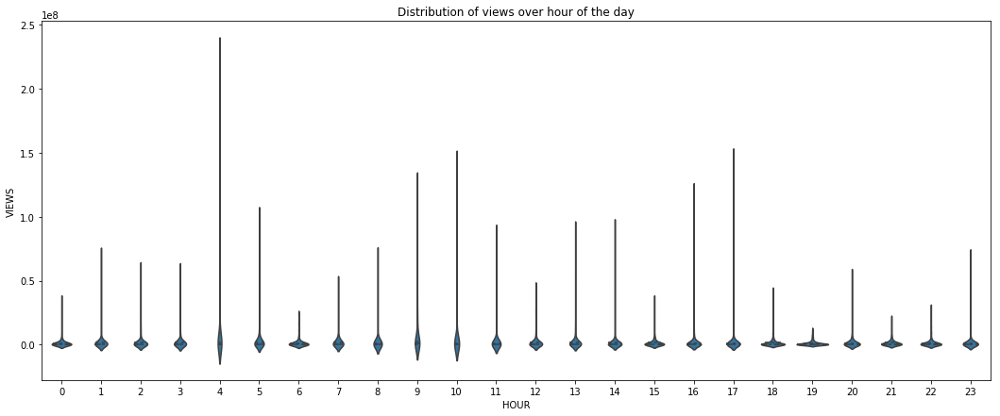

In [158]:
violin_plot([18,7], df_videos,'views', 'hour',  0, 
          'Distribution of views over hour of the day', 'vertical')


**Comment:**

The above plots helps us get an understanding of density spread of data. Here the plot is not very clear but the plots suggests that the density of data at 19 military hour is more than the rest of the hours. Lets see how the data performs with log transformation.


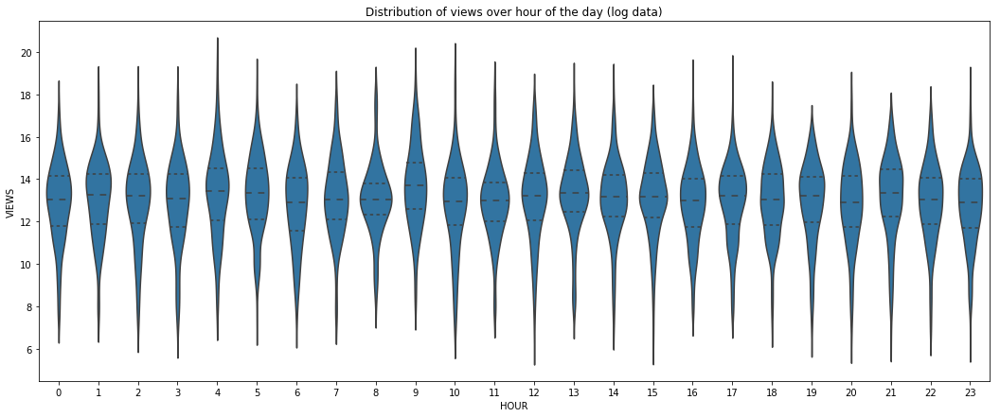

In [159]:
violin_plot([18,7], df_videos,'views', 'hour',  0, 
          'Distribution of views over hour of the day (log data)', 'vertical_log_data')



**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the hours have similar density of data spread.

Lets check the descriptive statistics of the data.

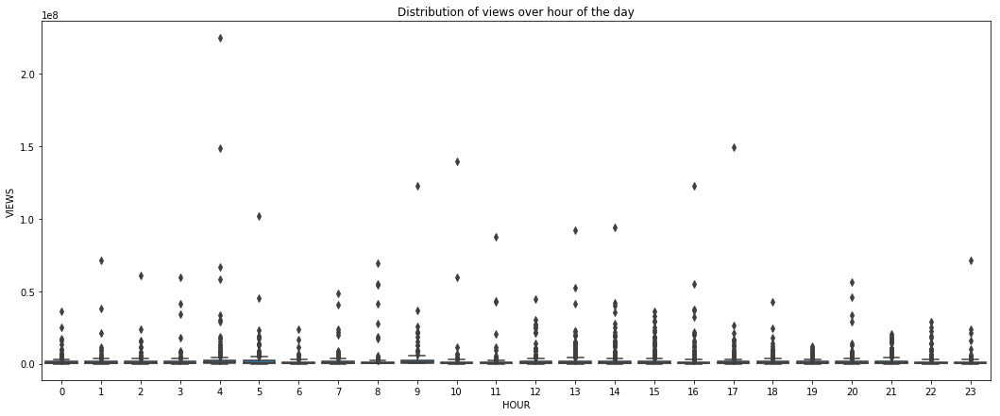

In [160]:
box_plot([18,7], df_videos,'views', 'hour',  0, 
          'Distribution of views over hour of the day', 'vertical')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.

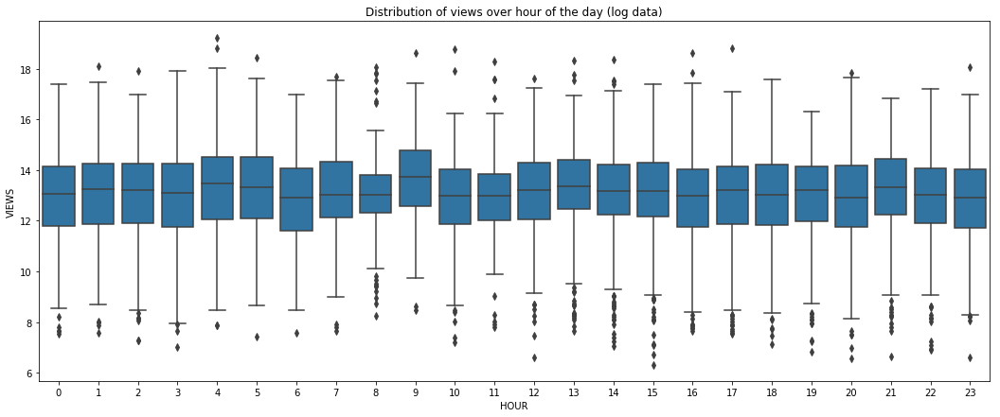

In [161]:
box_plot([18,7], df_videos,'views', 'hour',  0, 
          'Distribution of views over hour of the day (log data)', 'vertical_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is positive skewed.

Let us now go ahead and check the density spread of likes data over hours

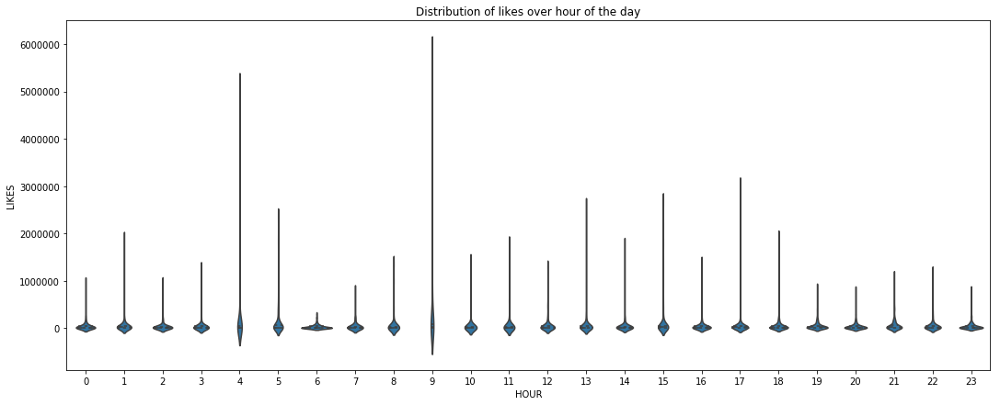

In [162]:
violin_plot([18,7], df_videos,'likes', 'hour',  0, 
          'Distribution of likes over hour of the day', 'vertical')


**Comment:**

The above plots helps us get an understanding of density spread of data. Here the plot is not very clear but the plots suggests that the density of data at 0 and 23 military hour is more than the rest of the hours. Lets see how the data performs with log transformation.


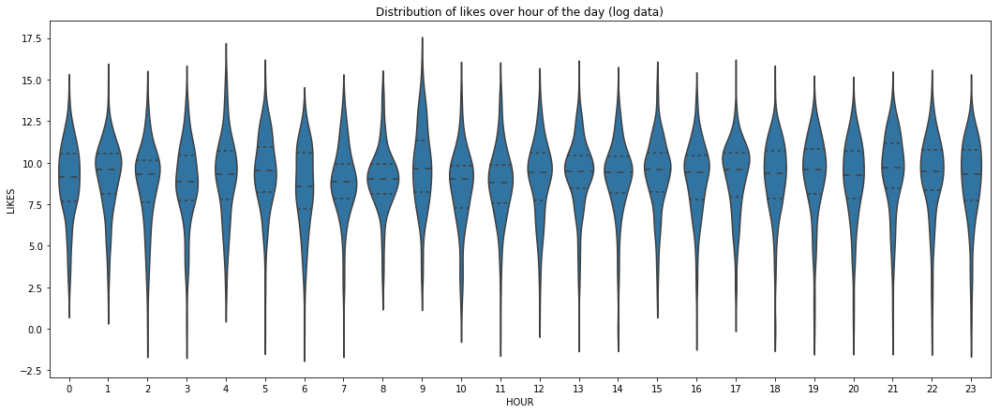

In [163]:
violin_plot([18,7], df_videos,'likes', 'hour',  0, 
          'Distribution of likes over hour of the day (log data)', 'vertical_log_data')


**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the hours have similar density of data spread. Also the data shows relatively high varience.

Lets check the descriptive statistics of the data.

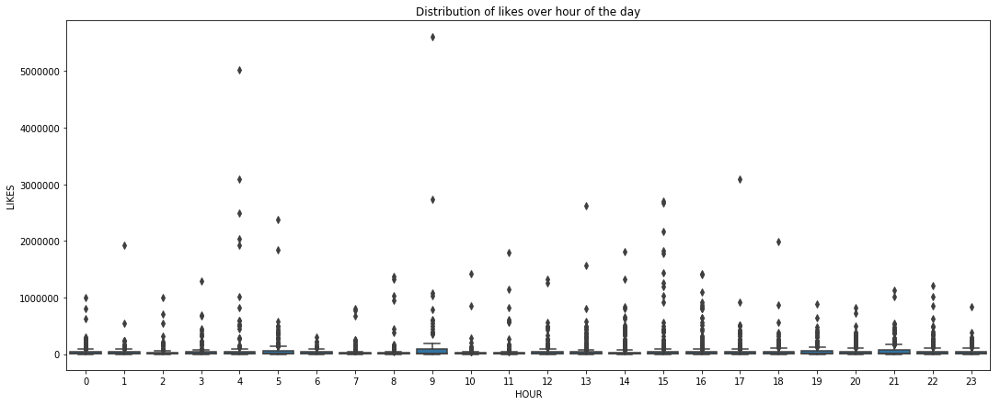

In [164]:
box_plot([18,7], df_videos,'likes', 'hour',  0, 
          'Distribution of likes over hour of the day', 'vertical')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.

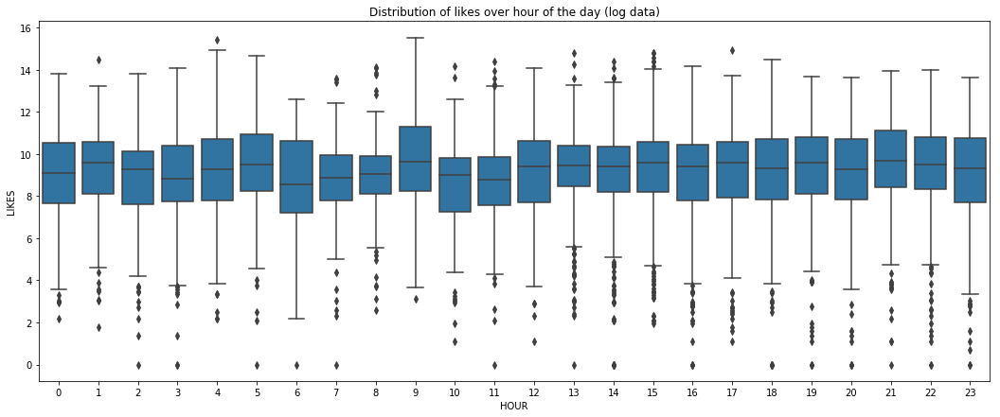

In [165]:
box_plot([18,7], df_videos,'likes', 'hour',  0, 
          'Distribution of likes over hour of the day (log data)', 'vertical_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is positive skewed.

Let us now go ahead and check the density spread of dislikes data over hours

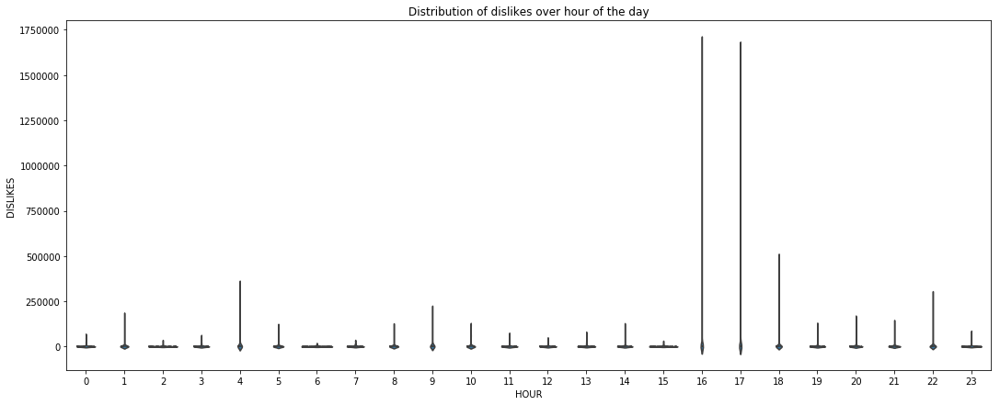

In [166]:
violin_plot([18,7], df_videos,'dislikes', 'hour',  0, 
          'Distribution of dislikes over hour of the day', 'vertical')


**Comment:**

The above plots helps us get an understanding of density spread of data. Here the plot is not very clear but the plots suggests that the density of data at 2,6,15 military hour is more than the rest of the hours. Lets see how the data performs with log transformation.



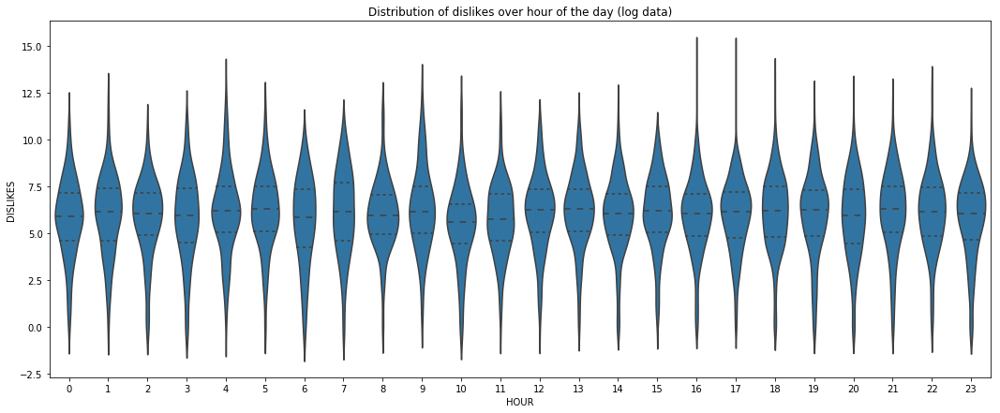

In [167]:
violin_plot([18,7], df_videos,'dislikes', 'hour',  0, 
          'Distribution of dislikes over hour of the day (log data)','vertical_log_data')


**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the hours have similar density of data spread.  Also the data shows relatively high varience.

Lets check the descriptive statistics of the data.


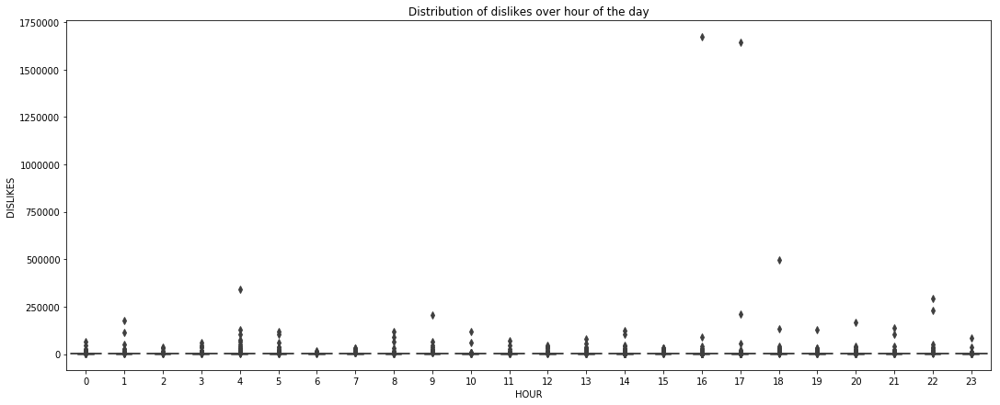

In [168]:
box_plot([18,7], df_videos,'dislikes', 'hour',  0, 
          'Distribution of dislikes over hour of the day', 'vertical')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.


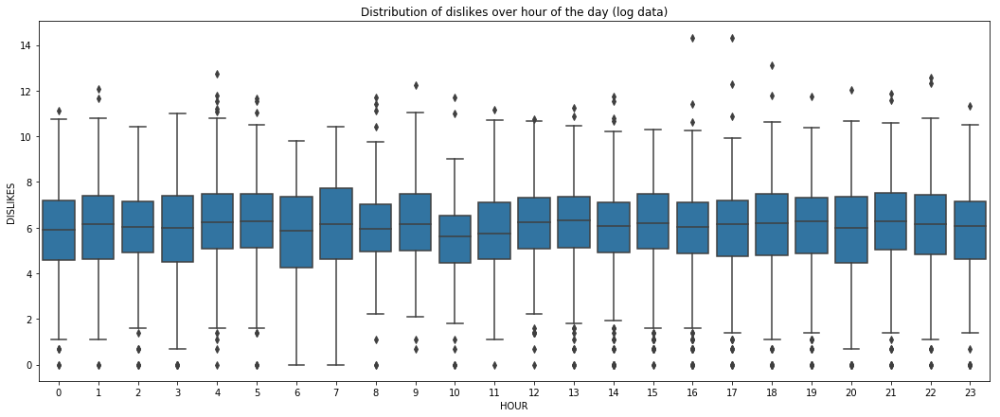

In [169]:
box_plot([18,7], df_videos,'dislikes', 'hour',  0, 
          'Distribution of dislikes over hour of the day (log data)', 'vertical_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is positive skewed.

Let us now go ahead and check the density spread of comments count data over hours

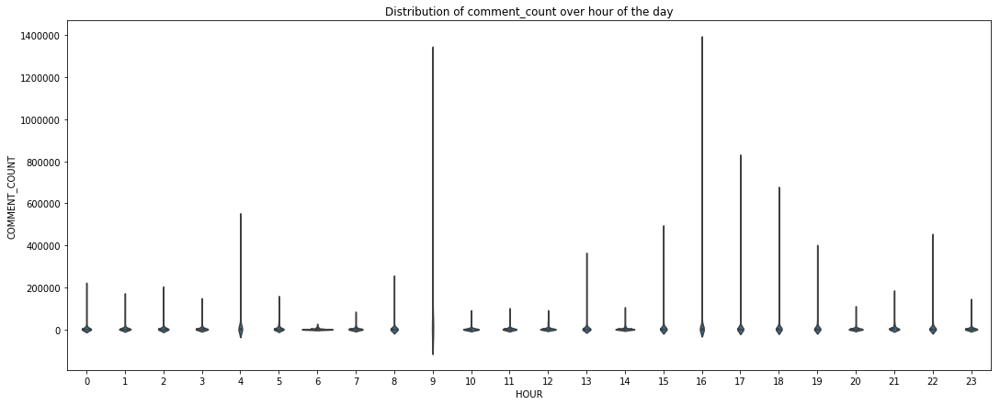

In [170]:
violin_plot([18,7], df_videos,'comment_count', 'hour',  0, 
          'Distribution of comment_count over hour of the day', 'vertical')


**Comment:**

The above plots helps us get an understanding of density spread of data. Here the plot is not very clear but the plots suggests that the density of data at 6 military hour is more than the rest of the hours. Lets see how the data performs with log transformation.


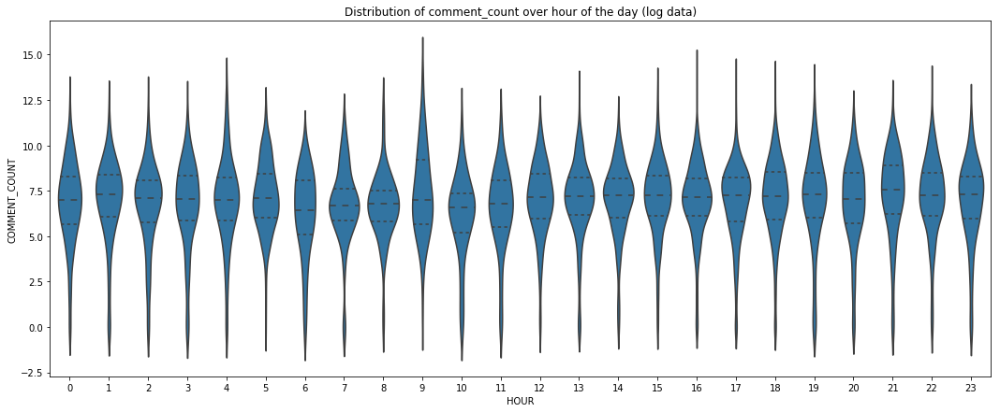

In [171]:
violin_plot([18,7], df_videos,'comment_count', 'hour',  0, 
          'Distribution of comment_count over hour of the day (log data)', 'vertical_log_data')



**Comment:**

The above plot shows us the log transformed data. Here we can see that it gives us quite different look of the density spread of data when compared to data without transformation. It suggests that all the hours have similar density of data spread.  Also the data shows relatively high varience.

Lets check the descriptive statistics of the data.


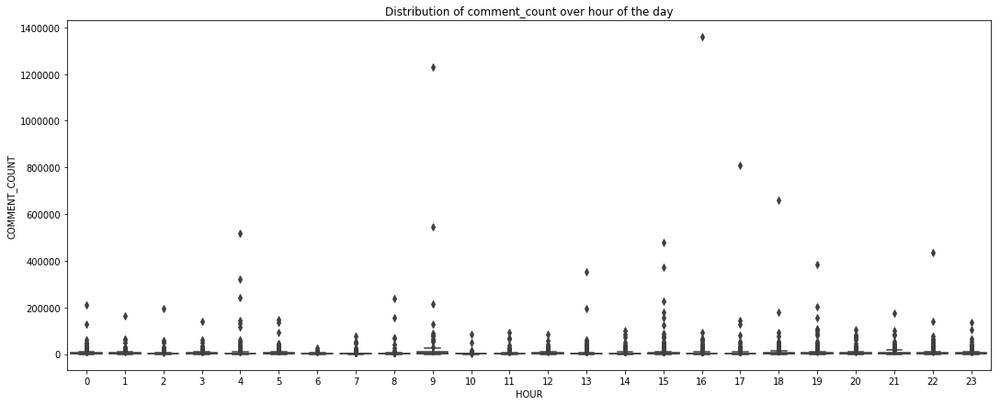

In [172]:
box_plot([18,7], df_videos,'comment_count', 'hour',  0, 
          'Distribution of comment_count over hour of the day', 'vertical')


**Comment:**

The above plot should help us get a understanding of descriptive statistics of data. But as the data has large scale issue we don't have a clear picture of the statistics. Lets try to see if we can get a better picture if log transformed data is applied.


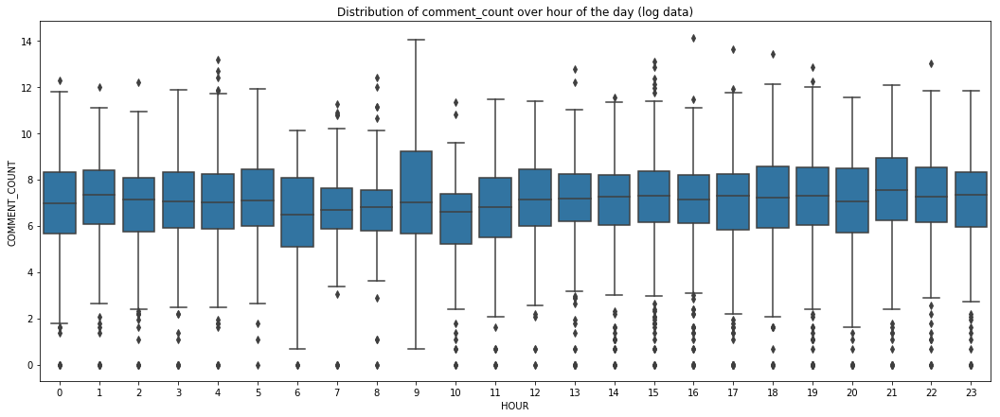

In [173]:
box_plot([18,7], df_videos,'comment_count', 'hour',  0, 
          'Distribution of comment_count over hour of the day (log data)', 'vertical_log_data')


**Comment:**

From the above plot we can see that we have complete picture of the data which shows us descriptive statistics of desired data. We can see that the data has outliers before min value as well as after max value. Also, we can see that some of the data is negative skewed and some of the data is positive skewed.

Let us now go ahead and check the trend lines of variables over months, days and overs

In [174]:
#funtion for line plot
def line_plot(figsize, data, x, y, angle, title, typee):
    if typee == 'normal':
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot
        sns.lineplot(y = y, x = x, data = data)
        #set axis labels and title
        plt.xticks(rotation=angle)
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'normal_log':
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot
        y1= np.log(data[y]+1)
        sns.lineplot(y = y1, x = x, data = data)
        #set axis labels and title
        plt.xticks(rotation=angle)
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    else:
        print('please check typee')

    

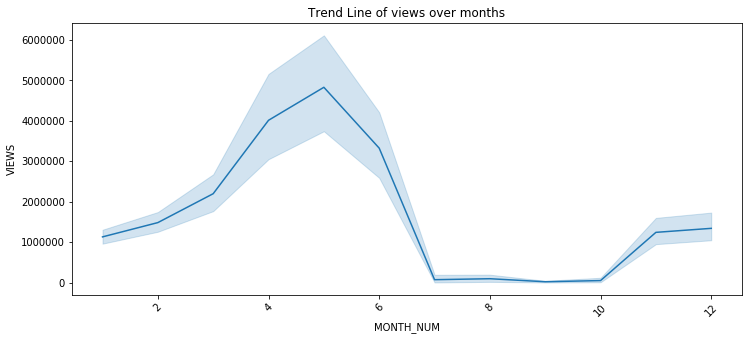

In [175]:
line_plot([12, 5], df_videos, 'month_num', 'views', 45,
         'Trend Line of views over months', 'normal')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the views are increasing in summer then drop completely from june to october and again tend to increase in winter.

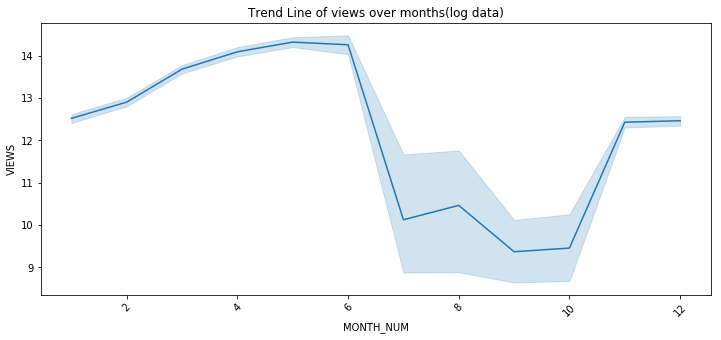

In [176]:

line_plot([12, 5], df_videos, 'month_num', 'views', 45,
         'Trend Line of views over months(log data)', 'normal_log')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the views are increasing in summer then drop and tend to show fluctuations from june to october and again tend to increase in winter

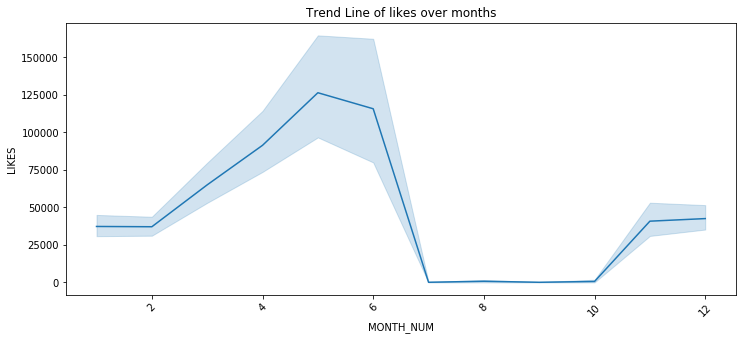

In [177]:
line_plot([12, 5], df_videos, 'month_num', 'likes', 45,
         'Trend Line of likes over months', 'normal')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the likes are increasing in summer then drop completely from june to october and again tend to increase in winter.


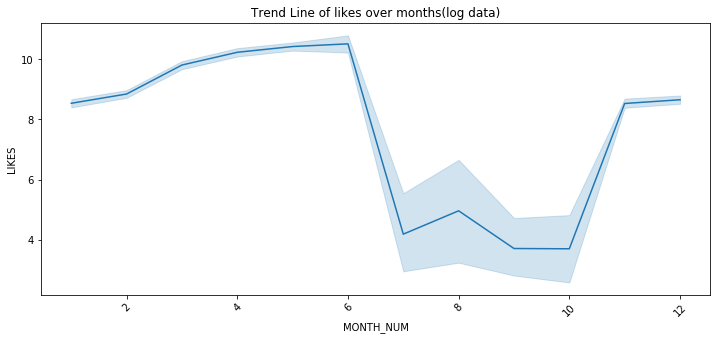

In [178]:

line_plot([12, 5], df_videos, 'month_num', 'likes', 45,
         'Trend Line of likes over months(log data)', 'normal_log')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the likes are increasing in summer then drop and tend to show fluctuations from june to october and again tend to increase in winter


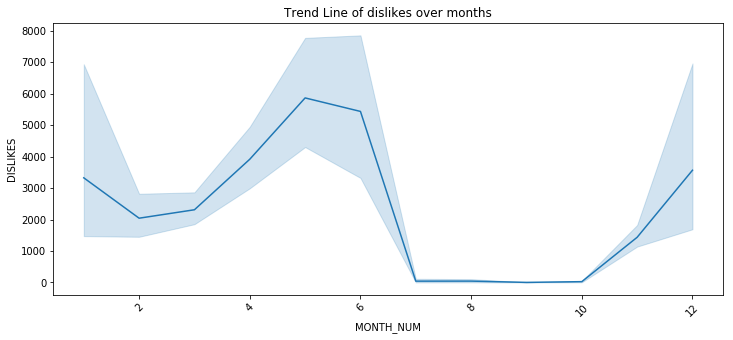

In [179]:
line_plot([12, 5], df_videos, 'month_num', 'dislikes', 45,
         'Trend Line of dislikes over months', 'normal')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the dislikes are increasing in summer then drop completely from june to october and again tend to increase in winter.


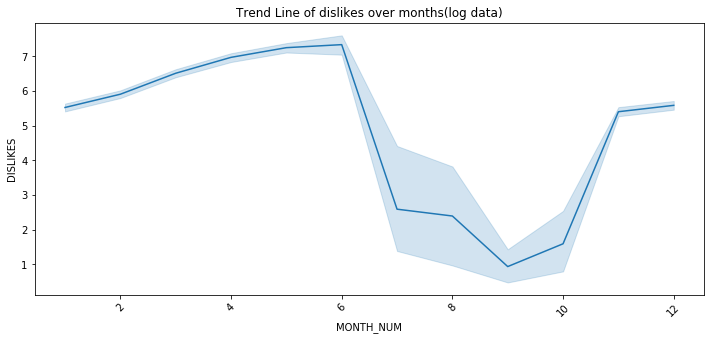

In [180]:

line_plot([12, 5], df_videos, 'month_num', 'dislikes', 45,
         'Trend Line of dislikes over months(log data)', 'normal_log')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the dislikes are increasing in summer then drop and tend to show fluctuations from june to october and again tend to increase in winter

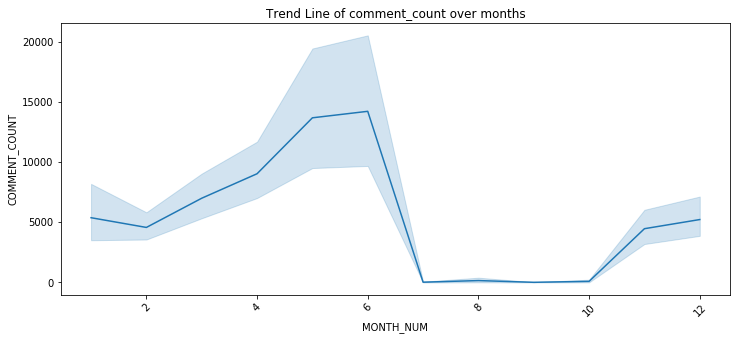

In [181]:
line_plot([12, 5], df_videos, 'month_num', 'comment_count', 45,
         'Trend Line of comment_count over months', 'normal')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the comments count are increasing in summer then drop completely from june to october and again tend to increase in winter.


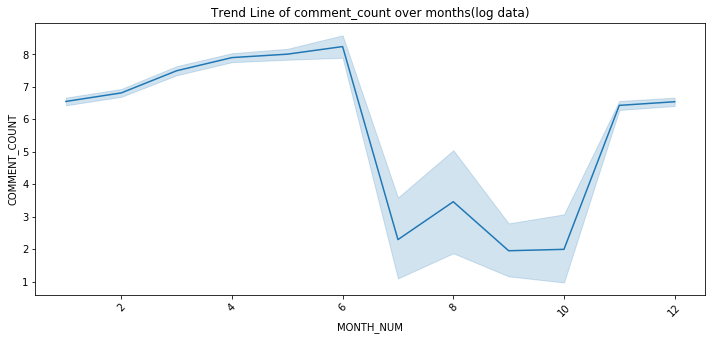

In [182]:

line_plot([12, 5], df_videos, 'month_num', 'comment_count', 45,
         'Trend Line of comment_count over months(log data)', 'normal_log')

**Comment:**

Line plots privide us with trend line of how a variable is moving(increasing or decreasing) according to time or over the period of time. Here we can see that the comments count are increasing in summer then drop and tend to show fluctuations from june to october and again tend to increase in winter


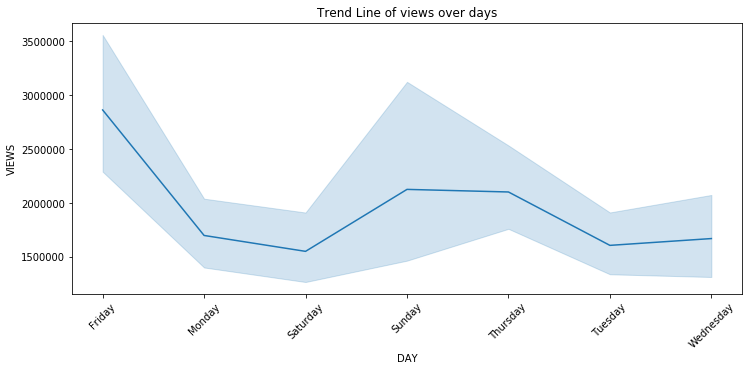

In [183]:
line_plot([12, 5], df_videos, 'day', 'views', 45,
         'Trend Line of views over days', 'normal')

**Comment:**

The above plot shows us the trend like of views according to days. Lets check the trend line for log data

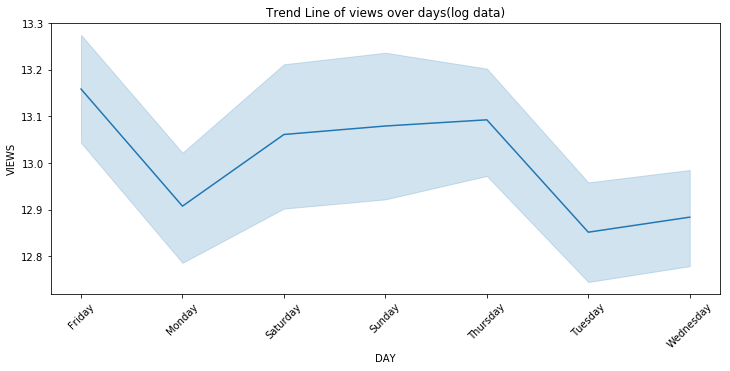

In [184]:


line_plot([12, 5], df_videos, 'day', 'views', 45,
         'Trend Line of views over days(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line for log transformed data. The trend line is similar to that of trend line plot without transformation

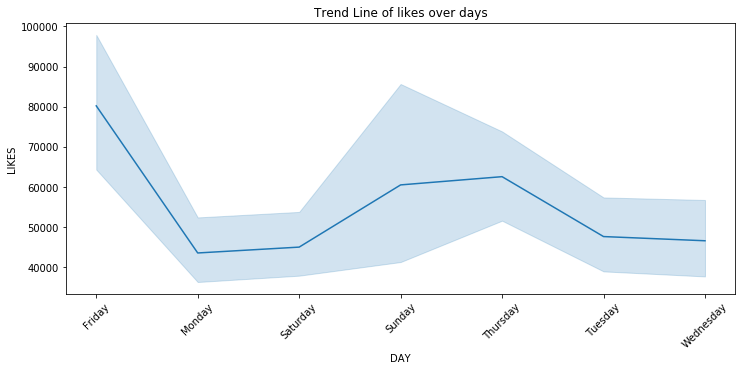

In [185]:

line_plot([12, 5], df_videos, 'day', 'likes', 45,
         'Trend Line of likes over days', 'normal')


**Comment:**

The above plot shows us the trend like of likes according to days. Lets check the trend line for log data

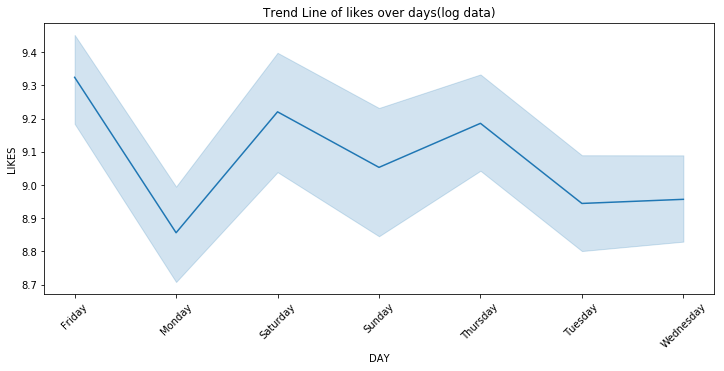

In [186]:

line_plot([12, 5], df_videos, 'day', 'likes', 45,
         'Trend Line of likes over days(log data)', 'normal_log')



**Comment:**

The above plot shows us the trend line for log transformed data. The trend line is little different to that of trend line plot without transformation


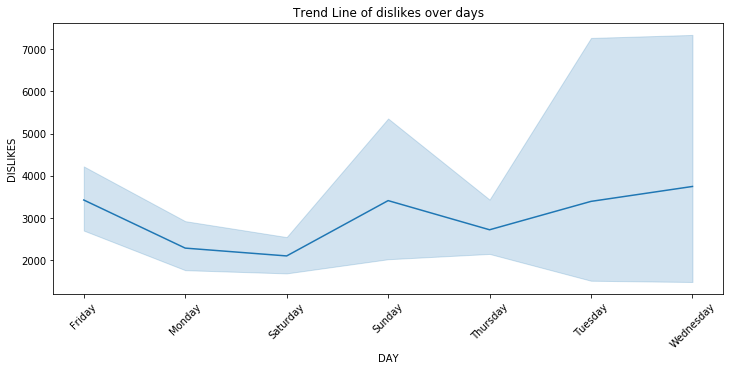

In [187]:

line_plot([12, 5], df_videos, 'day', 'dislikes', 45,
         'Trend Line of dislikes over days', 'normal')



**Comment:**

The above plot shows us the trend dislikes of views according to days. Lets check the trend like for log data


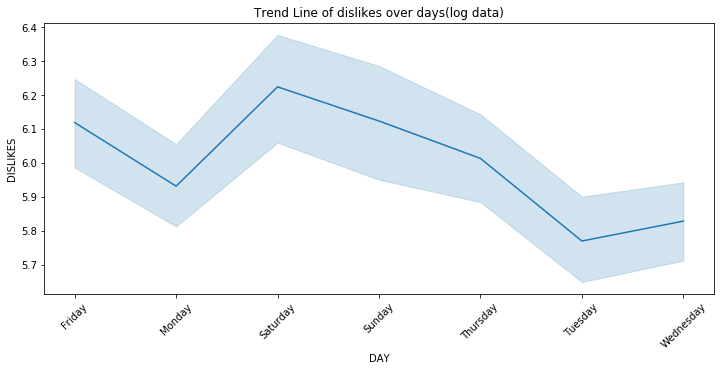

In [188]:

line_plot([12, 5], df_videos, 'day', 'dislikes', 45,
         'Trend Line of dislikes over days(log data)', 'normal_log')



**Comment:**

The above plot shows us the trend line for log transformed data. The trend line is very different to that of trend line plot without transformation. 


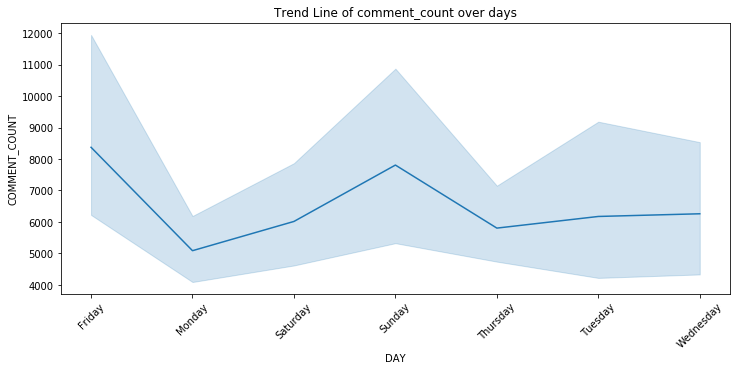

In [189]:

line_plot([12, 5], df_videos, 'day', 'comment_count', 45,
         'Trend Line of comment_count over days', 'normal')


**Comment:**

The above plot shows us the trend like of comment count according to days. Lets check the trend line for log data


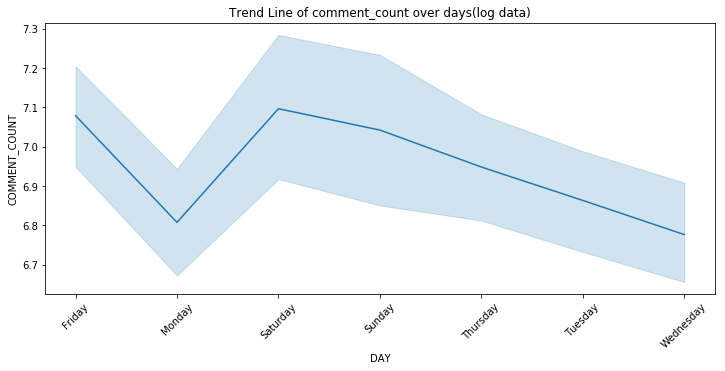

In [190]:


line_plot([12, 5], df_videos, 'day', 'comment_count', 45,
         'Trend Line of comment_count over days(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line for log transformed data. The trend line is very different to that of trend line plot without transformation


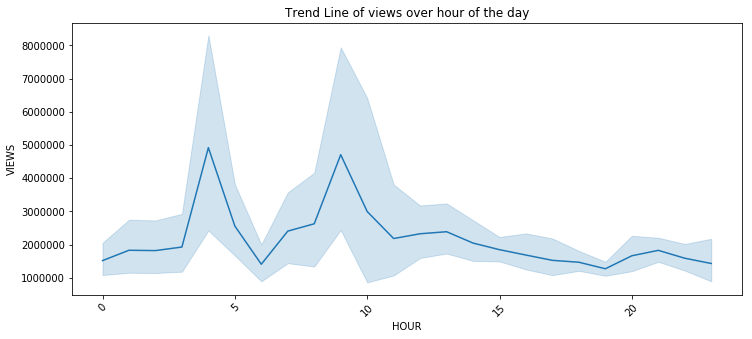

In [191]:
line_plot([12, 5], df_videos, 'hour', 'views', 45,
         'Trend Line of views over hour of the day', 'normal')


**Comment:**

The above plot shows us the trend like of views according to hours of day. Lets check the trend line for log data


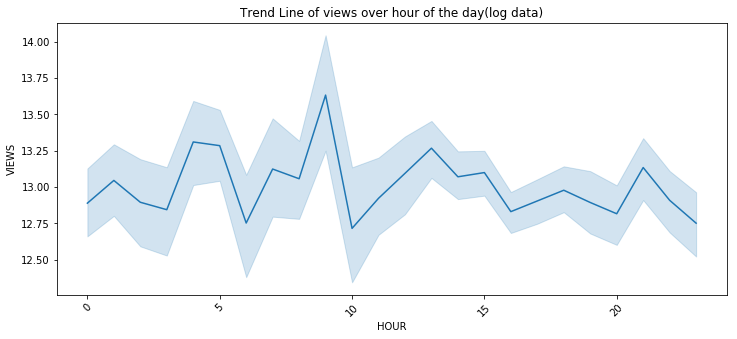

In [192]:

line_plot([12, 5], df_videos, 'hour', 'views', 45,
         'Trend Line of views over hour of the day(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line for log transformed data. Here the trend line shows much more fluctuations than the plot without transformation


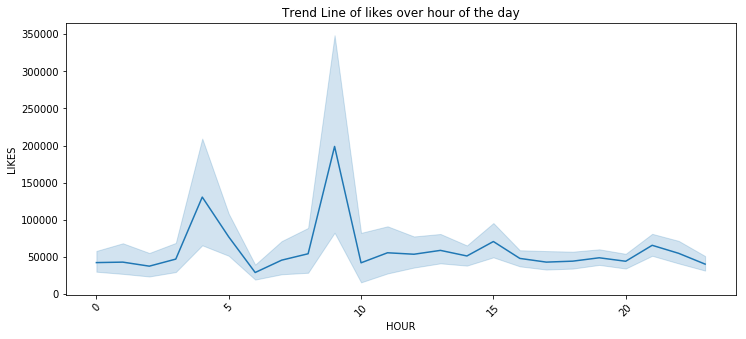

In [193]:

line_plot([12, 5], df_videos, 'hour', 'likes', 45,
         'Trend Line of likes over hour of the day', 'normal')


**Comment:**

The above plot shows us the trend line of likes according to hours of day. Lets check the trend line for log data


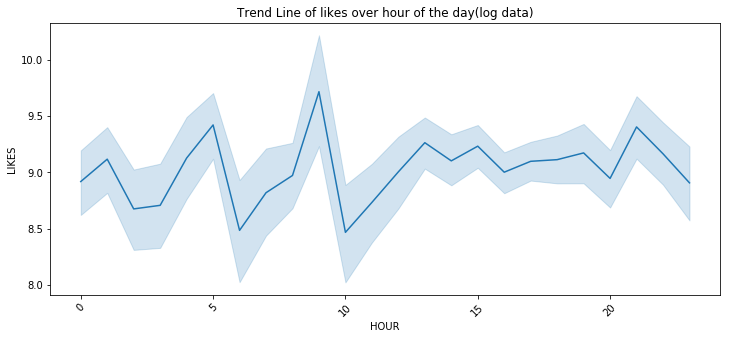

In [194]:

line_plot([12, 5], df_videos, 'hour', 'likes', 45,
         'Trend Line of likes over hour of the day(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line for log transformed data. Here the trend line shows much more fluctuations than the plot without transformation


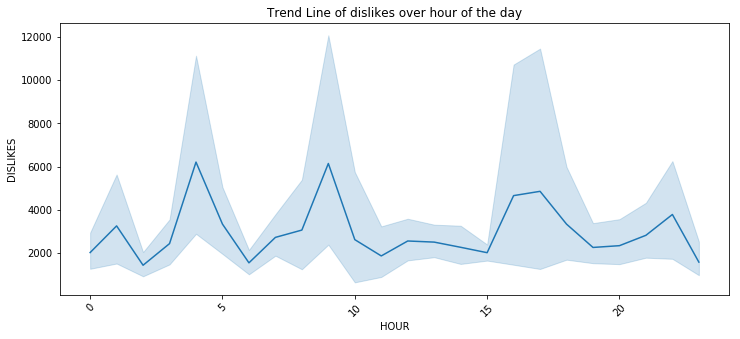

In [195]:

line_plot([12, 5], df_videos, 'hour', 'dislikes', 45,
         'Trend Line of dislikes over hour of the day', 'normal')


**Comment:**

The above plot shows us the trend line of dislikes according to hours of day. Lets check the trend line for log data


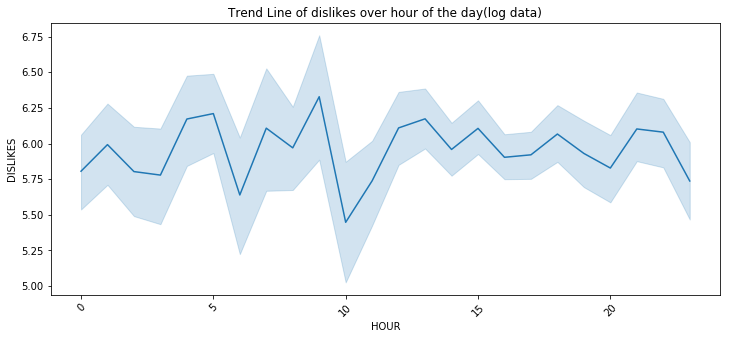

In [196]:

line_plot([12, 5], df_videos, 'hour', 'dislikes', 45,
         'Trend Line of dislikes over hour of the day(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line for log transformed data. Here the trend line shows much more fluctuations than the plot without transformation


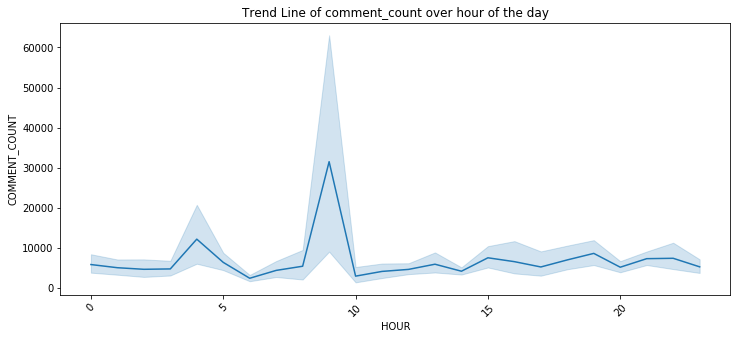

In [197]:

line_plot([12, 5], df_videos, 'hour', 'comment_count', 45,
         'Trend Line of comment_count over hour of the day', 'normal')

**Comment:**

The above plot shows us the trend line of comments count according to hours of day. Lets check the trend line for log data


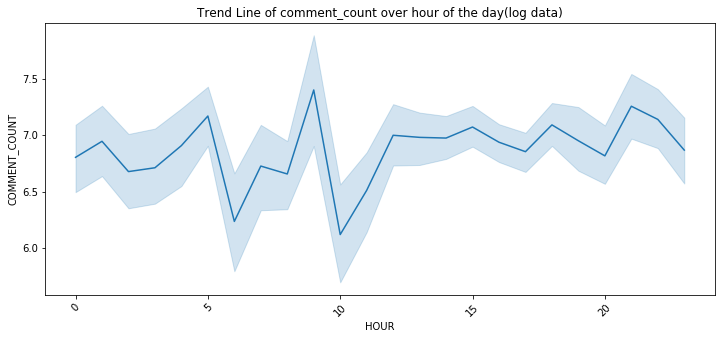

In [198]:


line_plot([12, 5], df_videos, 'hour', 'comment_count', 45,
         'Trend Line of comment_count over hour of the day(log data)', 'normal_log')

**Comment:**

The above plot shows us the trend line for log transformed data. Here the trend line shows much more fluctuations than the plot without transformation


**Multivariate exploration of data**

Multivariate exploration of data involves in analyzing more than 2 variables at a time be it quantitative variables or quanlitative variables. It helps us determine how multiple variables depend on each other.

Lets check how all the variables relate to each other with the help of heat map.


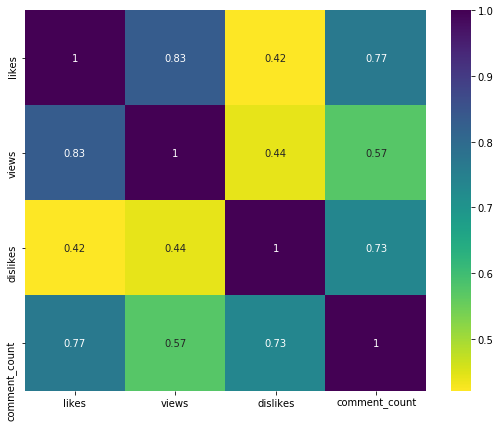

In [199]:
#figsize
plt.figure(figsize = [9,7])
#plot
sns.heatmap(df_videos[['likes','views','dislikes','comment_count']].corr(), annot = True,cmap = 'viridis_r');


**Comment:**

Heatmap gives us a quick overview of corelation between all the variables in a dataset. From the above plot we can see that the highest corelation is between views and likes whereas the lowest corelation is between likes and dislikes. 

Lets us go ahead and create subset dataframe which gives us information about all the trending videos published from top 3 categories and top 3 channels.

In [200]:
#top 3 categories dataframe
df_top3_cat = df_videos[df_videos['category_name'].isin(['Entertainment','Music','Howto & Style'])]

#top 3 channels dataframe
df_top3_chn = df_videos[df_videos['channel_title'].isin(['ESPN', 'TheEllenShow', 'The Tonight Show Starring Jimmy Fallon'])]


Lets write a function for a multivariate line plot

In [201]:
def multi_line(figsize, data, x, y, z, angle, title, typee):
    if typee == 'normal':
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot
        sns.lineplot(y = y, x = x, hue = z, data = data)
        #set axis labels and title
        plt.xticks(rotation=angle)
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'normal_log':
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot
        y1= np.log(data[y]+1)
        sns.lineplot(y = y1, x = x, hue = z, data = data)
        #set axis labels and title
        plt.xticks(rotation=angle)
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    else:
        print('please check typee')

Lets plot the trend lines of views, likes, dislikes and comments over top 3 categories and month, day, hour of the day using df_top3_cat.

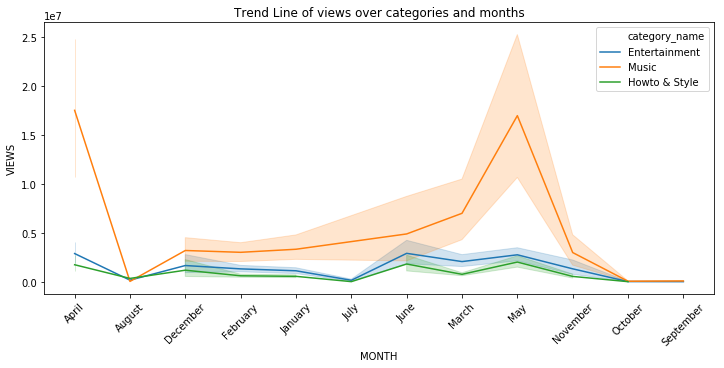

In [202]:
multi_line([12, 5], df_top3_cat, 'month', 'views', 'category_name', 45,
         'Trend Line of views over categories and months', 'normal')


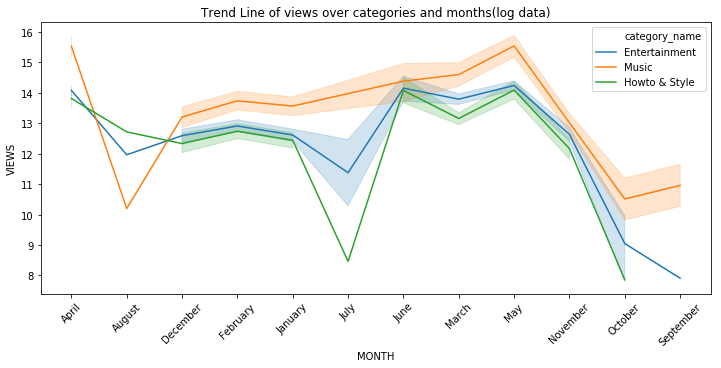

In [203]:

multi_line([12, 5], df_top3_cat, 'month', 'views','category_name', 45,
         'Trend Line of views over categories and months(log data)', 'normal_log')

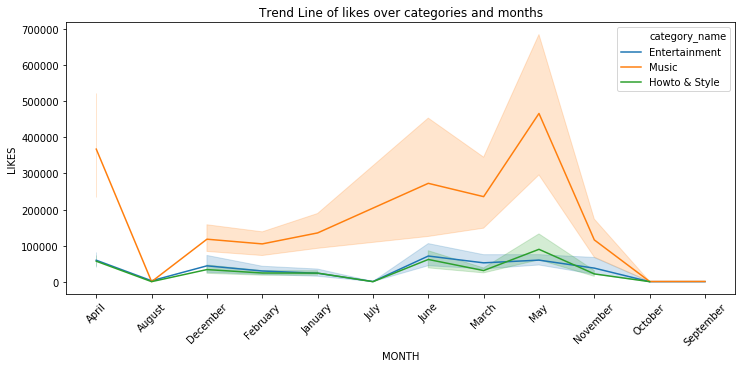

In [204]:


multi_line([12, 5], df_top3_cat, 'month', 'likes','category_name', 45,
         'Trend Line of likes over categories and months', 'normal')

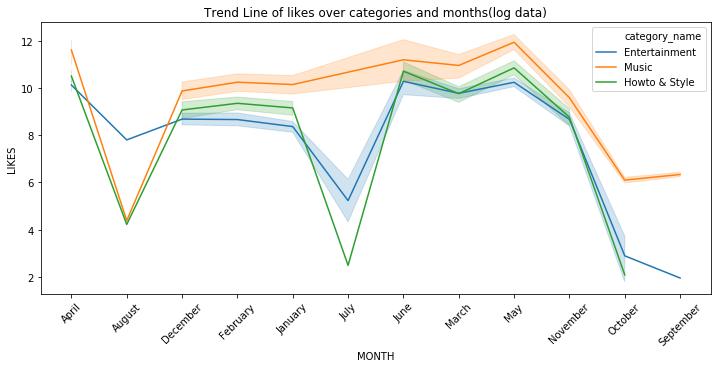

In [205]:


multi_line([12, 5], df_top3_cat, 'month', 'likes','category_name', 45,
         'Trend Line of likes over categories and months(log data)', 'normal_log')


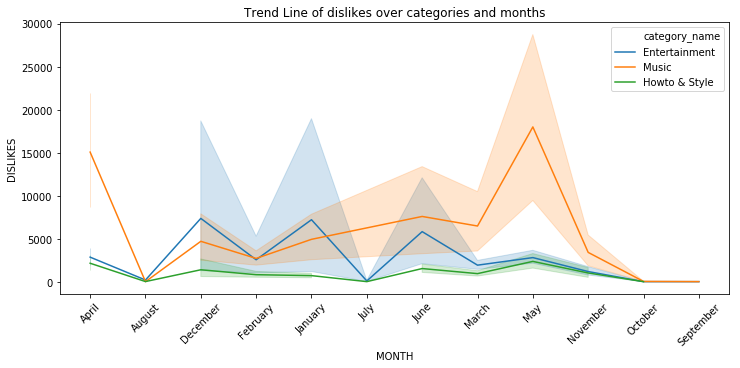

In [206]:

multi_line([12, 5], df_top3_cat, 'month', 'dislikes', 'category_name', 45,
         'Trend Line of dislikes over categories and months', 'normal')

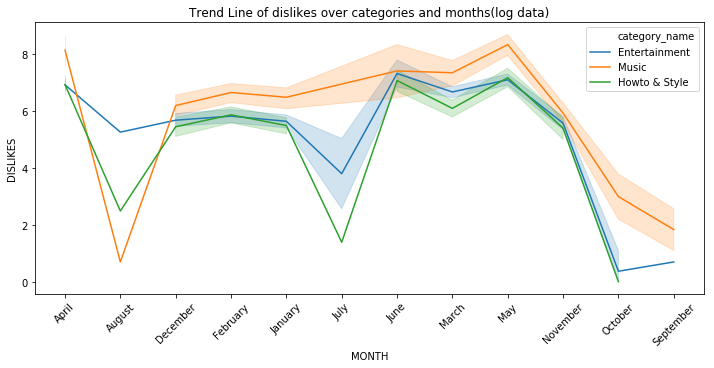

In [207]:


multi_line([12, 5], df_top3_cat, 'month', 'dislikes', 'category_name', 45,
         'Trend Line of dislikes over categories and months(log data)', 'normal_log')


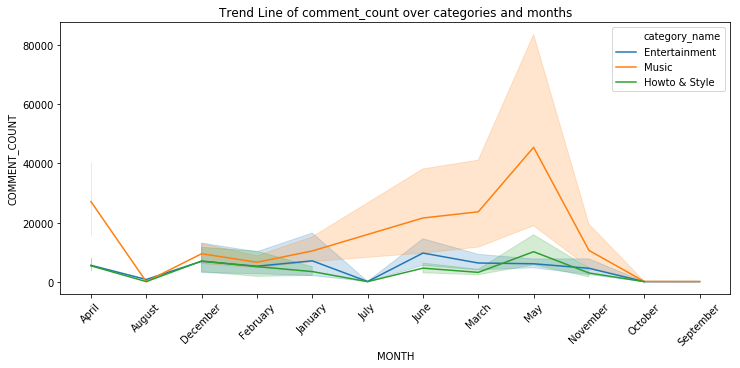

In [208]:

multi_line([12, 5], df_top3_cat, 'month', 'comment_count','category_name', 45,
         'Trend Line of comment_count over categories and months', 'normal')

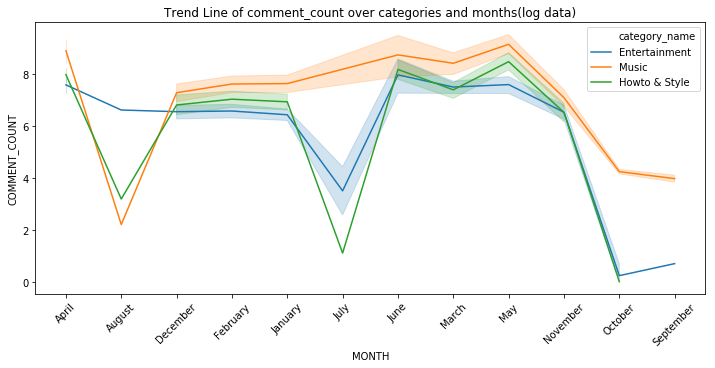

In [209]:


multi_line([12, 5], df_top3_cat, 'month', 'comment_count','category_name', 45,
         'Trend Line of comment_count over categories and months(log data)', 'normal_log')

**Comment:**

The trend lines of views, likes, dislikes, comments count over months is shows in the above trend line plots. They are explained in detail in Exploratory analysis.

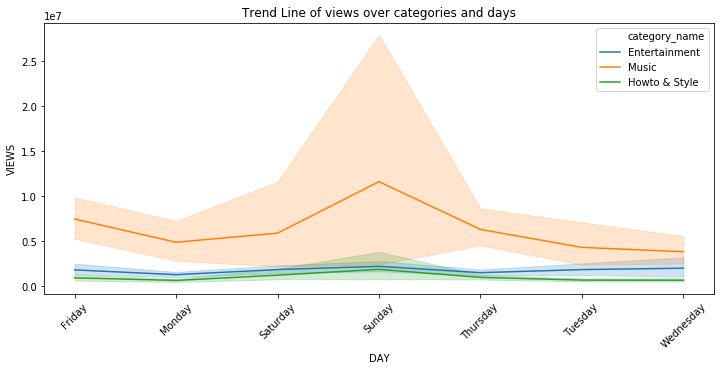

In [210]:
multi_line([12, 5], df_top3_cat, 'day', 'views', 'category_name', 45,
         'Trend Line of views over categories and days', 'normal')

**Comment:**

The above plot shows us the trend line of views for top 3 categories over days

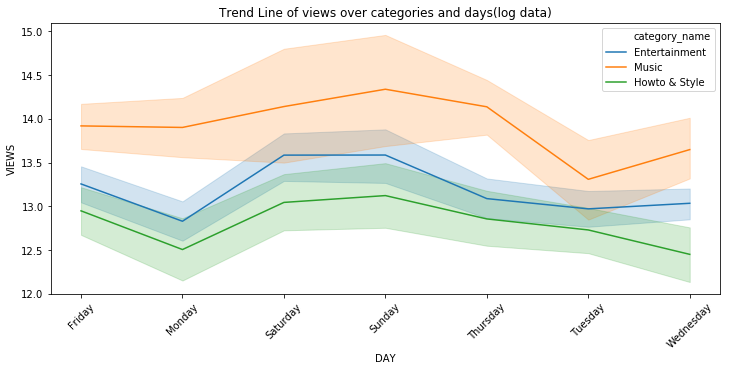

In [211]:


multi_line([12, 5], df_top3_cat, 'day', 'views','category_name', 45,
         'Trend Line of views over categories and days(log data)', 'normal_log')

**Comment:**

The above plot shows us the trend line of views for top 3 categories over days for log transformed data

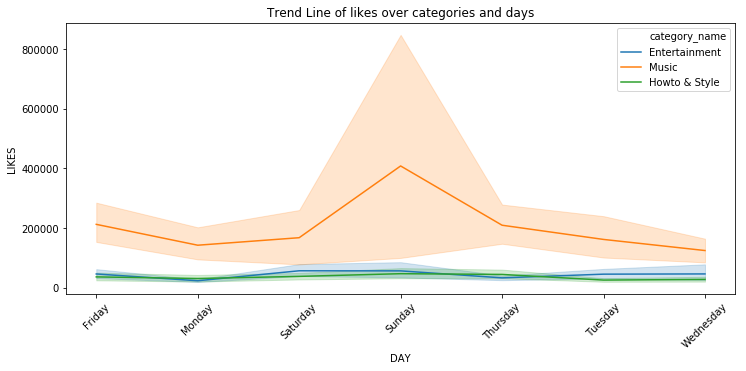

In [212]:


multi_line([12, 5], df_top3_cat, 'day', 'likes','category_name', 45,
         'Trend Line of likes over categories and days', 'normal')


**Comment:**

The above plot shows us the trend line of likes for top 3 categories over days


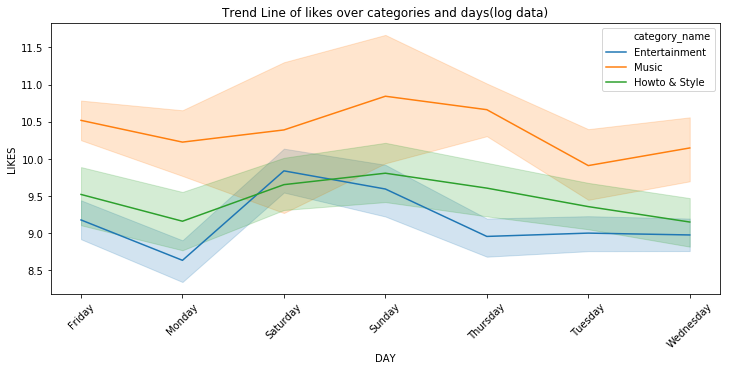

In [213]:

multi_line([12, 5], df_top3_cat, 'day', 'likes','category_name', 45,
         'Trend Line of likes over categories and days(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line of likes for top 3 categories over days for log transformed data

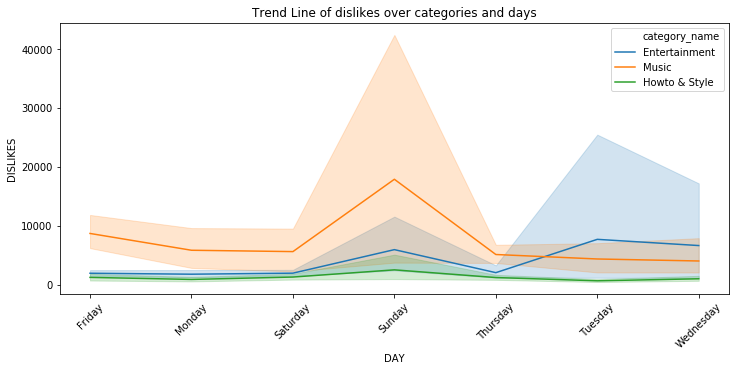

In [214]:

multi_line([12, 5], df_top3_cat, 'day', 'dislikes', 'category_name', 45,
         'Trend Line of dislikes over categories and days', 'normal')


**Comment:**

The above plot shows us the trend line of dislikes for top 3 categories over days


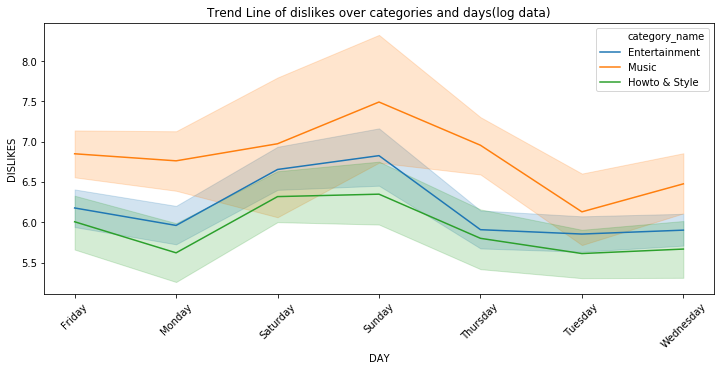

In [215]:

multi_line([12, 5], df_top3_cat, 'day', 'dislikes', 'category_name', 45,
         'Trend Line of dislikes over categories and days(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line of views for top 3 categories over days for log transformed data

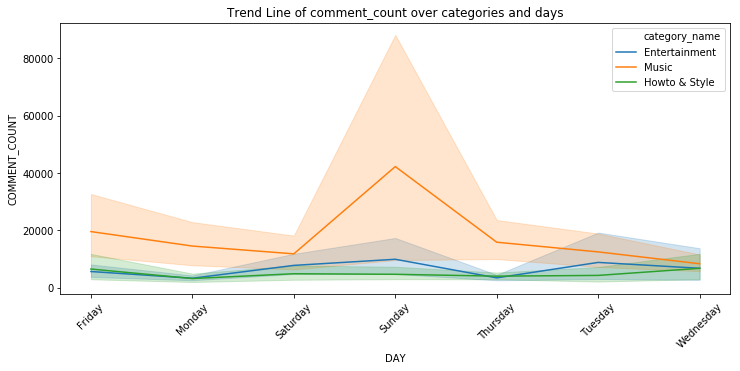

In [216]:

multi_line([12, 5], df_top3_cat, 'day', 'comment_count','category_name', 45,
         'Trend Line of comment_count over categories and days', 'normal')


**Comment:**

The above plot shows us the trend line of comment count for top 3 categories over days


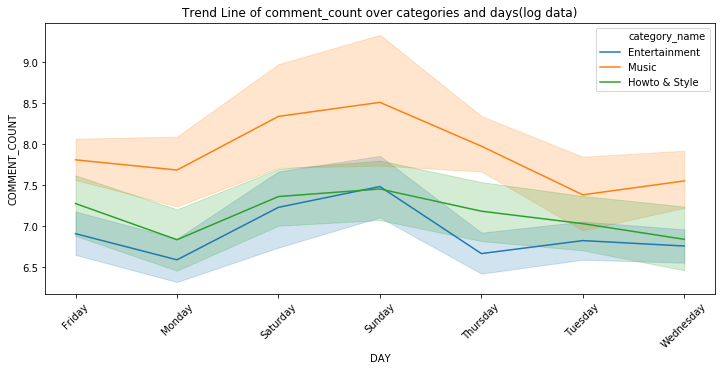

In [217]:

multi_line([12, 5], df_top3_cat, 'day', 'comment_count','category_name', 45,
         'Trend Line of comment_count over categories and days(log data)', 'normal_log')

**Comment:**

The above plot shows us the trend line of comment count for top 3 categories over days for log transformed data

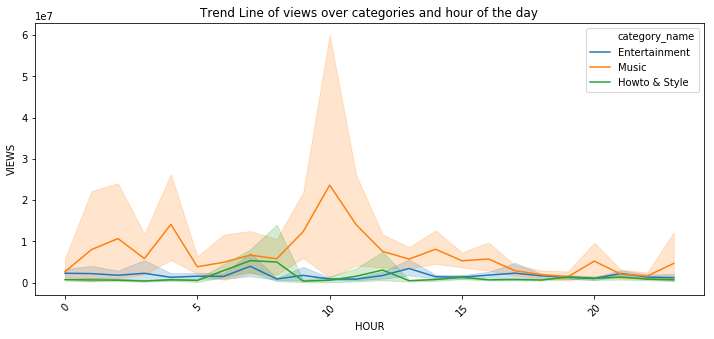

In [218]:
multi_line([12, 5], df_top3_cat, 'hour', 'views', 'category_name', 45,
         'Trend Line of views over categories and hour of the day', 'normal')

**Comment:**

The above plot shows us the trend line of views for top 3 categories over hours


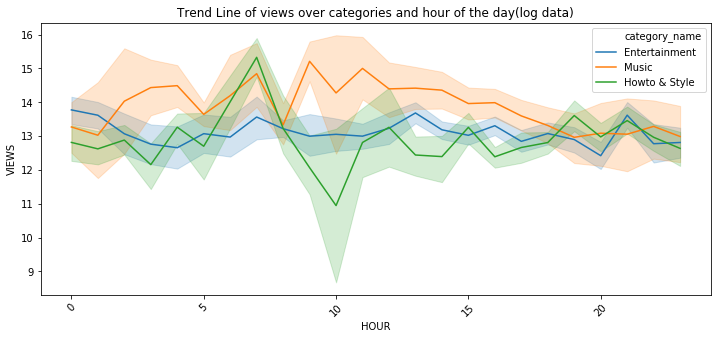

In [219]:


multi_line([12, 5], df_top3_cat, 'hour', 'views','category_name', 45,
         'Trend Line of views over categories and hour of the day(log data)', 'normal_log')



**Comment:**

The above plot shows us the trend line of views for top 3 categories over hours for log transformed data


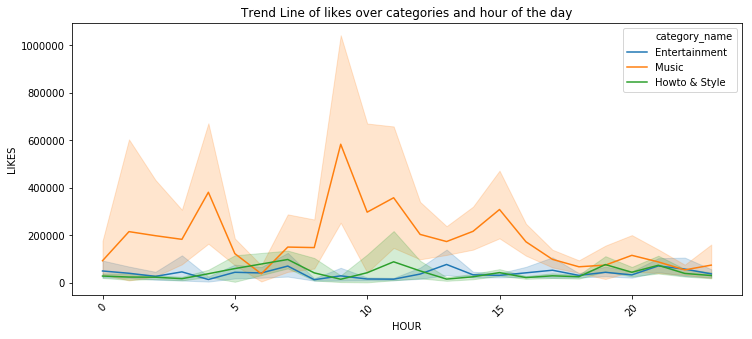

In [220]:

multi_line([12, 5], df_top3_cat, 'hour', 'likes','category_name', 45,
         'Trend Line of likes over categories and hour of the day', 'normal')



**Comment:**

The above plot shows us the trend line of likes for top 3 categories over hours


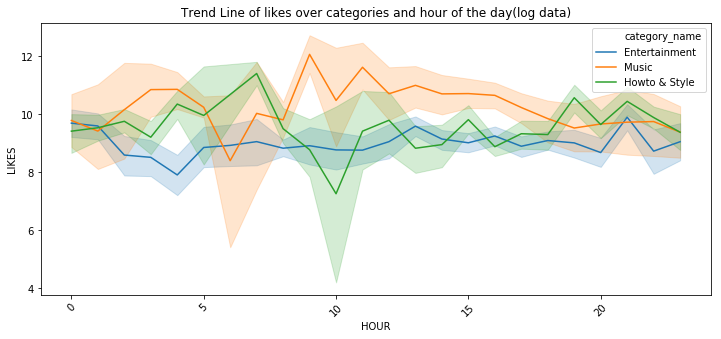

In [221]:

multi_line([12, 5], df_top3_cat, 'hour', 'likes','category_name', 45,
         'Trend Line of likes over categories and hour of the day(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line of likes for top 3 categories over hours for log transformed data


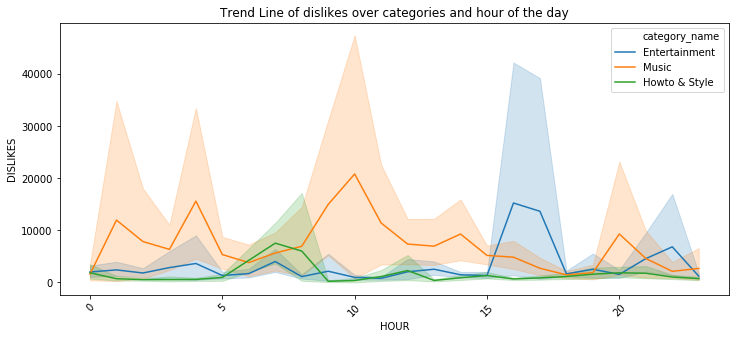

In [222]:

multi_line([12, 5], df_top3_cat, 'hour', 'dislikes', 'category_name', 45,
         'Trend Line of dislikes over categories and hour of the day', 'normal')


**Comment:**

The above plot shows us the trend line of dislikes for top 3 categories over hours


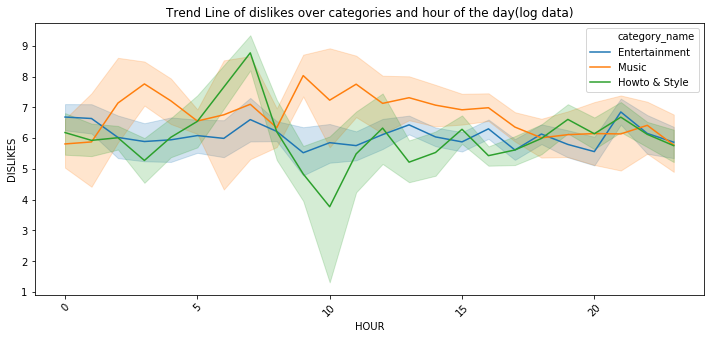

In [223]:

multi_line([12, 5], df_top3_cat, 'hour', 'dislikes', 'category_name', 45,
         'Trend Line of dislikes over categories and hour of the day(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line of dislikes for top 3 categories over hours for log transformed data


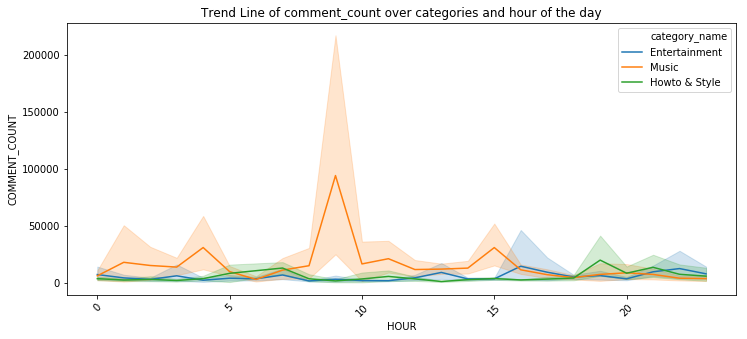

In [224]:

multi_line([12, 5], df_top3_cat, 'hour', 'comment_count','category_name', 45,
         'Trend Line of comment_count over categories and hour of the day', 'normal')

**Comment:**

The above plot shows us the trend line of comment count for top 3 categories over hours


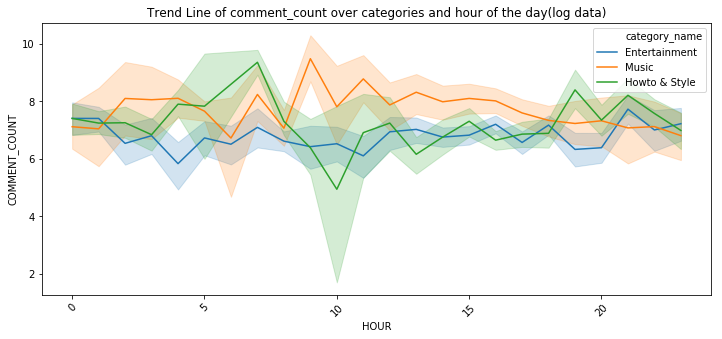

In [225]:


multi_line([12, 5], df_top3_cat, 'hour', 'comment_count','category_name', 45,
         'Trend Line of comment_count over categories and hour of the day(log data)', 'normal_log')


**Comment:**

The above plot shows us the trend line of comment count for top 3 categories over hours for log transformed data

Lets write functions for multivariate scatter plots

In [226]:
def multi_plot(figsize, data, x, y, z, title, typee):
    if typee == 'hue':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        sns.scatterplot(y= y, x= x, data = data,
                   hue = z, style = z)
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'hue_log':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        sns.scatterplot(y= y, x= x, data = data,
                   hue = z, style = z)
        #lets view the data in log scale
        plt.xscale('log');
        plt.yscale('log');
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'hue_log_data':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        x1= np.log(data[x])
        y1= np.log(data[y])
        sns.scatterplot(y= y1, x= x1, data = data,
                   hue = z, style = z)
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'size':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        sns.scatterplot(y= y, x= x, data = data,
                   hue = z, size = z)
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'size_log':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        sns.scatterplot(y= y, x= x, data = data,
                   hue = z, size = z)
        #lets view the data in log scale
        plt.xscale('log');
        plt.yscale('log');
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    elif typee == 'size_log_data':
        #figsize
        plt.figure(figsize = (figsize[0], figsize[1]))
        #plot the data
        x1= np.log(data[x])
        y1= np.log(data[y])
        sns.scatterplot(y= y1, x= x1, data = data,
                   hue = z, size = z)
        #set axis labels and title
        plt.ylabel(y.upper())
        plt.xlabel(x.upper())
        plt.title(title);
    else:
        print('please check typee')


Now lets try to find the corelation between variables over categories and channels using scatterplot for top 3 categories and top three channels

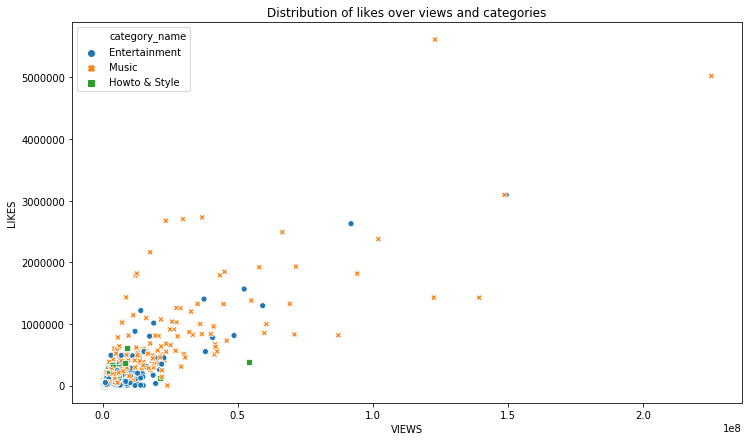

In [227]:
multi_plot([12,7], df_top3_cat, 'views', 'likes', 'category_name', 
           'Distribution of likes over views and categories', 'hue')

**Comment:**

The above plot scatter plot helps us find corelation between variables. Here we can see that view and likes have a positive corelation. But as the data has large scale issue we will have cross check the relation. Lets check corelation in log transformed data


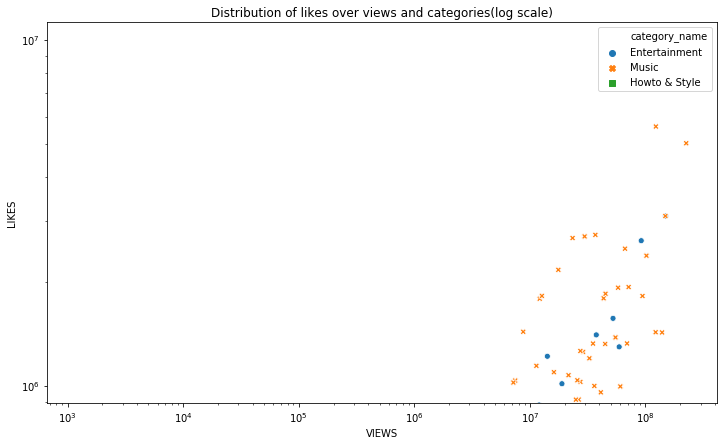

In [228]:
multi_plot([12,7], df_top3_cat, 'views', 'likes', 'category_name', 
           'Distribution of likes over views and categories(log scale)', 'hue_log')

**Comment:**

The log scale data doesnt show much data because of scale issues. Lets check the log transformed data.


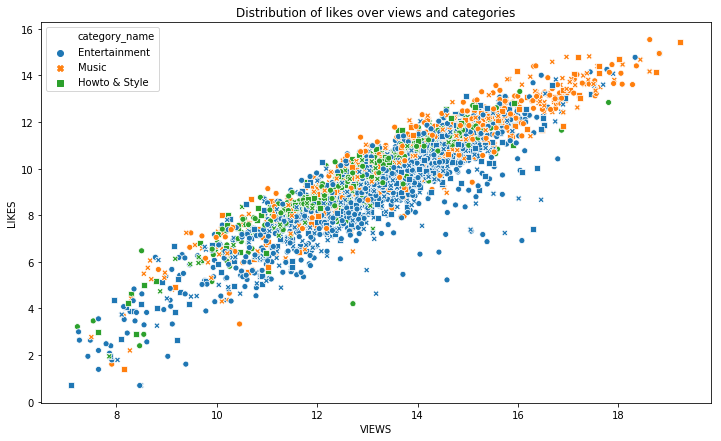

In [229]:
multi_plot([12,7], df_top3_cat, 'views', 'likes', 'category_name', 
           'Distribution of likes over views and categories', 'hue_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between views and likes is positive and strong

Lets check the corelation for views and dislikes

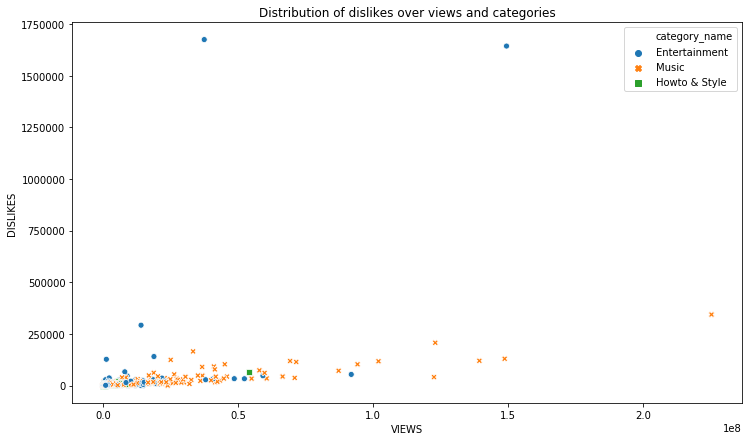

In [230]:
multi_plot([12,7], df_top3_cat, 'views', 'dislikes', 'category_name', 
           'Distribution of dislikes over views and categories', 'hue')


**Comment:**

The above plot scatter plot helps us find corelation between variables. Here we can see that views and dislikes doesn't seem to have any corelation. But as the data has large scale issue we will have cross check the relation. Lets check corelation in log transformed data


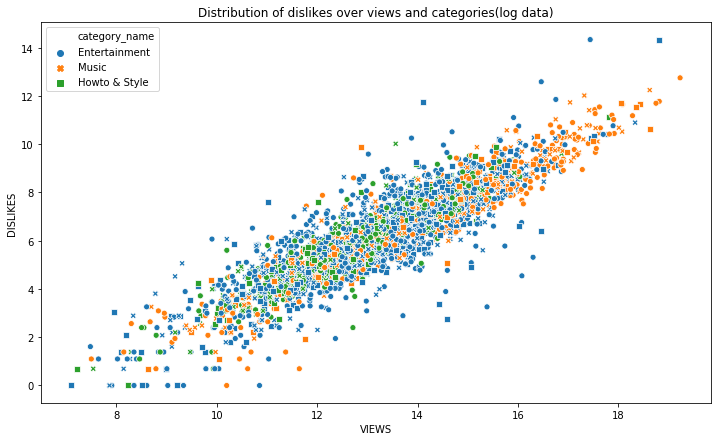

In [231]:

multi_plot([12,7], df_top3_cat, 'views', 'dislikes', 'category_name', 
           'Distribution of dislikes over views and categories(log data)', 'hue_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between views and dislikes is positive.

Lets check the corelation for views and comments count

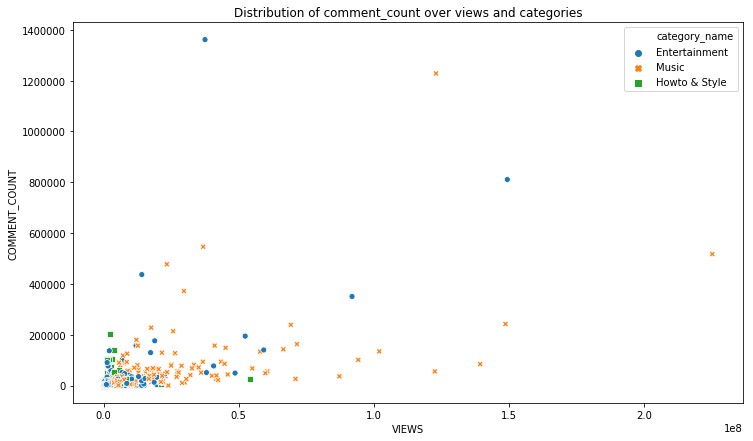

In [232]:
multi_plot([12,7], df_top3_cat, 'views', 'comment_count', 'category_name', 
           'Distribution of comment_count over views and categories', 'hue')

**Comment:**

The above plot scatter plot helps us find corelation between variables. Here we can see that views and comments count seems to have a positive corelation but very weak relation. But as the data has large scale issue we will have cross check the relation. Lets check corelation in log transformed data


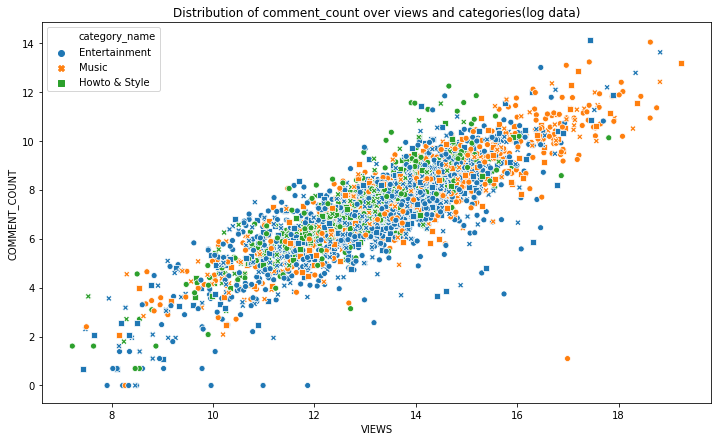

In [233]:

multi_plot([12,7], df_top3_cat, 'views', 'comment_count', 'category_name', 
           'Distribution of comment_count over views and categories(log data)', 'hue_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between views and likes is positive.

Lets check the corelation for views and likes for top 3 channels.

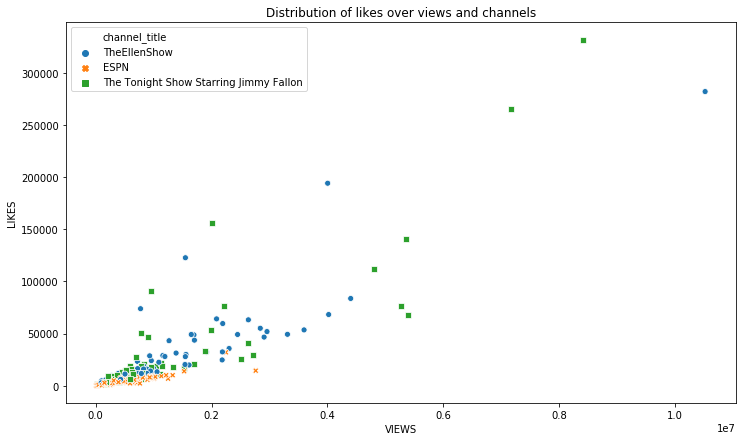

In [234]:
multi_plot([12,7], df_top3_chn, 'views', 'likes', 'channel_title', 
           'Distribution of likes over views and channels', 'hue')

**Comment:**

The above plot scatter plot helps us find corelation between variables. Here we can see that views and likes have a positive corelation. But as the data has large scale issue we will have cross check the relation. Lets check corelation in log transformed data


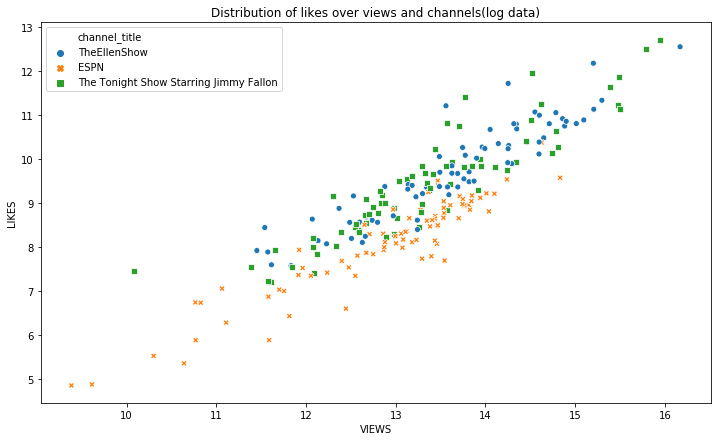

In [235]:

multi_plot([12,7], df_top3_chn, 'views', 'likes', 'channel_title', 
           'Distribution of likes over views and channels(log data)', 'hue_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between views and likes is positive and strong

Lets check the corelation for views and dislikes

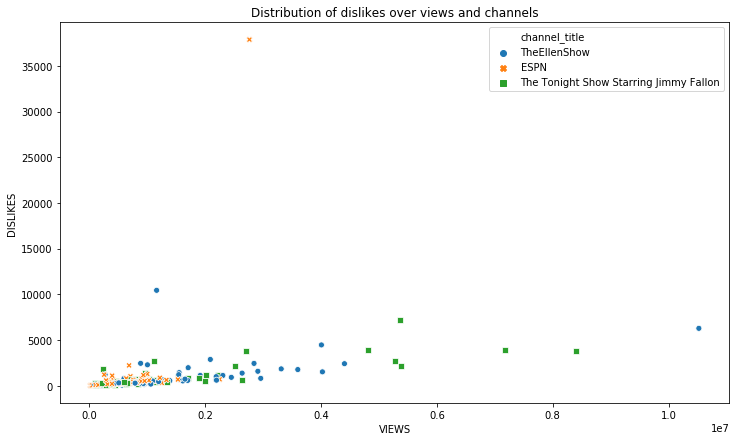

In [236]:
multi_plot([12,7], df_top3_chn, 'views', 'dislikes', 'channel_title', 
           'Distribution of dislikes over views and channels', 'hue')



**Comment:**

The above plot scatter plot helps us find corelation between variables. Here we can see that view and dislikes doesn't have a proper corelation. But as the data has large scale issue we will have cross check the relation. Lets check corelation in log transformed data


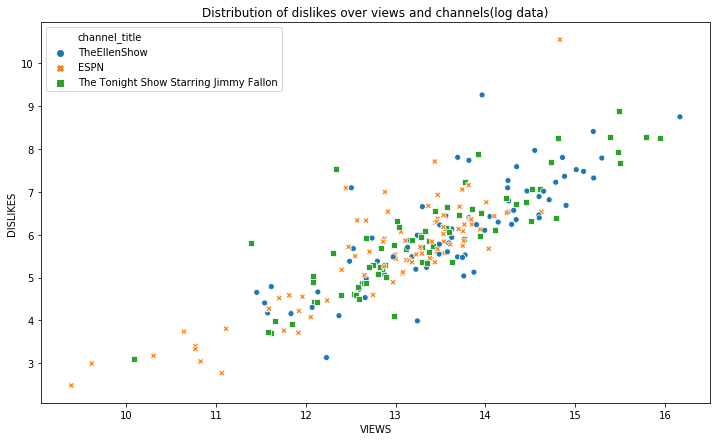

In [237]:

multi_plot([12,7], df_top3_chn, 'views', 'dislikes', 'channel_title', 
           'Distribution of dislikes over views and channels(log data)', 'hue_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between views and dislikes is positive and strong

Lets check the corelation for views and comments count

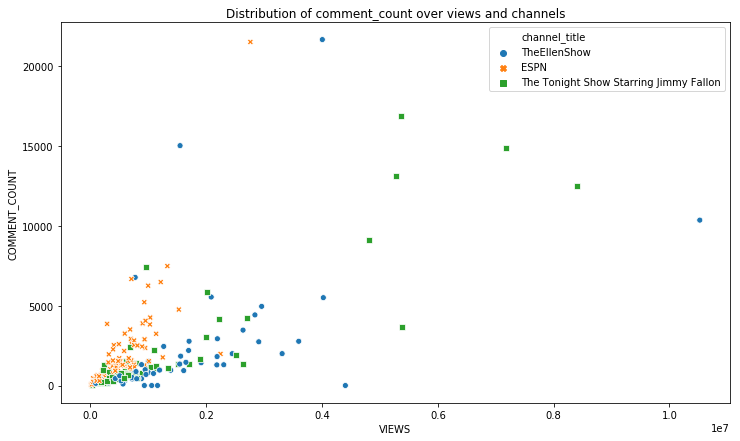

In [238]:
multi_plot([12,7], df_top3_chn, 'views', 'comment_count', 'channel_title', 
           'Distribution of comment_count over views and channels', 'hue')



**Comment:**

The above plot scatter plot helps us find corelation between variables. Here we can see that view and comment count have a positive corelation but weak relation. But as the data has large scale issue we will have to cross check the relation. Lets check corelation in log transformed data


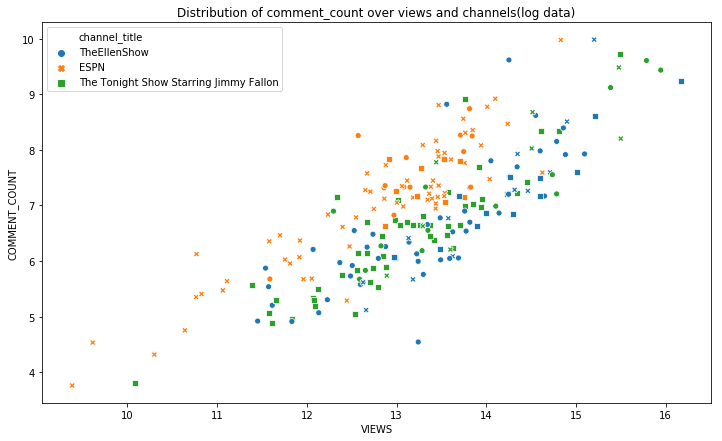

In [239]:

multi_plot([12,7], df_top3_chn, 'views', 'comment_count', 'channel_title', 
           'Distribution of comment_count over views and channels(log data)', 'hue_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between views and comments count is positive and weak.

Lets check the corelation for likes, dislikes and comments count for all the data

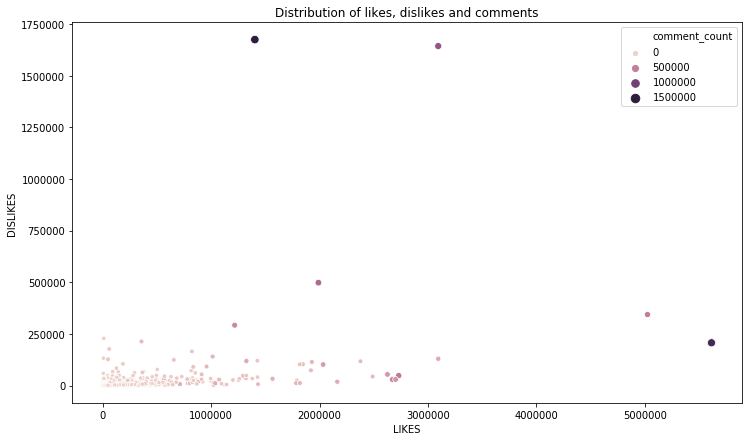

In [240]:

multi_plot([12,7], df_videos, 'likes', 'dislikes', 'comment_count', 
           'Distribution of likes, dislikes and comments', 'size')

**Comment:**

From the above plot it is hard to get a insight of how the data is corelated to eachother because of large scale issue. Lets try and plot the data with log scale and log trasformed data to see if we can get a better insight.

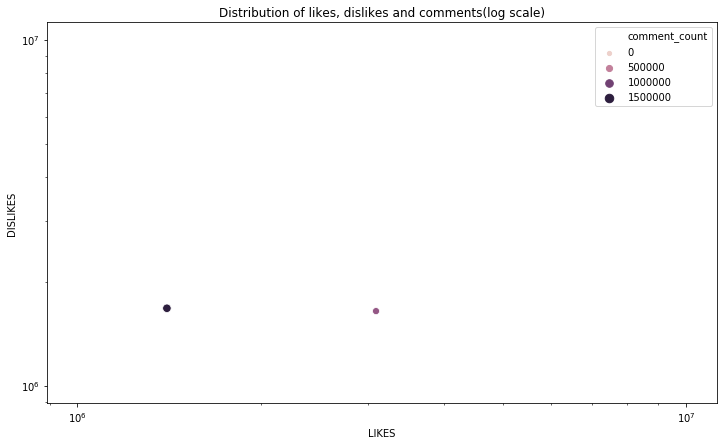

In [241]:

multi_plot([12,7], df_videos, 'likes', 'dislikes', 'comment_count', 
           'Distribution of likes, dislikes and comments(log scale)', 'size_log')


**Comment:**

The log scale data doesnt show any data because of scale issues. Lets check the log transformed data.


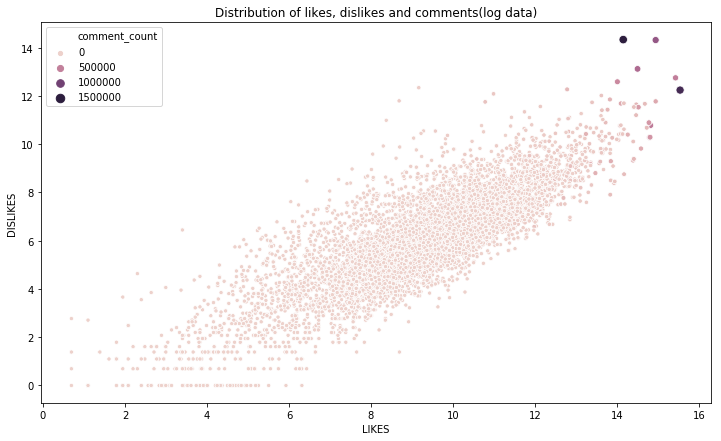

In [242]:

multi_plot([12,7], df_videos, 'likes', 'dislikes', 'comment_count', 
           'Distribution of likes, dislikes and comments(log data)', 'size_log_data')

**Comment:**

From the plot of log transformed data we can see that the corelation between likes, dislikes and comments count is positive and strong but we can also see that the relation is weak for the min values of the data.


In [243]:
# save the cleaned dataset to csv file
df_videos = df_videos.to_csv('us_videos_cleaned.csv', index = False)


<a id='conclusions'></a>
## Conclusions and Limitations

In this report we work on dataset from kaggle which is youtube trending videos. We only access and analyze US youtube trending videos from November 2017 to July 2018 dataset. First we accessed the data to see if the data has any quality and tidiness issues, then we cleaned the identified data issues. After performing all cleaning we saved the dataset into a csv file for analysis and exploration of data visually.

Here we have many qualitative and quantitative variables, we also perform calculations to get new variables to help get better visualization and readable plots. In this report we performed univariate, bivariate, and multivariate plots to explore many relationships in the data set. 

From all the plots we learn that likes, comments have positive relation to any variable and dislikes sometimes have negative relation and also sometimes the relation of dislikes and other variables is not so clear. We also learnt that Entertainment category and ESPN channel has most published trending videos where as when we see the data spread of likes views and comments we notice that Music category have most views, likes and comments compared to others(explained in explanatory analysis file and slides). 

**LIMITATIONS:**

The insights drawn from the analysis and visualization is purely based on the given data. The major limitation with the data is having large scale and overplotting issues and outliers which made plots unreadable. We performed log calculations and applied log scale to make the plots readable. One other limitation is the performed analysis is purely for US zone and it may not apply for other zones provided in the dataset.

**SOURCES**

- https://www.kaggle.com/datasnaek/youtube-new

- UDACITY data visualization lessons

- https://www.geeksforgeeks.org/python-map-function/

- https://stackoverflow.com/questions/48614158/read-json-file-as-pandas-dataframe

- https://pandas.pydata.org/pandas-docs/version/0.22/api.html#datetimelike-properties

- https://stackoverflow.com/questions/29096381/num-day-to-name-day-with-pandas

- https://stackoverflow.com/questions/36410075/select-rows-from-a-dataframe-based-on-multiple-values-in-a-column-in-pandas